In [1]:
import pandas as pd
#pd.set_option('display.max_rows', None)
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib import path
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
import numpy as np
import netCDF4 as nc
np.set_printoptions(threshold=100000)
from shapely.geometry import Polygon, Point, MultiPoint
from shapely.ops import cascaded_union
from datetime import datetime, timedelta
import time
import warnings
import datetime
import math
from scipy.ndimage.interpolation import shift
import shapely.wkt
from scipy.stats import pearsonr,spearmanr,kendalltau, linregress
from scipy.optimize import curve_fit 

warnings.filterwarnings('ignore')
import seaborn as sns
sns.set(font_scale=1.4) 
from my_functions import sat_vap_press, vap_press, hot_dry_windy, haines
from os.path import exists

from sklearn.linear_model import Ridge, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance

from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import r2_score, mean_squared_log_error, confusion_matrix, classification_report, accuracy_score,explained_variance_score
from sklearn.feature_selection import RFE
from sklearn.model_selection import TimeSeriesSplit, cross_val_score, cross_validate, GridSearchCV, KFold, RandomizedSearchCV

from sklearn.neural_network import MLPRegressor

import xgboost as xgb

import datarobot as dr

import json

/data2/lthapa/miniconda3/envs/ML_py/lib/python3.7/site-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.8.1-CAPI-1.13.3). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


# Helper Functions

In [2]:
def combine_years(base_file_name, years): # for when all of one year is in a dataframe
    df_all = pd.DataFrame()
    for yr in years:
        filename = base_file_name.replace('YYYY', str(yr))
        df = pd.read_csv(filename)
        df_all = pd.concat([df_all, df], axis=0).reset_index(drop=True)
    return df_all

In [3]:
def combine_per_fire_csv(ids, prefix, str_check): #for when a variable is split by fire, takes a list of irwinids
    df_all = pd.DataFrame()
    for i_d in ids:
        for fname in os.listdir(prefix):
            if fname.startswith(i_d) & (str_check in fname):
                df_fire = pd.read_csv(prefix+fname)
                df_all = pd.concat([df_all, df_fire], axis=0).reset_index(drop=True)
    return df_all

In [4]:
def add_to_features(feats, data_to_add): #feats has the multi index of irwinID, day
    #multiindex = data_to_add.set_index(['irwinID', 'day'])
    feats = pd.merge(feats, data_to_add, how='inner', on=['irwinID', 'day']).drop(columns='Unnamed: 0')
    return feats

In [5]:
def generate_feature_vector(years, is_weighted, features_to_use):
    if 'rave' in features_to_use:
        rave = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_RAVE_Unweighted_12Z_day_start.csv', years)
        print('rave', len(rave))
        features = rave[['irwinID','day']].set_index(['irwinID', 'day'])
        features = add_to_features(features, rave).drop_duplicates()
        
    if 'hwp' in features_to_use:
        hwp = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_HWP_'+is_weighted+'_12Z_day_start.csv', years)
        print('hwp', len(hwp))
        features = add_to_features(features, hwp).drop_duplicates()

    if 'hdw' in features_to_use:
        hdw = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_HDW_'+is_weighted+'_12Z_day_start.csv', years)
        print('hdw', len(hdw))
        features = add_to_features(features, hdw).drop_duplicates()
        
    if 'resources' in features_to_use:
        """resources = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_resources/', '')"""
        resources = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_resources_split/', '')
        print('resources', len(resources))
        features = add_to_features(features, resources).drop_duplicates()
        
    if 'pft' in features_to_use:
        pft = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_pft/', is_weighted)
        print('pft', len(pft))
        features = add_to_features(features, pft).drop_duplicates()
        
    if 'smops' in features_to_use:
        smops = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_SMOPS_'+is_weighted+'_12Z_day_start.csv', years)
        print('smops', len(smops))
        features = add_to_features(features, smops).drop_duplicates()

    if 'imerg' in features_to_use:
        imerg = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_IMERG_FWI_'+is_weighted+'_12Z_day_start.csv', years)
        print('imerg', len(imerg))
        features = add_to_features(features, imerg).drop_duplicates()

    if 'pws' in features_to_use:
        pws = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_PWS_'+is_weighted+'_12Z_day_start.csv', years)
        print('pws', len(pws))
        features = add_to_features(features, pws).drop_duplicates()
        
    if 'loading' in features_to_use:
        loading = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_LOADING_'+is_weighted+'_12Z_day_start.csv', years)
        print('loading', len(loading))
        features = add_to_features(features, loading).drop_duplicates()
        
    """if 'slope' in features_to_use:
        slope = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_SLOPE_'+is_weighted+'_12Z_day_start.csv', years)
        print('slope', len(slope))
        features = add_to_features(features, slope).drop_duplicates()"""

    if 'ncar' in features_to_use:
        ncar = combine_per_fire_csv(np.unique(rave['irwinID'].values),   
                            './fire_features_ncar/', is_weighted)
        print('ncar', len(ncar))
        features = add_to_features(features, ncar).drop_duplicates()

    
    if 'esi' in features_to_use:
        esi = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_esi/', is_weighted)
        print('esi', len(esi))
        features = add_to_features(features, esi).drop_duplicates()
        
    if 'chi' in features_to_use:
        chi_2019 = combine_years('./fire_features_3/ClippedFiresYYYY_Daily_CHI_'+is_weighted+'_12Z_day_start.csv', years)
        chi_2020 = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_chi/', is_weighted)
        chi= pd.concat([chi_2019, chi_2020], axis=0).reset_index(drop=True)
        print('chi', len(chi))
        features = add_to_features(features, chi).drop_duplicates()
        
    if 'pop' in features_to_use:
        pop = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_pop/', is_weighted)
        print('pop', len(pop))
        features = add_to_features(features, pop).drop_duplicates()
        
    if 'structures' in features_to_use:
        structures = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_structures/', '')
        print('structures', len(structures))
        features = add_to_features(features, structures).drop_duplicates()
        
    if 'gridmet' in features_to_use:
        gridmet = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_gridmet/',is_weighted)
        gridmet= gridmet.rename({'wind_speed': 'wind_speed_gridmet','mean_vapor_pressure_deficit':'vpd_gridmet'}, axis='columns')
        print('gridmet', len(gridmet))
        features = add_to_features(features, gridmet).drop_duplicates()
        
    if 'slope' in features_to_use:
        slope = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_slope/',is_weighted)
        print('slope', len(slope))
        features = add_to_features(features, slope).drop_duplicates()
        
    if 'elevation' in features_to_use:
        elevation = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_elevation/',is_weighted)
        print('elevation', len(elevation))
        features = add_to_features(features, elevation).drop_duplicates()
        
    if 'heatwave' in features_to_use:
        heatwave = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_heatwave/','')
        print('heatwave', len(heatwave))
        features = add_to_features(features, heatwave).drop_duplicates()
        
    if 'hrrrmet' in features_to_use:
        hrrrmet = combine_per_fire_csv(np.unique(rave['irwinID'].values), 
                            './fire_features_hrrrmet/',is_weighted)
        hrrrmet= hrrrmet.rename({'wind_speed': 'wind_speed_hrrrmet','vpd_2m':'vpd_hrrrmet'}, axis='columns')
        print('hrrrmet', len(hrrrmet))
        features = add_to_features(features, hrrrmet).drop_duplicates()
        
    return features


In [6]:
def find_outliers(df, col_name):
    quantiles = df[col_name].quantile(q=[.25, .5, .75])
    print(quantiles)
    iqr = quantiles[0.75]-quantiles[0.25]
    lower_fence = quantiles[0.50]-(1.5*iqr)
    upper_fence = quantiles[0.50]+(1.5*iqr)
    print('lower and upper fences are: '+ str(lower_fence) + ', '+ str(upper_fence))
    df[col_name+'_is_outlier'] = np.where((df[col_name]<=lower_fence)| (df[col_name]>=upper_fence), True,False)
    return df

In [7]:
def shift_ndays(df_to_shift,ndays,name_col_to_shift, name_shifted_col, time_col):
    df_shifted = resample_daily(df_to_shift, time_col)
    for ii in range(len(name_shifted_col)):
        df_shifted[name_shifted_col[ii]] = df_shifted[name_col_to_shift[ii]].shift(ndays)
    return df_shifted

In [8]:
def resample_daily(df_nondaily, time_name):
    df_nondaily['datetime'] = pd.to_datetime(df_nondaily[time_name])
    df_nondaily = df_nondaily.set_index(['datetime'])
    df_daily = df_nondaily.resample('D').asfreq()
    df_daily = df_daily.reset_index()
    return df_daily

In [9]:
def get_dfeatures(df, names, suf_now, suf_back): #to today/yesterday, flip it later
    for name in names:
        df['d'+name+suf_now] = df[name+suf_now]/df[name+suf_back]
    return df

In [10]:
def plot_category_heatmap(data_plot, obs_label, mod_label, model_axis_label):
    conf_mat = confusion_matrix(data_plot[obs_label], data_plot[mod_label], labels=['decrease', 'no_change', 'increase'])
    columns = ['decrease', 'slight \n change', 'increase'] #makes sure the columns are in the right order
    df_cm = pd.DataFrame(conf_mat, index=columns, columns=columns)
    #swap order of rows and cols
    df_cm_reverse = df_cm.iloc[::-1]

    # Visualize it as a heatmap
    sns.heatmap(df_cm_reverse, annot=True,cmap='rocket_r', fmt='g' ) #fmt g keeps things out of scientific notation
    plt.xlabel(model_axis_label)
    plt.ylabel('True Class')
    plt.show()
    print(classification_report(data_plot[obs_label], data_plot[mod_label]))
    
    
def frp_hist2d(df_plot, x_data, y_data,log_x_data,log_y_data, cmap_name, v_min, v_max, x_axis_label):
    lr = linregress(df_plot[log_x_data], df_plot[log_y_data])
    errors = summarize_error(df_plot,y_data, log_y_data, x_data, log_x_data)
    norm = colors.Normalize(vmin=v_min, vmax=v_max)
    cmap=cm.get_cmap(cmap_name)
    fig, axn = plt.subplots()#figsize=(6,6))
    hist1=axn.hist2d(df_plot[log_x_data], df_plot[log_y_data],bins=20, norm=norm, cmap=cmap) 
    axn.plot(np.arange(-1,7), np.arange(-1,7), 'k-')
    axn.plot(np.arange(-1,7), np.arange(-1,7)*lr.slope+lr.intercept, 'r-')
    axn.text(0.2,3.8,y_data+'='+str(round(lr.slope,2))+'*'+x_data+'+'+str(round(lr.intercept,2))
            +'\n p='+str(round(lr.pvalue,5))
             +'\n Log FRP R2='+str(round(errors[0],3))
             +'\n FRP R2='+str(round(errors[1],3))
             +'\n FRP RMSE='+str(round(errors[2],3))
             +'\n FRP MAD='+str(round(errors[3],3)), fontsize=10)
    fig.colorbar(hist1[3], ax=axn)
    plt.xlim(0,6)
    plt.ylim(0,6)
    plt.ylabel('Observed Log(FRP)')
    plt.xlabel(x_axis_label)
    plt.show()


def summarize_error(df, truth_name, log_truth_name, method_name, log_method_name):
    log_r2 =r2_score(df[log_truth_name], df[log_method_name])
    r2 =r2_score(df[truth_name], df[method_name])
    rmse =RMSE(df[truth_name], df[method_name])
    mad =MAD(df[truth_name], df[method_name])
    
    return(log_r2, r2, rmse, mad)

def plot_2dhist_withfit(df_plot, x_data, y_data, log_x_data,log_y_data, inc_cutoff, dec_cutoff, title):
    lr = linregress(df_plot[log_x_data], df_plot[log_y_data])
    errors = summarize_error(df_plot,y_data, log_y_data, x_data, log_x_data)

    fig, axn = plt.subplots()#figsize=(6,6))
    

    plt.axhline(y=inc_cutoff, xmin=-1, xmax=1, color='g')
    plt.axhline(y=dec_cutoff, xmin=-1, xmax=1, color='g')
    
    plt.axvline(x=inc_cutoff, ymin=-1, ymax=1, color='g')
    plt.axvline(x=dec_cutoff, ymin=-1, ymax=1, color='g')
    
    sns.histplot(data=df_plot, x=log_x_data, y=log_y_data, bins=20,cbar=True, ax=axn) 
    plt.plot(np.arange(-1,2), np.arange(-1,2), 'k-')
    plt.plot(np.arange(-1,2), np.arange(-1,2)*lr.slope+lr.intercept, 'b-')
    
    plt.xlim(-1.5,1.5)
    plt.ylim(-1.5,1.5)
    
    
    #plt.text(-1.6,0.8,log_y_data+'=\n'+str(round(lr.slope,2))+'*'+log_x_data+'+'+str(round(lr.intercept,2)), fontsize=12)
    plt.text(-1.4, 0.3,log_y_data+'='+str(round(lr.slope,2))+'*'+log_x_data+'+'+str(round(lr.intercept,2))
            +'\n p='+str(round(lr.pvalue,5))
             +'\n Log SF R2='+str(round(errors[0],3))
             +'\n SF R2='+str(round(errors[1],3))
             +'\n SF RMSE='+str(round(errors[2],3))
             +'\n SF MAD='+str(round(errors[3],3)), fontsize=10)
    plt.title(title)
    plt.show()
    


In [11]:
def REC(y_pred, y_test):
    #percent_error = np.abs((y_pred-y_test)/y_test)*100
    percent_error = np.abs((y_pred-y_test)) #this is absolute error
    #thresholds = np.linspace(0,300, 61) #5% increments
    thresholds = np.arange(0,10, 0.1)
    #percent_error = np.abs(y_pred-y_test)
    #thresholds = np.linspace(0, 0.5e-6, 61) #5% increments
    acc = np.zeros(thresholds.shape)
    for ii in range(len(thresholds)):
        n_correct = len(percent_error[percent_error<=thresholds[ii]])
        acc[ii] = n_correct*100/len(y_test)
    return thresholds, acc

def AUC(acc):
    return(np.sum(acc*0.1)) #left hand approximation, assuming bins are 5 wide

# Medium post on error metrics https://towardsdatascience.com/time-series-forecast-error-metrics-you-should-know-cc88b8c67f27
def RMSE(y_pred,y_test):
    return np.sqrt(np.nanmean(((y_pred)-(y_test))**2))

def MAD(y_pred,y_test): #aka mean error
    return np.mean(np.abs(y_pred-y_test))

def MeAD(y_pred,y_test): #aka median error
    return np.nanmedian(np.abs(y_pred-y_test))

def mean_percent_error(y_pred,y_test):
    return(np.mean(np.abs(100*(y_pred-y_test)/y_test)))

def median_percent_error(y_pred,y_test):
    return(np.nanmedian(np.abs(100*(y_pred-y_test)/y_test)))

def fractional_error(y_pred, y_test):
    num=np.sum(np.abs(y_pred-y_test))
    denom=np.sum((y_pred+y_test)/2)
    return(num/denom)

def mdrae(y_test, y_pred, bnchmrk):
    return np.nanmedian(np.abs(y_test - y_pred)/np.abs(y_test - bnchmrk))

In [12]:
#IN forest: a trained random forest
#IN varnames: names of the training variables, list of strings
#IN plot_title: title of the resulting plot 
def plot_importances(forest, varnames,plot_title):
    tree_indices = np.arange(0, len(forest.feature_importances_)) + 0.5
    importances = forest.feature_importances_ #importances for all trees, so if you have 100 trees and 5 features this is a 100x5 (or 5x100) matrix
    std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
    df_plot = pd.DataFrame({'tree_indices': tree_indices, 'importances': importances, 'std':std, 'varnames':varnames})
    df_plot = df_plot.sort_values(by='importances').reset_index(drop=True) #sorts from high to low importance

    #make the figure 
    fig, (ax1) = plt.subplots(1, 1, figsize=(12, 20))
    ax1.barh(df_plot.index, df_plot['importances'], height=0.7,xerr = std) #horizontal bar plot
    ax1.set_yticks(df_plot.index) #set the ticks
    ax1.set_yticklabels(df_plot['varnames']) #set the names of the ticks
    ax1.set_ylim((-0.5, len(df_plot['importances']))) #the height of the figure depends on the # of variables plotted
    fig.tight_layout()
    plt.title(plot_title) #title!
    plt.show()

In [13]:
def plot_frp_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,20))

    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['percent_change_FRP_RMSE'],df_error_metrics_plot.index,c='orange',s=75, label='% decrease in RMSE')
    p2=ax.scatter(df_error_metrics_plot['percent_change_FRP_MAD'],df_error_metrics_plot.index,c='g',s=75,label='% decrease in MAD')
    p3=twin1.scatter(df_error_metrics_plot['FRP_R2'],df_error_metrics_plot.index, c='b',s=75,label='FRP R2')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'percent_change_FRP_RMSE'],c='orange', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'percent_change_FRP_MAD'],c='g', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'FRP_R2'],c='b', linestyle='--')

    #set properties of the x labels
    twin1.set_xlim([df_error_metrics['FRP_R2'].min(),df_error_metrics['FRP_R2'].max()+.01])
    ax.set_xlim([0.05, #np.min(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].min().values),
                 np.max(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].max().values)+.01])
    ax.set_xlabel("% decrease")
    ax.set_ylabel("Feature Configuration")
    twin1.set_xlabel("R2")


    twin1.xaxis.label.set_color('b')

    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='b', **tkw)

    ax.legend(handles=[p1, p2, p3], bbox_to_anchor=(0.45,1) )

    plt.show()
    
def plot_sf_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,13))

    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['percent_change_SF_RMSE'],df_error_metrics_plot.index,c='orange',s=75, label='% decrease in RMSE')
    p2=ax.scatter(df_error_metrics_plot['percent_change_SF_MAD'],df_error_metrics_plot.index,c='g',s=75,label='% decrease in MAD')
    p3=twin1.scatter(df_error_metrics_plot['SF_R2'],df_error_metrics_plot.index, c='b',s=75,label='SF R2')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'percent_change_SF_RMSE'],c='orange', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'percent_change_SF_MAD'],c='g', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'SF_R2'],c='b', linestyle='--')

    #set properties of the x labels
    twin1.set_xlim([df_error_metrics['SF_R2'].min(),df_error_metrics['SF_R2'].max()])
    ax.set_xlim([np.min(df_error_metrics[['percent_change_SF_RMSE', 'percent_change_SF_MAD']].min().values),
                 np.max(df_error_metrics[['percent_change_SF_RMSE', 'percent_change_SF_MAD']].max().values)+.01])
    ax.set_xlabel("% decrease")
    ax.set_ylabel("Feature Configuration")
    twin1.set_xlabel("R2")


    twin1.xaxis.label.set_color('b')

    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='b', **tkw)

    ax.legend(handles=[p1, p2, p3], bbox_to_anchor=(1,1) )

    plt.show()

def plot_recall_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,20))
    
    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['increase_recall'],df_error_metrics_plot.index,c='r',s=75, label='increases')
    p2=ax.scatter(df_error_metrics_plot['decrease_recall'],df_error_metrics_plot.index,c='c',s=75,label='decreases')
    p3=twin1.scatter(df_error_metrics_plot['no_change_recall'],df_error_metrics_plot.index, c='tan',s=75,label='slight change')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'increase_recall'],c='r', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'decrease_recall'],c='c', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'no_change_recall'],c='tan', linestyle='--')

    twin1.set_xlim([df_error_metrics['no_change_recall'].min(),df_error_metrics['no_change_recall'].max()])
    ax.set_xlim([0.05, #np.min(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].min().values),
                 np.max(df_error_metrics[['increase_recall', 'decrease_recall']].max().values)+.01])
    ax.set_xlabel("Percent of observations recalled")
    ax.set_ylabel("Feature Configuration")
    twin1.set_xlabel("Percent of slight changes recalled")

    
    twin1.xaxis.label.set_color('tan')


    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='tan', **tkw)

    ax.legend(handles=[p1, p2, p3], bbox_to_anchor=(0.7,1) )

    plt.show()
    
def plot_precision_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,20))
    
    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['increase_precision'],df_error_metrics_plot.index,c='r',s=75, label='increases')
    p2=ax.scatter(df_error_metrics_plot['decrease_precision'],df_error_metrics_plot.index,c='c',s=75,label='decreases')
    p3=twin1.scatter(df_error_metrics_plot['no_change_precision'],df_error_metrics_plot.index, c='tan',s=75,label='slight change')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'increase_precision'],c='r', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'decrease_precision'],c='c', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'no_change_precision'],c='tan', linestyle='--')

    twin1.set_xlim([df_error_metrics['no_change_precision'].min(),df_error_metrics['no_change_precision'].max()])
    ax.set_xlim([0.05, #np.min(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].min().values),
                 np.max(df_error_metrics[['increase_precision', 'decrease_precision']].max().values)+.01])
    ax.set_xlabel("Precision of modeled categories")
    ax.set_ylabel("Feature Configuration")


    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='tan', **tkw)

    ax.legend(handles=[p1, p2,p3], bbox_to_anchor=(0.4,1) )

    plt.show()

    
def plot_f1_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,20))
    
    #twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['increase_f1'],df_error_metrics_plot.index,c='r',s=75, label='increases')
    p2=ax.scatter(df_error_metrics_plot['decrease_f1'],df_error_metrics_plot.index,c='c',s=75,label='decreases')
    p3=ax.scatter(df_error_metrics_plot['no_change_f1'],df_error_metrics_plot.index, c='tan',s=75,label='slight change')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'increase_f1'],c='r', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'decrease_f1'],c='c', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'no_change_f1'],c='tan', linestyle='--')

    #twin1.set_xlim([df_error_metrics['no_change_f1'].min(),df_error_metrics['no_change_f1'].max()])
    ax.set_xlim([0.2, #np.min(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].min().values),
                 np.max(df_error_metrics[['increase_f1', 'decrease_f1', 'no_change_f1']].max().values)+.005])
    ax.set_xlabel("F1 of modeled categories")
    ax.set_ylabel("Feature Configuration")


    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    #twin1.tick_params(axis='x', colors='tan', **tkw)

    ax.legend(handles=[p1, p2,p3], bbox_to_anchor=(0.45,1) )

    plt.show()

In [14]:
def plot_correlations(df_all, fig_title,correlation_type, font_size):
    #make the correlation matrix
    corrMatrix = df_all.corr(method=correlation_type)
    
    #plot it
    fig,ax=plt.subplots(figsize=(25,25))
    sns.heatmap(corrMatrix, annot=True,vmin=-1, vmax=1, cmap='seismic', annot_kws={'fontsize':font_size})
    plt.title(fig_title, fontsize=20)
    plt.show()

# Prepare the features for ML

the generate_feature_vector code generates duplicate rows that must be dropped

In [15]:
features = generate_feature_vector([2019,2020,2021], 'Weighted', ['rave', 'hwp', 'hdw', 'imerg', 'gridmet','hrrrmet',
                                                                  'heatwave',''
                                                                  'pft', 'chi',
                                                                  'smops','ncar',
                                                                  'pws','esi',
                                                                  'loading',
                                                                  'slope','elevation',
                                                                  'resources','pop','structures'])
print('With one day fires: ', len(np.unique(features['irwinID'])), len(features))

rave 5432
hwp 5432
hdw 5432
resources 11146
pft 5432
smops 5432
imerg 5339
pws 5432
loading 5432
ncar 5199
esi 5444
chi 6437
pop 5432
structures 12296
gridmet 5353
slope 5432
elevation 5432
heatwave 5353
hrrrmet 5353
With one day fires:  386 4795


In [16]:
# drop fires that last one day
features_ge_2 = features[features.groupby('irwinID')['day'].transform('size').ge(2)].reset_index(drop=True)
print('Dropping one day fires: ', len(np.unique(features_ge_2['irwinID'])), len(features_ge_2))

features_ge_3 = features[features.groupby('irwinID')['day'].transform('size').ge(3)].reset_index(drop=True)
print('Dropping one and two day fires: ', len(np.unique(features_ge_3['irwinID'])), len(features_ge_3))

features_ge = features_ge_2

Dropping one day fires:  327 4736
Dropping one and two day fires:  258 4598


In [17]:
print(features_ge.columns.values)

['irwinID' 'day' 'FRP_MEAN' 'hwp' 'hd0w0' 'hd1w0' 'hd2w0' 'hd3w0'
 'personnel' 'crew_quantity' 'crew_personnel' 'engine_quantity'
 'engine_personnel' 'air_quantity' 'air_personnel' 'construction_quantity'
 'construction_personnel' 'overhead_personnel' 'percent_contained' 'U_ml'
 'z_fc' 'dtheta_fc' 'PFT' 'Blended_SM' 'IMERG.FINAL.v6_DC'
 'IMERG.FINAL.v6_DMC' 'IMERG.FINAL.v6_FFMC' 'IMERG.FINAL.v6_ISI'
 'IMERG.FINAL.v6_BUI' 'IMERG.FINAL.v6_FWI' 'IMERG.FINAL.v6_DSR' 'PWS'
 'Extreme_N' 'VeryHigh_N' 'High_N' 'Moderate_N' 'Low_N' 'FMCG2D'
 'FMCGLH2D' 'ESI' 'temp_850' 'temp_700' 'dewpt_850' 'ca' 'cb' 'chi'
 'POP_DENSITY' 'structures_destroyed' 'structures_damaged'
 'structures_threatened_72' 'burning_index_g' 'energy_release_component-g'
 'potential_evapotranspiration_alfalfa'
 'potential_evapotranspiration_grass' 'dead_fuel_moisture_1000hr'
 'dead_fuel_moisture_100hr' 'precipitation_amount' 'max_relative_humidity'
 'min_relative_humidity' 'specific_humidity'
 'surface_downwelling_shortwave_fl

### One Day of Shifting

In [18]:
#shift the features
events = np.unique(features_ge['irwinID']) #all the incidents

features_to_shift = ['FRP_MEAN',
                     'vpd_gridmet', 'wind_speed_gridmet',#raw weather
                     'vpd_hrrrmet', 'wind_speed_hrrrmet',#raw weather
                     'hwp', 'hd0w0', 'hd1w0', 'hd2w0', 'hd3w0', #derived weather
                     'IMERG.FINAL.v6_FWI','IMERG.FINAL.v6_BUI', 'burning_index_g','energy_release_component-g',
                     'PFT', 'chi', 
                     'percent_contained',
                     'personnel', 'crew_quantity', 'crew_personnel','engine_quantity', 'engine_personnel', 'air_quantity', 
                    'air_personnel','construction_quantity', 'construction_personnel','overhead_personnel',
                    'structures_destroyed', 'structures_damaged', 'structures_threatened_72']#features_ge.columns.values[2:]
features_shifted_1 = [] #one day shifts

print(features_to_shift)

for ii in range(len(features_to_shift)):
    features_shifted_1.append(features_to_shift[ii]+'_1')


features_with_shifts_weighted = pd.DataFrame()

for jj in range(len(events)):
    df_fire = features_ge[features_ge['irwinID']==events[jj]].drop_duplicates(subset='day') #removes duplicate rows
    df_fire_shifted_1 = shift_ndays(df_fire, 1, features_to_shift, features_shifted_1, 'day')

    
    
    df_fire_concat = pd.concat([df_fire_shifted_1], axis=1)    
    
    features_with_shifts_weighted = pd.concat([features_with_shifts_weighted, 
                                               df_fire_concat], axis=0).reset_index(drop=True)
    

#get the scaling factor
features_with_shifts_weighted['Scaling_Factor'] = features_with_shifts_weighted['FRP_MEAN']/features_with_shifts_weighted['FRP_MEAN_1']

#get the log of the scaling factor
features_with_shifts_weighted['Log_Scaling_Factor']= np.log10(features_with_shifts_weighted['Scaling_Factor'])

#replace infs with nans, dropping days that were added for the shift as well as days where the scaling factor may have gone to inf
features_with_shifts_weighted.replace([np.inf, -np.inf], np.nan, inplace=True)

#drop nans (get rid of this for testing the 19/20 WF/DIXIE case)
features_with_shifts_weighted = features_with_shifts_weighted.dropna(axis=0,how='any').reset_index(drop=True)
print(len(features_with_shifts_weighted))

#get the outliers
features_with_shifts_weighted = find_outliers(features_with_shifts_weighted, 'Log_Scaling_Factor')
print(len(features_with_shifts_weighted[features_with_shifts_weighted['Log_Scaling_Factor_is_outlier']==False]))
print(features_with_shifts_weighted.head()) #this is ordered by the irwinID, so 2019 and 2020 will be somewhat jumbled

['FRP_MEAN', 'vpd_gridmet', 'wind_speed_gridmet', 'vpd_hrrrmet', 'wind_speed_hrrrmet', 'hwp', 'hd0w0', 'hd1w0', 'hd2w0', 'hd3w0', 'IMERG.FINAL.v6_FWI', 'IMERG.FINAL.v6_BUI', 'burning_index_g', 'energy_release_component-g', 'PFT', 'chi', 'percent_contained', 'personnel', 'crew_quantity', 'crew_personnel', 'engine_quantity', 'engine_personnel', 'air_quantity', 'air_personnel', 'construction_quantity', 'construction_personnel', 'overhead_personnel', 'structures_destroyed', 'structures_damaged', 'structures_threatened_72']
3373
0.25   -0.477343
0.50   -0.020185
0.75    0.421403
Name: Log_Scaling_Factor, dtype: float64
lower and upper fences are: -1.3683050962989678, 1.3279349808483203
3014
    datetime                               irwinID         day      FRP_MEAN  \
0 2020-09-10  00B3EDB2-87A4-4D0A-A834-4E1012BF9693  2020-09-10  14731.512078   
1 2020-09-11  00B3EDB2-87A4-4D0A-A834-4E1012BF9693  2020-09-11   2706.065915   
2 2020-09-12  00B3EDB2-87A4-4D0A-A834-4E1012BF9693  2020-09-12   

In [19]:
features_relative = get_dfeatures(features_with_shifts_weighted,
                                  [
                     'vpd_gridmet', 'wind_speed_gridmet',
                     'vpd_hrrrmet', 'wind_speed_hrrrmet',
                     'hwp', 'hd0w0', 'hd1w0', 'hd2w0', 'hd3w0', 
                     'IMERG.FINAL.v6_FWI','IMERG.FINAL.v6_BUI', 'burning_index_g','energy_release_component-g',
                     'PFT', 'chi', ], 
                                '', '_1') #to today/yesterday, flip it later
features_relative

,datetime,irwinID,day,FRP_MEAN,hwp,hd0w0,hd1w0,hd2w0,hd3w0,personnel,...,dhd0w0,dhd1w0,dhd2w0,dhd3w0,dIMERG.FINAL.v6_FWI,dIMERG.FINAL.v6_BUI,dburning_index_g,denergy_release_component-g,dPFT,dchi
0,2020-09-10,00B3EDB2-87A4-4D0A-A834-4E1012BF9693,2020-09-10,14731.512078,20.266123,76.251916,71.615403,56.609646,65.150074,161.0,...,0.458325,0.550687,0.399642,0.468245,0.880133,1.021306,0.644607,1.029211,0.574754,1.110429
1,2020-09-11,00B3EDB2-87A4-4D0A-A834-4E1012BF9693,2020-09-11,2706.065915,4.070484,45.794999,63.764926,64.395492,51.311115,228.0,...,0.600575,0.890380,1.137536,0.787583,0.850910,1.002732,0.314633,0.763529,1.794887,0.805037
2,2020-09-12,00B3EDB2-87A4-4D0A-A834-4E1012BF9693,2020-09-12,1349.205056,5.601118,40.359152,43.245293,55.749052,53.689521,262.0,...,0.881300,0.678199,0.865729,1.046353,0.908600,1.004065,2.803561,1.225054,2.048905,1.041910
3,2020-09-13,00B3EDB2-87A4-4D0A-A834-4E1012BF9693,2020-09-13,144.146576,7.664088,38.327457,37.678304,42.160805,50.909355,284.0,...,0.949660,0.871269,0.756260,0.948218,0.608108,0.869195,0.970324,1.031642,1.436864,1.191298
4,2020-09-14,00B3EDB2-87A4-4D0A-A834-4E1012BF9693,2020-09-14,6632.251236,4.327472,30.957482,28.211336,28.481330,30.379819,367.0,...,0.807710,0.748742,0.675540,0.596743,1.073250,1.159620,0.937326,0.868568,8.327272,0.916140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3368,2020-11-06,FF65A04D-419D-4791-BAA4-FBBAB29AA03F,2020-11-06,744.962650,18.123903,49.311801,73.675495,57.912320,54.821594,32.0,...,0.835394,1.588194,1.327220,1.415159,1.034771,1.015233,0.854205,0.924180,0.034481,0.315213
3369,2019-08-05,FFB76BC8-8D44-4C76-9EBF-8C21A102BEEA,2019-08-05,35859.885506,26.468965,103.244273,102.551687,99.557550,94.726957,308.0,...,0.721067,0.759316,0.774611,0.852768,0.987846,1.014045,0.793412,0.984690,1.235748,0.989617
3370,2019-08-06,FFB76BC8-8D44-4C76-9EBF-8C21A102BEEA,2019-08-06,7581.656204,30.501696,131.392407,126.678070,126.411251,122.512574,415.0,...,1.272636,1.235261,1.269730,1.293323,0.859460,1.027729,1.101700,1.022178,0.892821,1.000944
3371,2019-08-07,FFB76BC8-8D44-4C76-9EBF-8C21A102BEEA,2019-08-07,493.522446,15.781312,90.719094,109.778669,106.745789,107.452266,404.0,...,0.690444,0.866596,0.844433,0.877071,0.786791,0.997046,0.815622,0.951985,0.426011,0.907609


In [20]:
#get mu and sigma from the distribution with the outliers
mu = np.mean(features_relative['Log_Scaling_Factor']) #none of these are nans!
sigma = np.std(features_relative['Log_Scaling_Factor'])
print('Mean and STDEV for the blue curve is')
print('mu = '+ str(mu))
print('sigma = '+ str(sigma))

Mean and STDEV for the blue curve is
mu = -0.04269622937934478
sigma = 0.8243787710686796


In [21]:
#drop outliers and nans
features_no_outliers_weighted = features_relative[features_with_shifts_weighted['Log_Scaling_Factor_is_outlier']==False]
features_no_outliers_weighted = features_no_outliers_weighted.replace([np.inf, -np.inf], np.nan) #if scaling factor is infinity, GET RID
features_no_outliers_weighted= features_no_outliers_weighted.dropna(axis=0,how='any').reset_index(drop=True) #drop any because persistence will always be 0

features_no_outliers_weighted['persistence'] = np.ones(len(features_no_outliers_weighted))
features_no_outliers_weighted['log_persistence'] = np.zeros(len(features_no_outliers_weighted))
features_no_outliers_weighted['Log_FRP'] = np.log10(features_no_outliers_weighted['FRP_MEAN'])

#add some features
features_no_outliers_weighted['DOY'] = features_no_outliers_weighted['datetime'].dt.strftime('%j').astype(int)
features_no_outliers_weighted['year'] = features_no_outliers_weighted['datetime'].dt.strftime('%Y').astype(int)
features_no_outliers_weighted['month'] = features_no_outliers_weighted['datetime'].dt.strftime('%m').astype(int)
features_no_outliers_weighted['day'] = features_no_outliers_weighted['datetime'].dt.strftime('%d').astype(int)

features_no_outliers_weighted['log_FRP_MEAN'] = np.log10(features_no_outliers_weighted['FRP_MEAN'])
features_no_outliers_weighted['log_FRP_MEAN_1'] = np.log10(features_no_outliers_weighted['FRP_MEAN_1'])
features_no_outliers_weighted['Log_Scaling_Factor_Persistence'] = 0
features_no_outliers_weighted['Scaling_Factor_Persistence'] = 1


# Train-test split

In [22]:
#get the irwinids of the test set
incidents_all = pd.read_csv('unique_fires_with_area_and_irwin_192021.csv')
ac = incidents_all[incidents_all['Fire Name']=='AUGUST COMPLEX']
wf = incidents_all[incidents_all['Fire Name']=='Williams Flats']
dix = incidents_all[incidents_all['Fire Name']=='DIXIE']

test_irwin_ids = [ac['irwinID'].values[0][2:38], wf['irwinID'].values[0][2:38], dix['irwinID'].values[0][2:38]]
print(test_irwin_ids)

#do the train-test split
#test fires
data_test = features_no_outliers_weighted.iloc[np.where(features_no_outliers_weighted.irwinID.str.contains('|'.join(test_irwin_ids)))]
print(len(data_test), np.unique(data_test['year']))

#2020 all fires, including August Complex
data_test_2020 = features_no_outliers_weighted[(features_no_outliers_weighted['datetime']>=np.datetime64('2020-01-01 00:00:00'))&
                                              (features_no_outliers_weighted['datetime']<=np.datetime64('2020-12-31 23:00:00'))] #time range
print(len(data_test_2020), np.unique(data_test_2020['year'])) #includes august complex

#2019/2021 Training Set
data_train_1921 = features_no_outliers_weighted[(features_no_outliers_weighted['datetime']<np.datetime64('2020-01-01 00:00:00'))|
                                              (features_no_outliers_weighted['datetime']>np.datetime64('2020-12-31 23:00:00'))]
print(len(data_train_1921), np.unique(data_train_1921['year']))
data_train_1921 = data_train_1921.iloc[np.where(~data_train_1921.irwinID.str.contains('|'.join(test_irwin_ids)))] #drop WF and Dixie
print(len(data_train_1921), np.unique(data_train_1921['year']))

['EE343B88-0ADB-4C25-B744-6B4CE9DCC6DA', '7D2A6B0A-A161-44D9-BFF1-6A68CEA947C5', 'E9DB628D-DFB7-4C85-BCD6-1254574D946B']
133 [2019 2020 2021]
1526 [2020]
1296 [2019 2021]
1222 [2019 2021]


dwind_speed_gridmet
dvpd_gridmet
dwind_speed_hrrrmet
dvpd_hrrrmet
dhwp
dhd0w0
dhd1w0
dhd2w0
dhd3w0
dIMERG.FINAL.v6_FWI
dburning_index_g
['datetime' 'irwinID' 'day' 'FRP_MEAN' 'hwp' 'hd0w0' 'hd1w0' 'hd2w0'
 'hd3w0' 'personnel' 'crew_quantity' 'crew_personnel' 'engine_quantity'
 'engine_personnel' 'air_quantity' 'air_personnel' 'construction_quantity'
 'construction_personnel' 'overhead_personnel' 'percent_contained' 'U_ml'
 'z_fc' 'dtheta_fc' 'PFT' 'Blended_SM' 'IMERG.FINAL.v6_DC'
 'IMERG.FINAL.v6_DMC' 'IMERG.FINAL.v6_FFMC' 'IMERG.FINAL.v6_ISI'
 'IMERG.FINAL.v6_BUI' 'IMERG.FINAL.v6_FWI' 'IMERG.FINAL.v6_DSR' 'PWS'
 'Extreme_N' 'VeryHigh_N' 'High_N' 'Moderate_N' 'Low_N' 'FMCG2D'
 'FMCGLH2D' 'ESI' 'temp_850' 'temp_700' 'dewpt_850' 'ca' 'cb' 'chi'
 'POP_DENSITY' 'structures_destroyed' 'structures_damaged'
 'structures_threatened_72' 'burning_index_g' 'energy_release_component-g'
 'potential_evapotranspiration_alfalfa'
 'potential_evapotranspiration_grass' 'dead_fuel_moisture_1000hr'
 'dead_

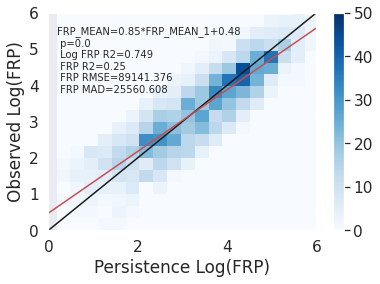

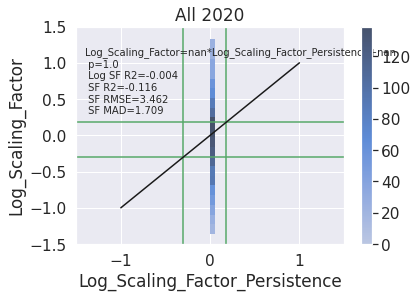

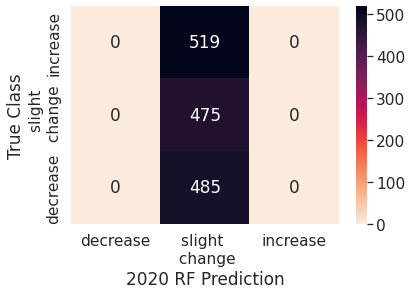

              precision    recall  f1-score   support

    decrease       0.00      0.00      0.00       485
    increase       0.00      0.00      0.00       519
   no_change       0.32      1.00      0.49       475

    accuracy                           0.32      1479
   macro avg       0.11      0.33      0.16      1479
weighted avg       0.10      0.32      0.16      1479



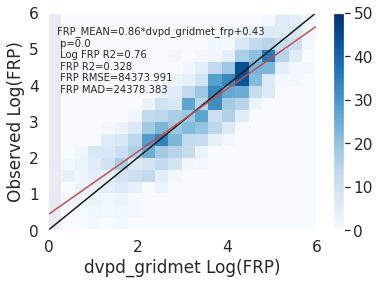

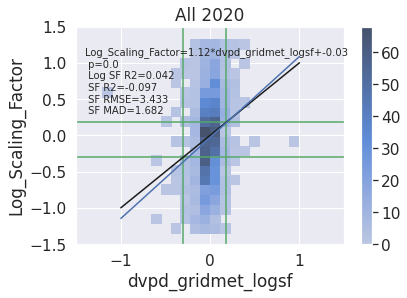

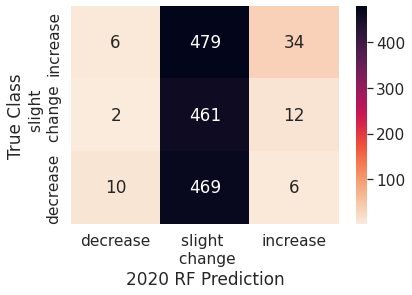

              precision    recall  f1-score   support

    decrease       0.56      0.02      0.04       485
    increase       0.65      0.07      0.12       519
   no_change       0.33      0.97      0.49       475

    accuracy                           0.34      1479
   macro avg       0.51      0.35      0.22      1479
weighted avg       0.52      0.34      0.21      1479



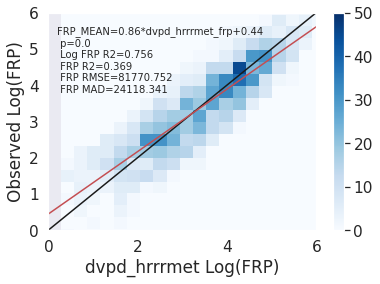

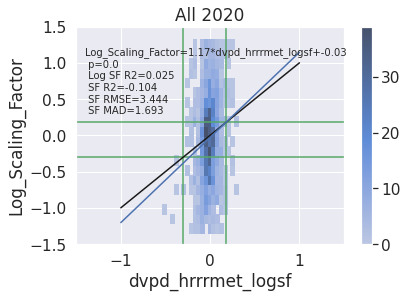

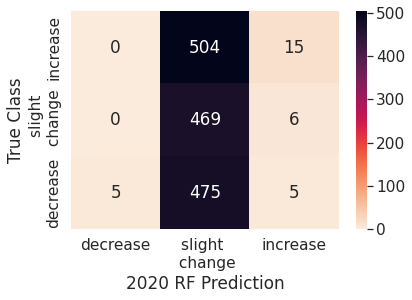

              precision    recall  f1-score   support

    decrease       1.00      0.01      0.02       485
    increase       0.58      0.03      0.06       519
   no_change       0.32      0.99      0.49       475

    accuracy                           0.33      1479
   macro avg       0.63      0.34      0.19      1479
weighted avg       0.63      0.33      0.18      1479



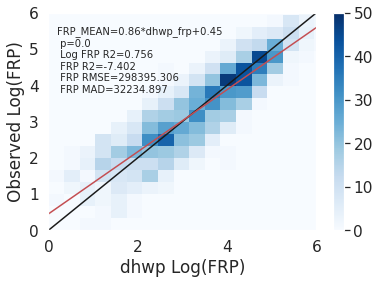

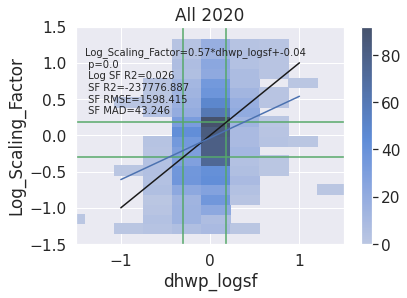

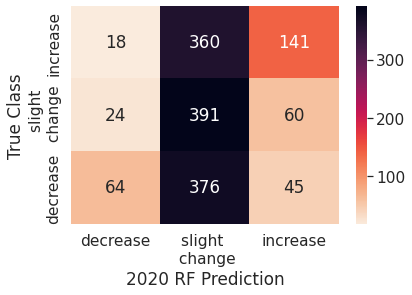

              precision    recall  f1-score   support

    decrease       0.60      0.13      0.22       485
    increase       0.57      0.27      0.37       519
   no_change       0.35      0.82      0.49       475

    accuracy                           0.40      1479
   macro avg       0.51      0.41      0.36      1479
weighted avg       0.51      0.40      0.36      1479



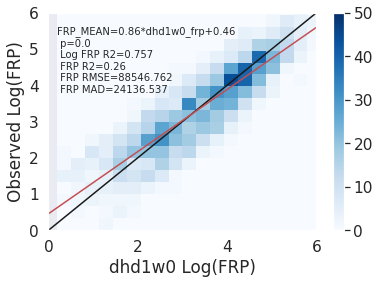

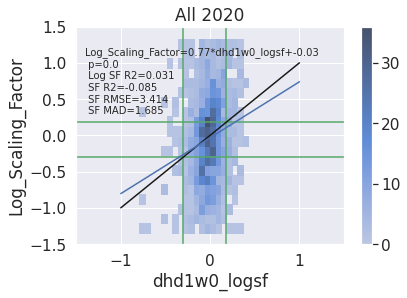

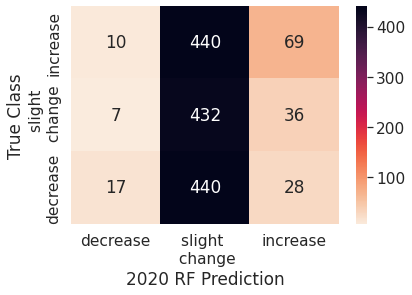

              precision    recall  f1-score   support

    decrease       0.50      0.04      0.07       485
    increase       0.52      0.13      0.21       519
   no_change       0.33      0.91      0.48       475

    accuracy                           0.35      1479
   macro avg       0.45      0.36      0.25      1479
weighted avg       0.45      0.35      0.25      1479



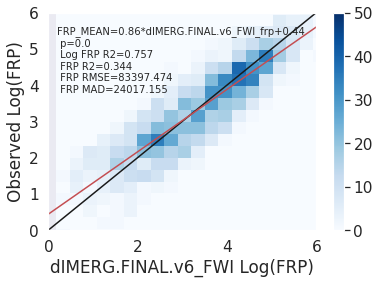

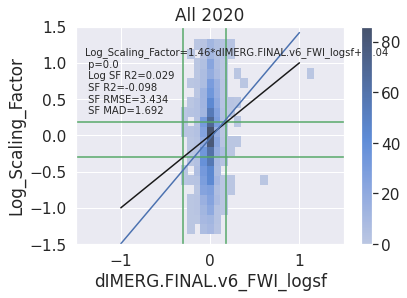

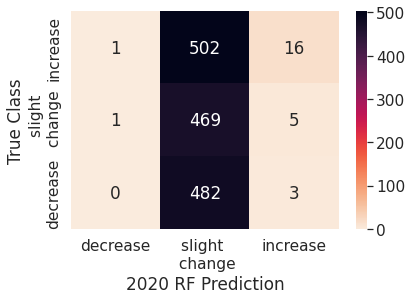

              precision    recall  f1-score   support

    decrease       0.00      0.00      0.00       485
    increase       0.67      0.03      0.06       519
   no_change       0.32      0.99      0.49       475

    accuracy                           0.33      1479
   macro avg       0.33      0.34      0.18      1479
weighted avg       0.34      0.33      0.18      1479



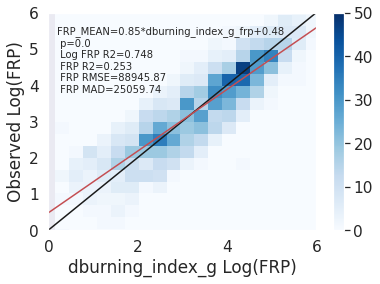

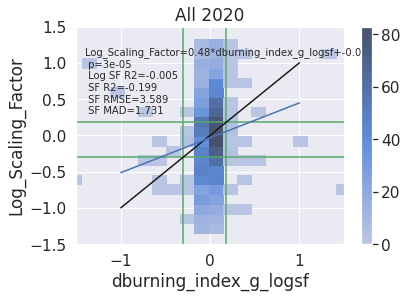

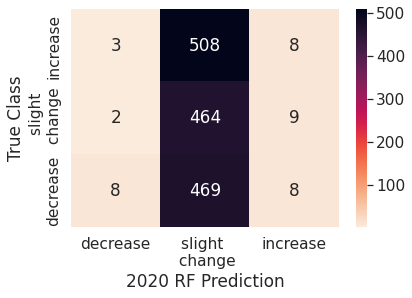

              precision    recall  f1-score   support

    decrease       0.62      0.02      0.03       485
    increase       0.32      0.02      0.03       519
   no_change       0.32      0.98      0.48       475

    accuracy                           0.32      1479
   macro avg       0.42      0.34      0.18      1479
weighted avg       0.42      0.32      0.18      1479



In [23]:
#PERSISTENCE AND SCALED METHODS

scaled_methods = ['dwind_speed_gridmet','dvpd_gridmet','dwind_speed_hrrrmet','dvpd_hrrrmet',
                  'dhwp','dhd0w0','dhd1w0', 'dhd2w0', 'dhd3w0', 'dIMERG.FINAL.v6_FWI','dburning_index_g'] 

scaled_methods_plot =['dvpd_gridmet', 'dvpd_hrrrmet','dhwp','dhd1w0','dIMERG.FINAL.v6_FWI','dburning_index_g']
thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 0.5

data_test_2020['obs_cat'] = pd.cut(data_test_2020['Log_Scaling_Factor'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
data_test_2020['persistence_cat'] = 'no_change'



#do the calculations
for ii in range(len(scaled_methods)):
    print(scaled_methods[ii])
    #make predictions for all of the holdout year (2020)
    data_test_2020[scaled_methods[ii]+'_logsf'] = np.log10(data_test_2020[scaled_methods[ii]])
    data_test_2020[scaled_methods[ii]+'_sf'] = data_test_2020[scaled_methods[ii]]
    data_test_2020[scaled_methods[ii]+'_frp'] = data_test_2020['FRP_MEAN_1']*data_test_2020[scaled_methods[ii]]
    data_test_2020[scaled_methods[ii]+'_logfrp'] = np.log10(data_test_2020[scaled_methods[ii]+'_frp'])
    data_test_2020[scaled_methods[ii]+'_cat'] = pd.cut(data_test_2020[scaled_methods[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
print(data_test_2020.columns.values)    
#do the plottint
#drop the nans, these will show up in the scaled methods
data_test_2020.replace([np.inf, -np.inf], np.nan, inplace=True)
print(len(data_test_2020))
data_test_2020=data_test_2020.dropna(how='any')
print(len(data_test_2020))

#persistence
frp_hist2d(data_test_2020, 'FRP_MEAN_1', 'FRP_MEAN','log_FRP_MEAN_1', 'log_FRP_MEAN', 'Blues', 0, 50,'Persistence Log(FRP)')
plot_2dhist_withfit(data_test_2020, 'Scaling_Factor_Persistence', 'Scaling_Factor',
                    'Log_Scaling_Factor_Persistence', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
plot_category_heatmap(data_test_2020, 'obs_cat', 'persistence_cat', '2020 RF Prediction') 



for ii in range(len(scaled_methods_plot)):

    #all of 2020, trained on all features 19/21
    frp_hist2d(data_test_2020, scaled_methods_plot[ii]+'_frp', 'FRP_MEAN',scaled_methods_plot[ii]+'_logfrp', 'log_FRP_MEAN', 'Blues', 0, 50,scaled_methods_plot[ii]+' Log(FRP)')
    plot_2dhist_withfit(data_test_2020, scaled_methods_plot[ii]+'_sf', 'Scaling_Factor',scaled_methods_plot[ii]+'_logsf', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
    plot_category_heatmap(data_test_2020, 'obs_cat', scaled_methods_plot[ii]+'_cat', '2020 RF Prediction')  


In [24]:
features_by_category = {'raw_weather_gridmet':["vpd_gridmet","wind_speed_gridmet","dvpd_gridmet","dwind_speed_gridmet"], 
                   'raw_weather_hrrr':["vpd_hrrrmet","wind_speed_hrrrmet","dvpd_hrrrmet","dwind_speed_hrrrmet"],
                   'heatwave':["days_in_heatwave"],
                   'derived_weather_hwp': ["hwp","dhwp"],
                   'derived_weather_hdw': ["dhd0w0","dhd1w0", "dhd2w0", "dhd3w0","hd0w0", "hd1w0", "hd2w0", "hd3w0"],
                   'derived_weather_cffrds': [ "dIMERG.FINAL.v6_FWI","dIMERG.FINAL.v6_BUI", "IMERG.FINAL.v6_FWI","IMERG.FINAL.v6_BUI"],
                   'derived_weather_nfdrs':[ "dburning_index_g","denergy_release_component-g","burning_index_g","energy_release_component-g"],
                   'stability': ["PFT", "chi","dchi", "dPFT"],
                   'soil_moisture': ["Blended_SM", "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC"],
                   'fuel_mositure': ["FMCGLH2D", "FMCG2D","dead_fuel_moisture_1000hr","dead_fuel_moisture_100hr"],
                   'pws':["PWS"],
                   'esi':["ESI"],
                   'loading': ["Low_N", "Moderate_N", "High_N", "VeryHigh_N", "Extreme_N"],
                   'terrain_slope': ["MEAN_SLOPE","STD_SLOPE"],
                   'terrain_elevation': ["MEAN_ELEV","STD_ELEV"],
                   'DOY': ['DOY'],
                   'containment': ["percent_contained_1"],
                   'total_personnel': ["personnel_1"],
                   'split_personnel': ["crew_personnel_1","engine_personnel_1","air_personnel_1","construction_personnel_1","overhead_personnel_1"],
                   'split_quantity': ["crew_quantity_1", "engine_quantity_1",  "air_quantity_1", "construction_quantity_1"],
                   'pop': ["POP_DENSITY"],
                   'structures': ["structures_destroyed_1", "structures_damaged_1","structures_threatened_72_1"],
                   'persistence': ["FRP_MEAN_1"]}
category_list = ['raw_weather_gridmet','raw_weather_hrrr','heatwave','derived_weather_hwp','derived_weather_hdw',
                 'derived_weather_cffrds','derived_weather_nfdrs','stability','soil_moisture','fuel_mositure',
                 'pws','esi','loading','terrain_slope','terrain_elevation','DOY','containment','total_personnel',
                 'split_personnel','split_quantity','pop','structures','persistence']                   
            

In [25]:
#this function can pick out categories and add in additional variables (1-2 variables recommended for sanity)

def generate_sensitivity_list(feat_dict, category_selected_list, additional_to_append):
    sub = []
    for item in category_selected_list: #add the categories
        sub = sub+feat_dict[item]

    for item2 in additional_to_append: #add the other variables, for instance if we want all categories and then HWP
        sub = sub+[item2]
    
    return sub


In [26]:
feature_subsets = {}

#all features
not_allowed = []
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

#no persistence
not_allowed = ['persistence']
feature_subsets['features_no_persistence'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])


#no weather
not_allowed = ['raw_weather_gridmet','raw_weather_hrrr','heatwave','derived_weather_hwp','derived_weather_hdw',
                 'derived_weather_cffrds','derived_weather_nfdrs']
feature_subsets['features_no_surface_weather'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_raw_gridmet'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["vpd_gridmet","wind_speed_gridmet","dvpd_gridmet","dwind_speed_gridmet"])
feature_subsets['features_only_raw_hrrrmet'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["vpd_hrrrmet","wind_speed_hrrrmet","dvpd_hrrrmet","dwind_speed_hrrrmet"])
feature_subsets['features_only_hd0w0'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hd0w0","dhd0w0"])
feature_subsets['features_only_hd1w0'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hd1w0","dhd1w0"])
feature_subsets['features_only_hd2w0'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hd2w0","dhd2w0"])
feature_subsets['features_only_hd3w0'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hd3w0","dhd3w0"])
feature_subsets['features_only_hwp'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["hwp","dhwp"])
feature_subsets['features_only_cffdrs'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["dIMERG.FINAL.v6_FWI","dIMERG.FINAL.v6_BUI", "IMERG.FINAL.v6_FWI","IMERG.FINAL.v6_BUI"])
feature_subsets['features_only_nfdrs'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [ "dburning_index_g","denergy_release_component-g","burning_index_g","energy_release_component-g"])
feature_subsets['features_only_heatwave'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["days_in_heatwave"])

#no stability
not_allowed = ['stability']
feature_subsets['features_no_stability'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_pft'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['PFT','dPFT'])
feature_subsets['features_only_chi'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['chi','dchi'])


#no soil_moisture
not_allowed = ['soil_moisture'] #["Blended_SM", "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC"]
feature_subsets['features_no_soil_moisture'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_smops'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["Blended_SM"])
feature_subsets['features_only_sm_cffdrs'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [ "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC"])

#no fuel_moisture
not_allowed = ['fuel_moisture'] #["FMCGLH2D", "FMCG2D","dead_fuel_moisture_1000hr","dead_fuel_moisture_100hr"]
feature_subsets['features_no_fuel_moisture'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_fm_ncar'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["FMCGLH2D", "FMCG2D"])
feature_subsets['features_only_fm_nfdrs'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["dead_fuel_moisture_1000hr","dead_fuel_moisture_100hr"])


#no pws
not_allowed = ['pws']
feature_subsets['features_no_pws'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

#no esi
not_allowed = ['esi']
feature_subsets['features_no_esi'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

#no esi
not_allowed = ['loading']
feature_subsets['features_no_loading'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_LowN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['Low_N'])
feature_subsets['features_only_ModerateN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['Moderate_N'])
feature_subsets['features_only_HighN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['High_N'])
feature_subsets['features_only_VeryHighN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['VeryHigh_N'])
feature_subsets['features_only_ExtremeN'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['Extreme_N'])

#no terrain
not_allowed = ['terrain_slope', 'terrain_elevation']
feature_subsets['features_no_terrain'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_only_slope'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["MEAN_SLOPE","STD_SLOPE"])
feature_subsets['features_only_elevation'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["MEAN_ELEV","STD_ELEV"])

#no DOY
not_allowed = ['DOY']
feature_subsets['features_no_doy'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# no human
not_allowed = ['containment','total_personnel',
                 'split_personnel','split_quantity','pop','structures']
feature_subsets['features_no_human'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])
feature_subsets['features_only_crew'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["crew_personnel_1", "crew_quantity_1"])
feature_subsets['features_only_engine'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["engine_personnel_1", "engine_quantity_1"])
feature_subsets['features_only_air'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["air_personnel_1", "air_quantity_1"])
feature_subsets['features_only_construction'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["construction_personnel_1", "construction_quantity_1"])
feature_subsets['features_only_overhead'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ["overhead_personnel_1"])




#print(feature_subsets)

#print(category_list)
#print(category_list.remove('raw_weather_gridmet'))

In [27]:
# Containment
not_allowed = ['total_personnel',
                 'split_personnel','split_quantity','pop','structures']
feature_subsets['features_only_containment'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# total personnel
not_allowed = ['containment',
                 'split_personnel','split_quantity','pop','structures']
feature_subsets['features_only_total_personnel'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# split personnel
not_allowed = ['containment','total_personnel',
                 'split_quantity','pop','structures']
feature_subsets['features_only_split_personnel'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# split quantity
not_allowed = ['containment','total_personnel',
                 'split_personnel','pop','structures']
feature_subsets['features_only_split_quantity']= generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# population
not_allowed = ['containment','total_personnel',
                 'split_personnel','split_quantity','structures']
feature_subsets['features_only_population'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# structures
not_allowed = ['containment','total_personnel',
                 'split_personnel','split_quantity','pop']
feature_subsets['features_only_structures'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

# 72 hours out
not_allowed = ['containment','total_personnel',
                 'split_personnel','split_quantity','pop','structures']
feature_subsets['features_only_72hr_structures'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], ['structures_threatened_72'])



In [49]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all', 'features_no_persistence', 'features_no_surface_weather',
                    'features_no_stability', 'features_no_soil_moisture', 'features_no_fuel_moisture',
                    'features_no_pws', 'features_no_esi','features_no_loading', 'features_no_terrain', 'features_no_doy',
                    'features_no_human',
                    'features_only_pft', 'features_only_chi',
                    'features_only_raw_gridmet', 'features_only_raw_hrrrmet', 
                    'features_only_hd0w0','features_only_hd1w0',
                    'features_only_hd2w0','features_only_hd3w0', 'features_only_hwp',
                    'features_only_cffdrs', 'features_only_nfdrs', 'features_only_heatwave',
                    'features_only_smops','features_only_sm_cffdrs',
                     'features_only_fm_ncar', 'features_only_fm_nfdrs',
                     'features_only_LowN','features_only_ModerateN','features_only_HighN',
                     'features_only_VeryHighN', 'features_only_ExtremeN',
                     'features_only_slope', 'features_only_elevation',
                     'features_only_containment','features_only_total_personnel',
                     'features_only_split_personnel','features_only_split_quantity',
                     'features_only_population','features_only_structures',
                     'features_only_72hr_structures',
                     'features_only_crew', 'features_only_engine','features_only_air', 
                     'features_only_construction','features_only_overhead'
    ]



df_error_metrics = pd.DataFrame(index=feature_set_names, 
                                columns=['LOG_FRP_R2', 'FRP_R2', 'FRP_RMSE', 'FRP_MAD',
                                         'LOG_SF_R2', 'SF_R2', 'SF_RMSE', 'SF_MAD',
                                        'decrease_precision', 'decrease_recall', 'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])

#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_frp'] = data_test_2020['FRP_MEAN_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfrp'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_frp'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors = summarize_error(data_test_2020,'FRP_MEAN', 'log_FRP_MEAN', 'FRP_MEAN_1', 'log_FRP_MEAN_1')
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'Log_Scaling_Factor', 'persistence', 'log_persistence')
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors = summarize_error(data_test_2020,'FRP_MEAN', 'log_FRP_MEAN', 'rf_'+feature_set_names[ii]+'_frp', 'rf_'+feature_set_names[ii]+'_logfrp')
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf', 'rf_'+feature_set_names[ii]+'_logsf')
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics.loc[feature_set_names[ii], 'LOG_FRP_R2'] = errors[0]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_R2'] = errors[1]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_RMSE'] = errors[2]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_MAD'] = errors[3]
    
    df_error_metrics.loc[feature_set_names[ii], 'LOG_SF_R2'] = errors_sf[0]
    df_error_metrics.loc[feature_set_names[ii], 'SF_R2'] = errors_sf[1]
    df_error_metrics.loc[feature_set_names[ii], 'SF_RMSE'] = errors_sf[2]
    df_error_metrics.loc[feature_set_names[ii], 'SF_MAD'] = errors_sf[3]
    
    df_error_metrics.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']

#persistence

df_error_metrics['percent_change_FRP_RMSE'] = (df_error_metrics.loc['persistence','FRP_RMSE']-df_error_metrics['FRP_RMSE'])/df_error_metrics.loc['persistence','FRP_RMSE']
df_error_metrics['percent_change_FRP_MAD'] = (df_error_metrics.loc['persistence','FRP_MAD']-df_error_metrics['FRP_MAD'])/df_error_metrics.loc['persistence','FRP_MAD']


df_error_metrics['percent_change_SF_RMSE'] = (df_error_metrics.loc['persistence','SF_RMSE']-df_error_metrics['SF_RMSE'])/df_error_metrics.loc['persistence','SF_RMSE']
df_error_metrics['percent_change_SF_MAD'] = (df_error_metrics.loc['persistence','SF_MAD']-df_error_metrics['SF_MAD'])/df_error_metrics.loc['persistence','SF_MAD']

    

features_new_all OOB R2 score is: 0.2324856729233259
features_no_persistence OOB R2 score is: 0.17870349125570606
features_no_surface_weather OOB R2 score is: 0.14352143705988407
features_no_stability OOB R2 score is: 0.21327514212570486
features_no_soil_moisture OOB R2 score is: 0.22826013262326783
features_no_fuel_moisture OOB R2 score is: 0.2324856729233259
features_no_pws OOB R2 score is: 0.23573916909745618
features_no_esi OOB R2 score is: 0.22849766187478993
features_no_loading OOB R2 score is: 0.232163080844912
features_no_terrain OOB R2 score is: 0.23306139055837383
features_no_doy OOB R2 score is: 0.22981715841821748
features_no_human OOB R2 score is: 0.21436934198468527
features_only_pft OOB R2 score is: 0.21215651776997024
features_only_chi OOB R2 score is: 0.2301967459523775
features_only_raw_gridmet OOB R2 score is: 0.17237089963056706
features_only_raw_hrrrmet OOB R2 score is: 0.15048087513880215
features_only_hd0w0 OOB R2 score is: 0.18586365907647528
features_only_hd1w0

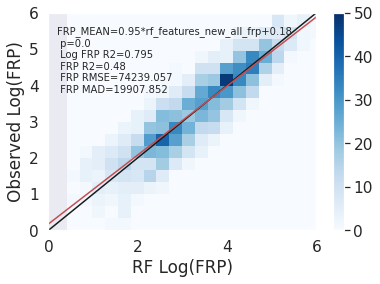

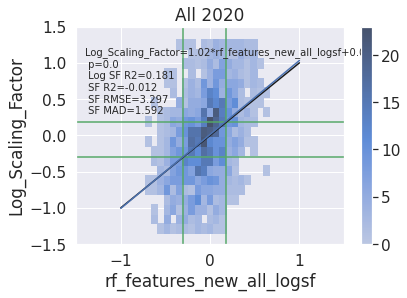

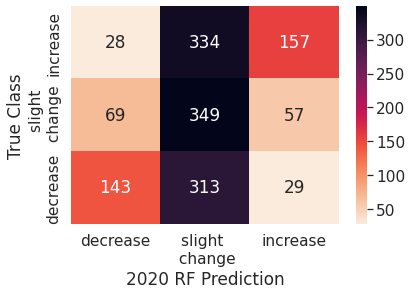

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.65      0.30      0.41       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.43      1479
weighted avg       0.53      0.44      0.43      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4388100067613252


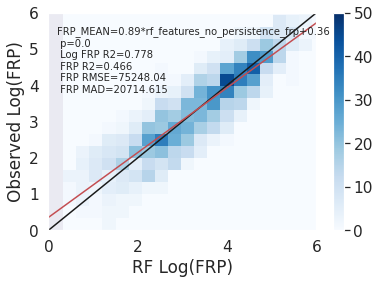

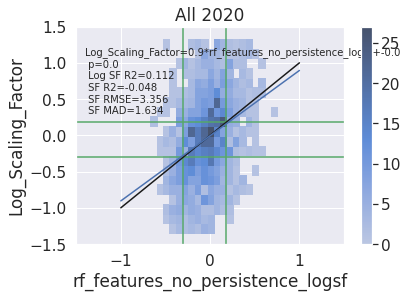

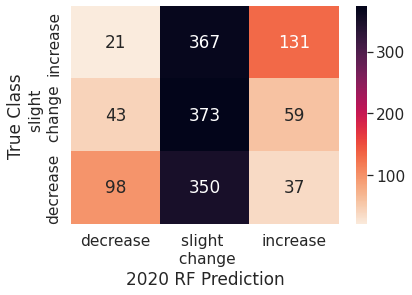

              precision    recall  f1-score   support

    decrease       0.60      0.20      0.30       485
    increase       0.58      0.25      0.35       519
   no_change       0.34      0.79      0.48       475

    accuracy                           0.41      1479
   macro avg       0.51      0.41      0.38      1479
weighted avg       0.51      0.41      0.38      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4340770791075051


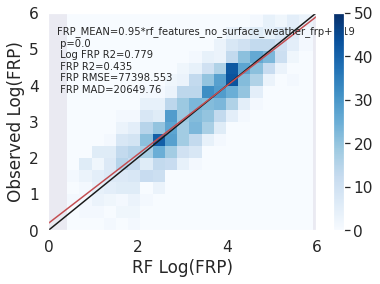

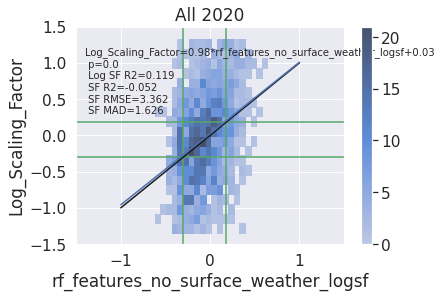

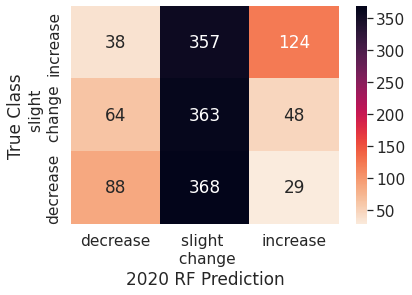

              precision    recall  f1-score   support

    decrease       0.46      0.18      0.26       485
    increase       0.62      0.24      0.34       519
   no_change       0.33      0.76      0.46       475

    accuracy                           0.39      1479
   macro avg       0.47      0.39      0.36      1479
weighted avg       0.48      0.39      0.36      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4259634888438134


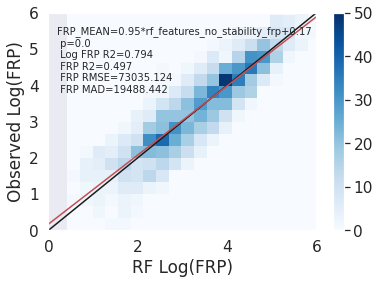

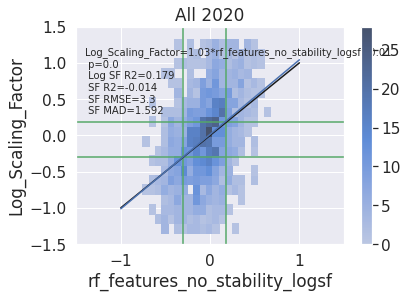

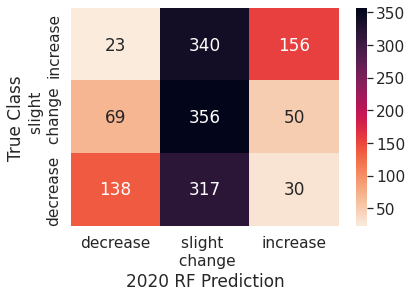

              precision    recall  f1-score   support

    decrease       0.60      0.28      0.39       485
    increase       0.66      0.30      0.41       519
   no_change       0.35      0.75      0.48       475

    accuracy                           0.44      1479
   macro avg       0.54      0.44      0.43      1479
weighted avg       0.54      0.44      0.43      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44286680189317107


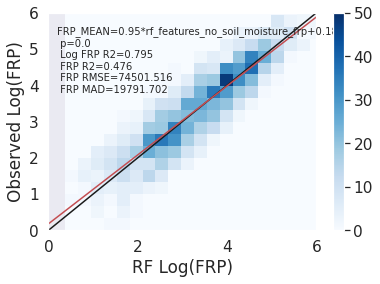

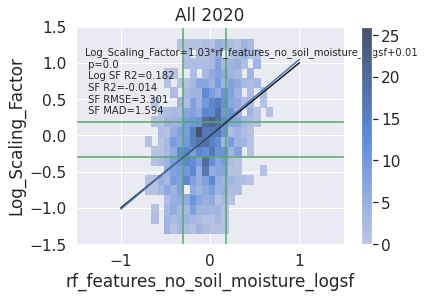

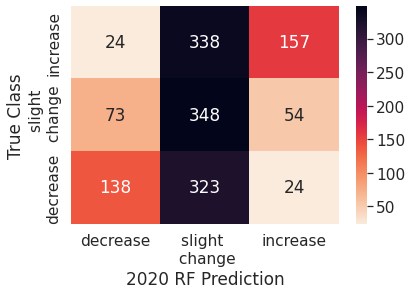

              precision    recall  f1-score   support

    decrease       0.59      0.28      0.38       485
    increase       0.67      0.30      0.42       519
   no_change       0.34      0.73      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.54      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4374577417173766


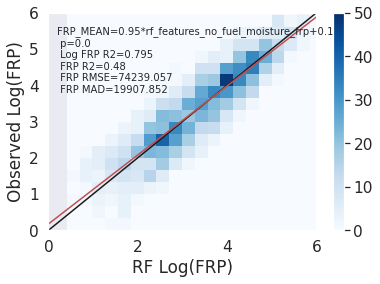

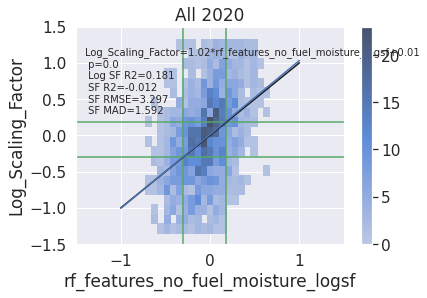

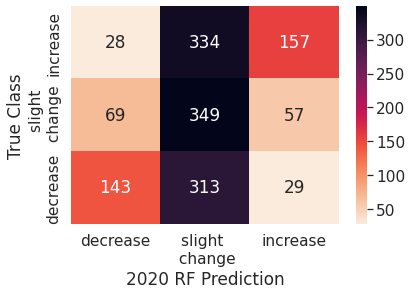

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.65      0.30      0.41       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.43      1479
weighted avg       0.53      0.44      0.43      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4388100067613252


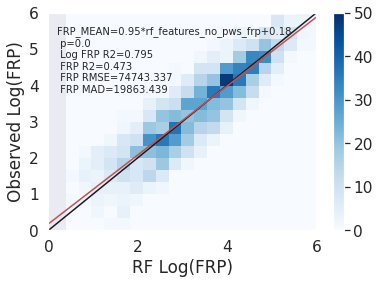

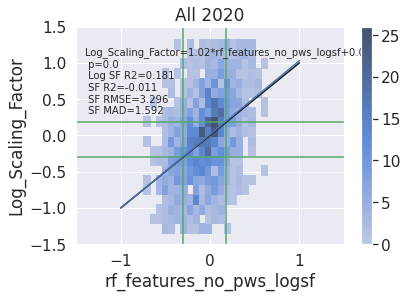

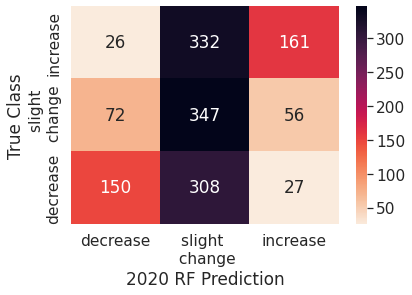

              precision    recall  f1-score   support

    decrease       0.60      0.31      0.41       485
    increase       0.66      0.31      0.42       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.44      1479
   macro avg       0.54      0.45      0.44      1479
weighted avg       0.54      0.44      0.43      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44083840432724813


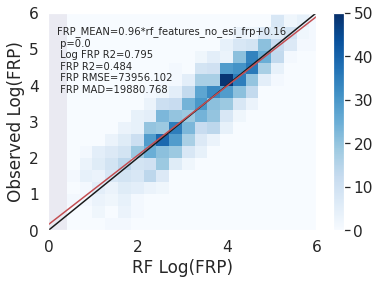

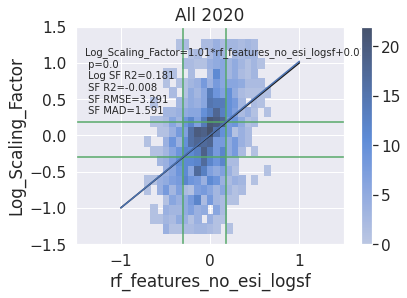

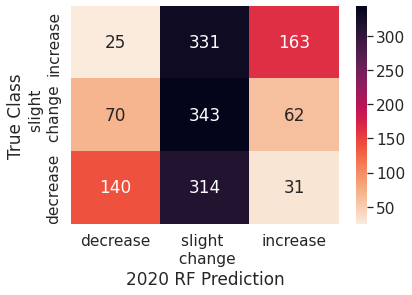

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.64      0.31      0.42       519
   no_change       0.35      0.72      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.43      1479
weighted avg       0.53      0.44      0.43      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44083840432724813


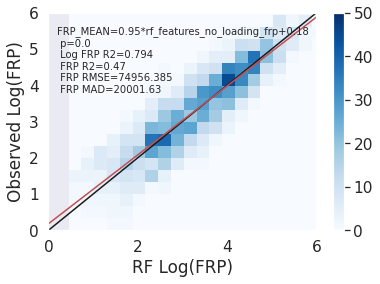

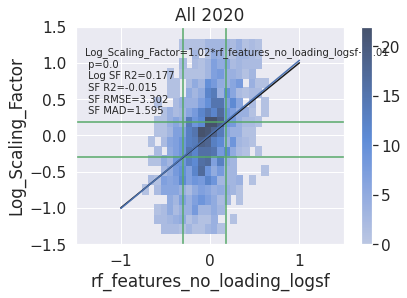

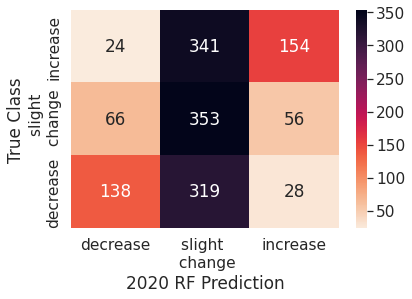

              precision    recall  f1-score   support

    decrease       0.61      0.28      0.39       485
    increase       0.65      0.30      0.41       519
   no_change       0.35      0.74      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.54      0.44      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4462474645030426


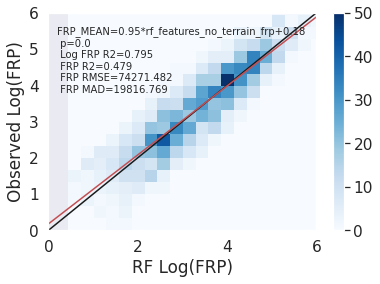

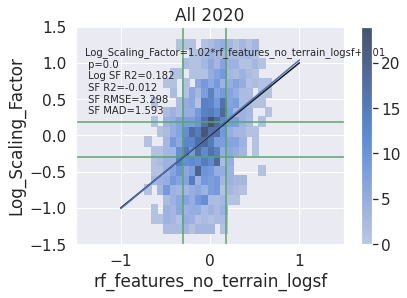

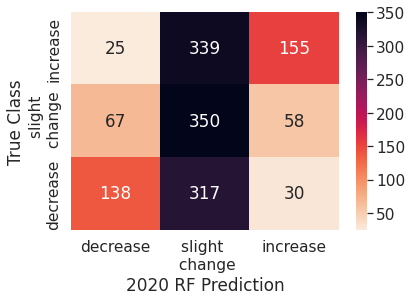

              precision    recall  f1-score   support

    decrease       0.60      0.28      0.39       485
    increase       0.64      0.30      0.41       519
   no_change       0.35      0.74      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4462474645030426


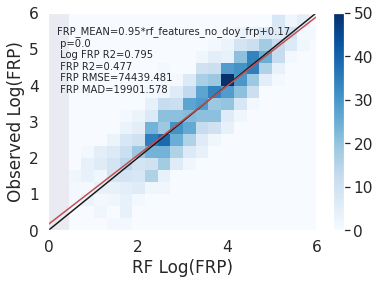

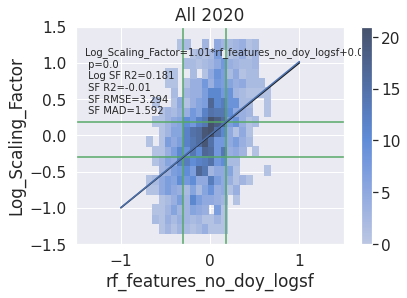

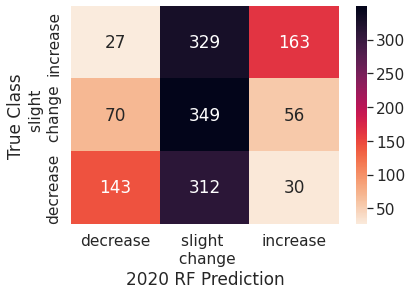

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.65      0.31      0.42       519
   no_change       0.35      0.73      0.48       475

    accuracy                           0.44      1479
   macro avg       0.53      0.45      0.43      1479
weighted avg       0.54      0.44      0.43      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.43948613928329955


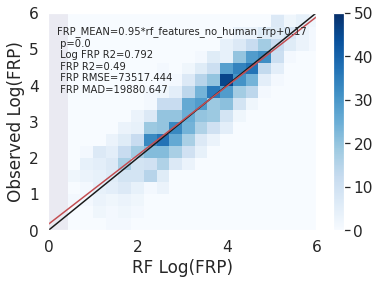

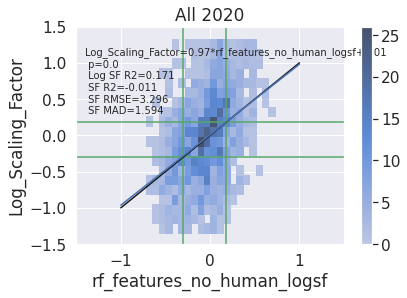

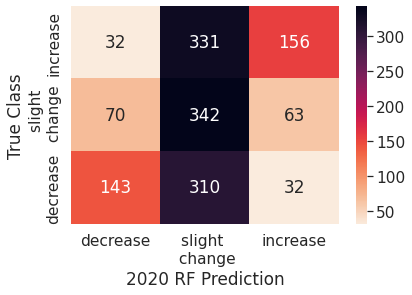

              precision    recall  f1-score   support

    decrease       0.58      0.29      0.39       485
    increase       0.62      0.30      0.41       519
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1479
   macro avg       0.52      0.44      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4455713319810683


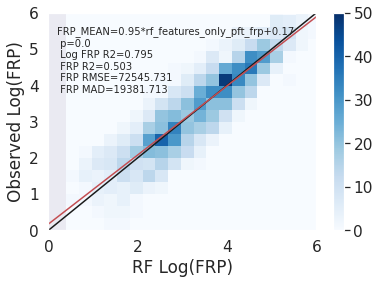

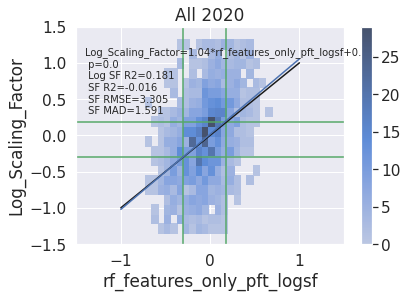

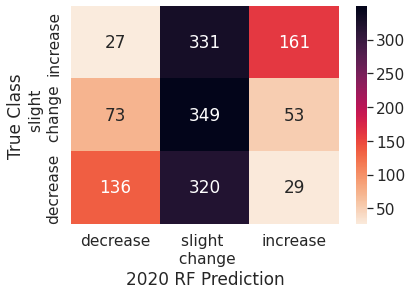

              precision    recall  f1-score   support

    decrease       0.58      0.28      0.38       485
    increase       0.66      0.31      0.42       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.44      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44759972954699123


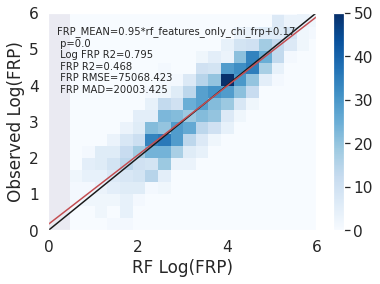

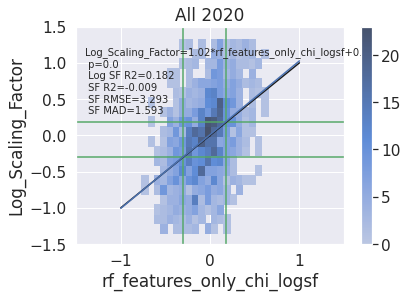

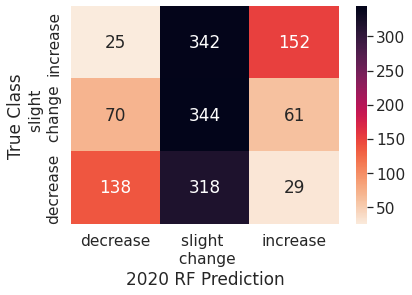

              precision    recall  f1-score   support

    decrease       0.59      0.28      0.38       485
    increase       0.63      0.29      0.40       519
   no_change       0.34      0.72      0.47       475

    accuracy                           0.43      1479
   macro avg       0.52      0.43      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4415145368492224


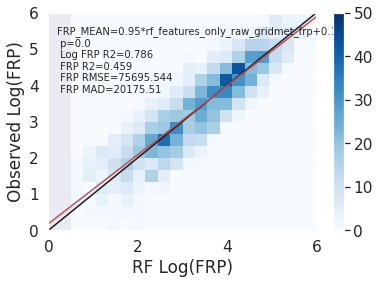

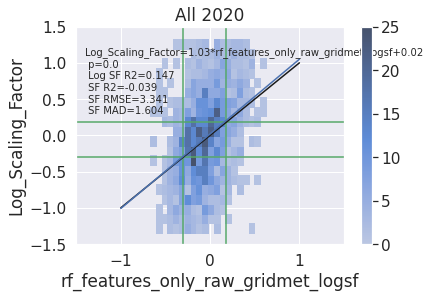

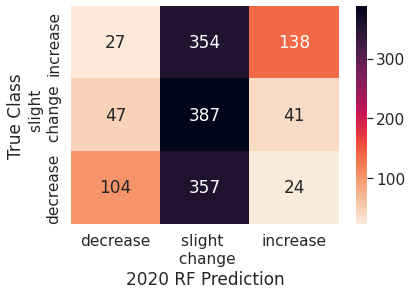

              precision    recall  f1-score   support

    decrease       0.58      0.21      0.31       485
    increase       0.68      0.27      0.38       519
   no_change       0.35      0.81      0.49       475

    accuracy                           0.43      1479
   macro avg       0.54      0.43      0.40      1479
weighted avg       0.54      0.43      0.40      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4557133198106829


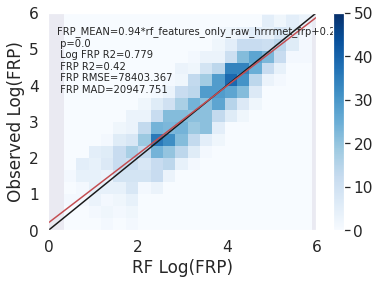

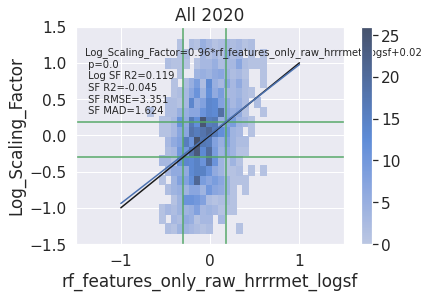

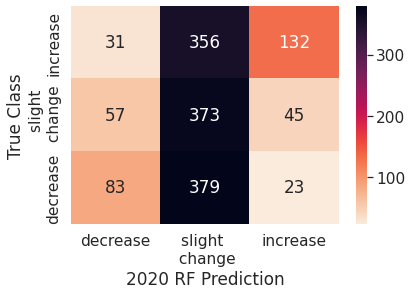

              precision    recall  f1-score   support

    decrease       0.49      0.17      0.25       485
    increase       0.66      0.25      0.37       519
   no_change       0.34      0.79      0.47       475

    accuracy                           0.40      1479
   macro avg       0.49      0.40      0.36      1479
weighted avg       0.50      0.40      0.36      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4279918864097363


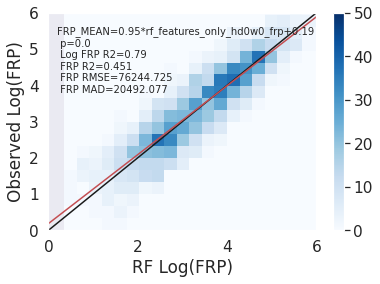

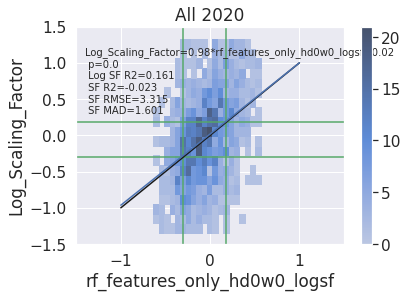

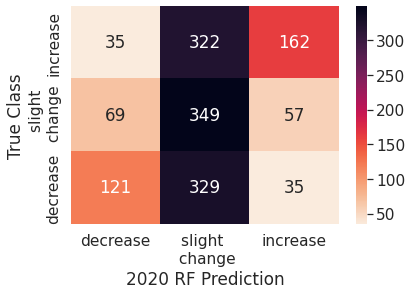

              precision    recall  f1-score   support

    decrease       0.54      0.25      0.34       485
    increase       0.64      0.31      0.42       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1479
   macro avg       0.51      0.43      0.41      1479
weighted avg       0.51      0.43      0.41      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44354293441514536


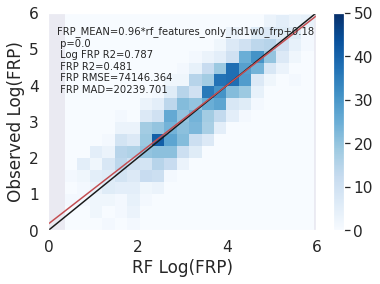

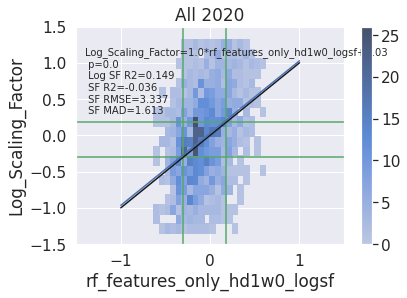

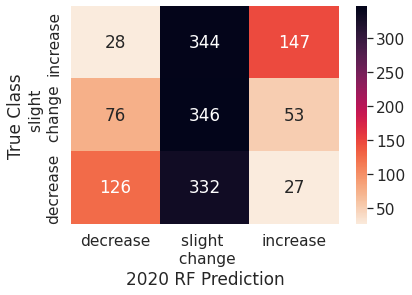

              precision    recall  f1-score   support

    decrease       0.55      0.26      0.35       485
    increase       0.65      0.28      0.39       519
   no_change       0.34      0.73      0.46       475

    accuracy                           0.42      1479
   macro avg       0.51      0.42      0.40      1479
weighted avg       0.52      0.42      0.40      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4239350912778905


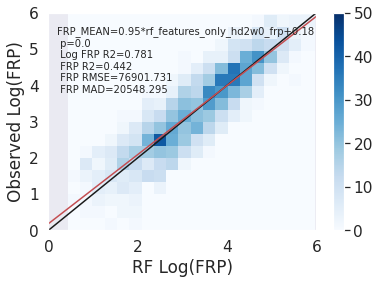

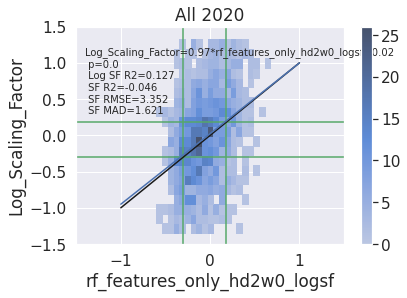

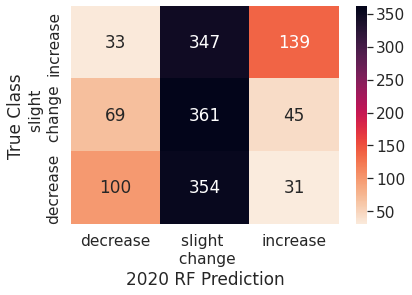

              precision    recall  f1-score   support

    decrease       0.50      0.21      0.29       485
    increase       0.65      0.27      0.38       519
   no_change       0.34      0.76      0.47       475

    accuracy                           0.41      1479
   macro avg       0.49      0.41      0.38      1479
weighted avg       0.50      0.41      0.38      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4306964164976335


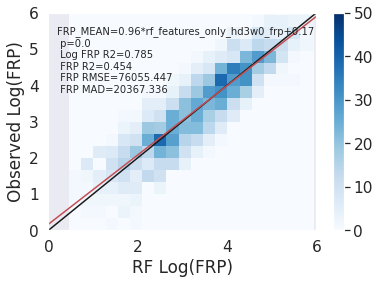

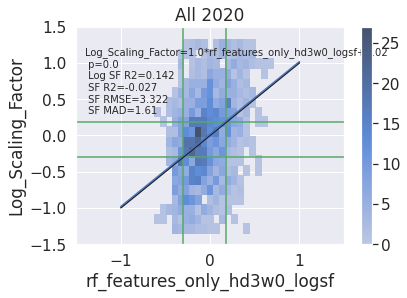

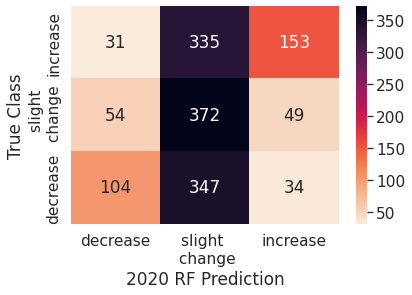

              precision    recall  f1-score   support

    decrease       0.55      0.21      0.31       485
    increase       0.65      0.29      0.41       519
   no_change       0.35      0.78      0.49       475

    accuracy                           0.43      1479
   macro avg       0.52      0.43      0.40      1479
weighted avg       0.52      0.43      0.40      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.42866801893171064


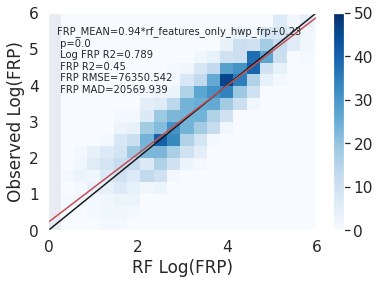

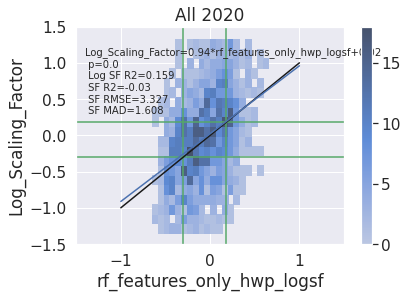

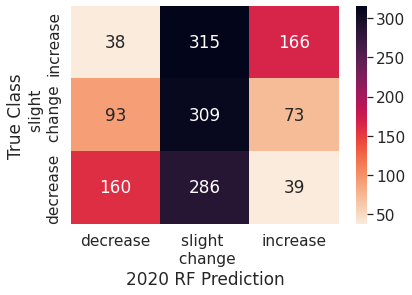

              precision    recall  f1-score   support

    decrease       0.55      0.33      0.41       485
    increase       0.60      0.32      0.42       519
   no_change       0.34      0.65      0.45       475

    accuracy                           0.43      1479
   macro avg       0.50      0.43      0.43      1479
weighted avg       0.50      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.43610547667342797


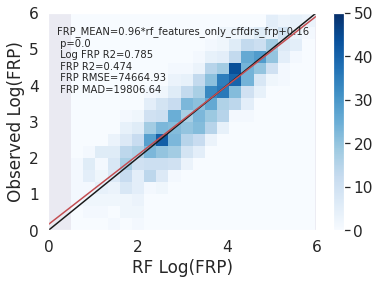

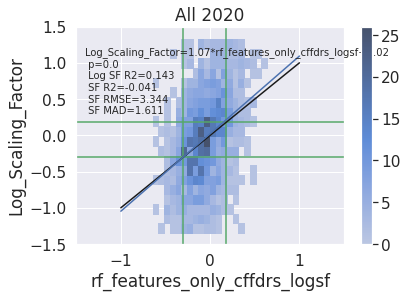

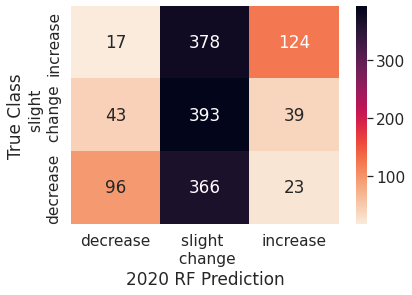

              precision    recall  f1-score   support

    decrease       0.62      0.20      0.30       485
    increase       0.67      0.24      0.35       519
   no_change       0.35      0.83      0.49       475

    accuracy                           0.41      1479
   macro avg       0.54      0.42      0.38      1479
weighted avg       0.55      0.41      0.38      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44286680189317107


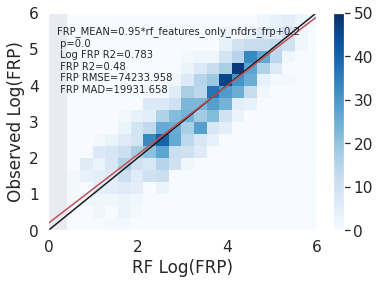

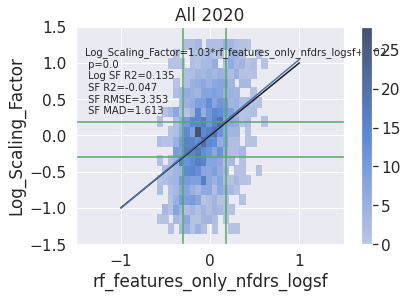

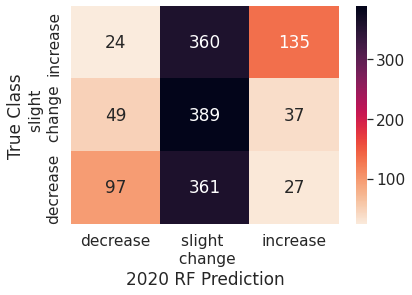

              precision    recall  f1-score   support

    decrease       0.57      0.20      0.30       485
    increase       0.68      0.26      0.38       519
   no_change       0.35      0.82      0.49       475

    accuracy                           0.42      1479
   macro avg       0.53      0.43      0.39      1479
weighted avg       0.54      0.42      0.39      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44759972954699123


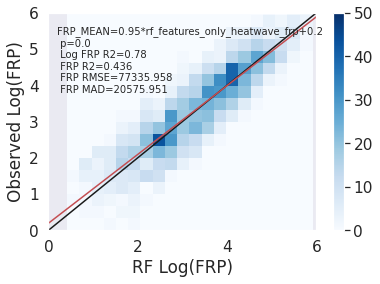

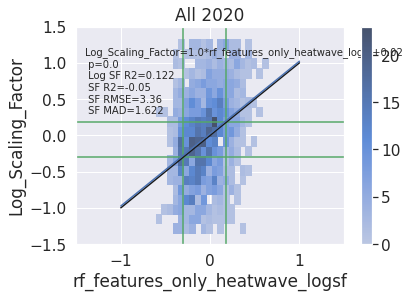

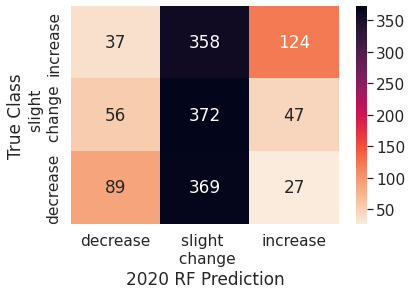

              precision    recall  f1-score   support

    decrease       0.49      0.18      0.27       485
    increase       0.63      0.24      0.35       519
   no_change       0.34      0.78      0.47       475

    accuracy                           0.40      1479
   macro avg       0.48      0.40      0.36      1479
weighted avg       0.49      0.40      0.36      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4340770791075051


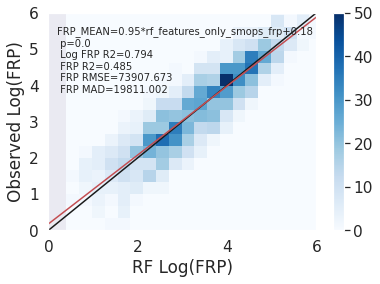

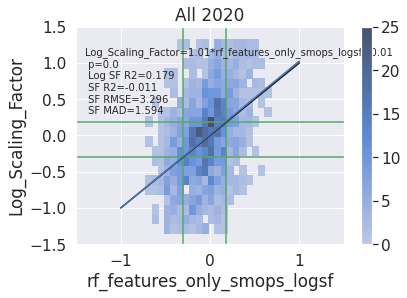

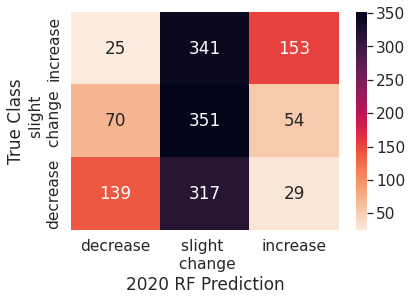

              precision    recall  f1-score   support

    decrease       0.59      0.29      0.39       485
    increase       0.65      0.29      0.41       519
   no_change       0.35      0.74      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4374577417173766


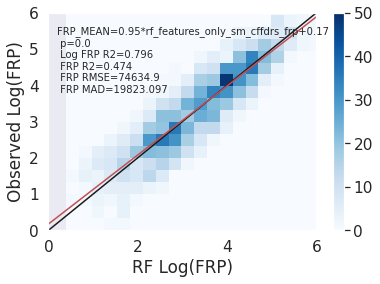

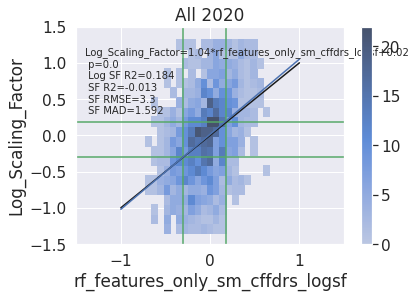

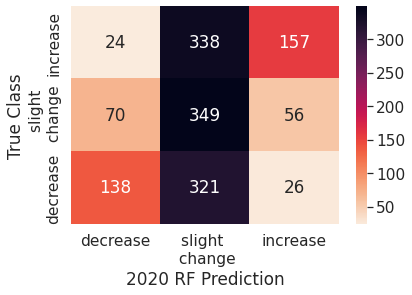

              precision    recall  f1-score   support

    decrease       0.59      0.28      0.38       485
    increase       0.66      0.30      0.41       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.54      0.44      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44083840432724813


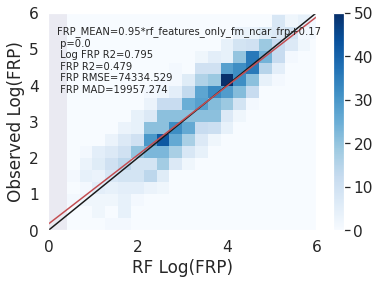

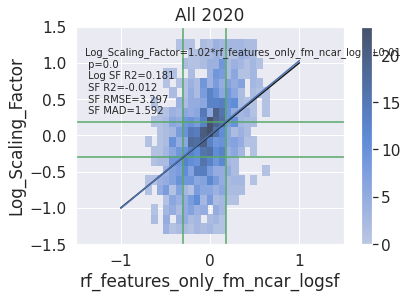

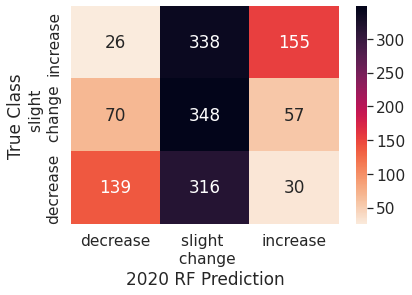

              precision    recall  f1-score   support

    decrease       0.59      0.29      0.39       485
    increase       0.64      0.30      0.41       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44083840432724813


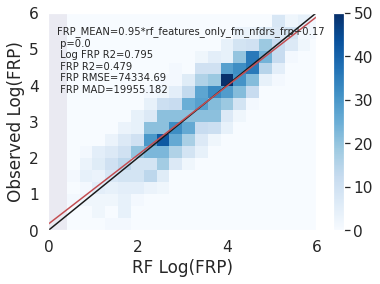

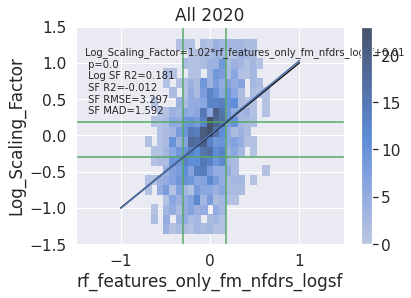

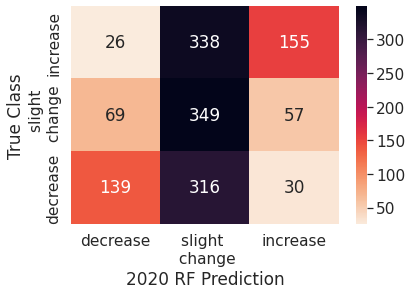

              precision    recall  f1-score   support

    decrease       0.59      0.29      0.39       485
    increase       0.64      0.30      0.41       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4415145368492224


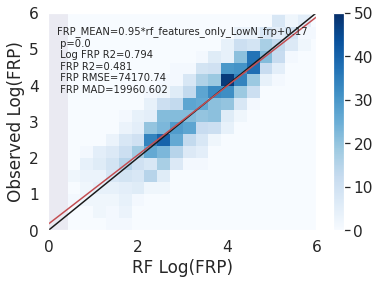

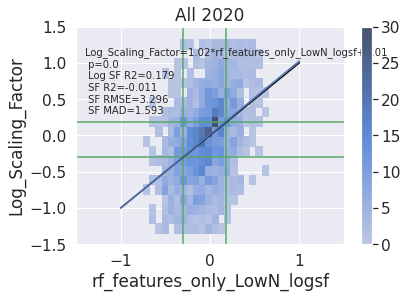

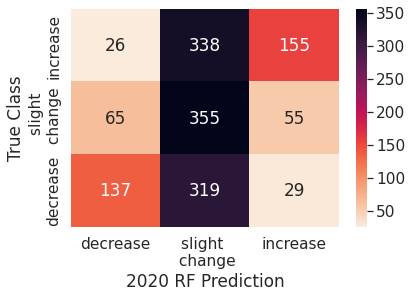

              precision    recall  f1-score   support

    decrease       0.60      0.28      0.38       485
    increase       0.65      0.30      0.41       519
   no_change       0.35      0.75      0.48       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.54      0.44      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44354293441514536


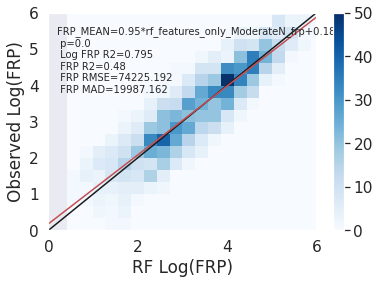

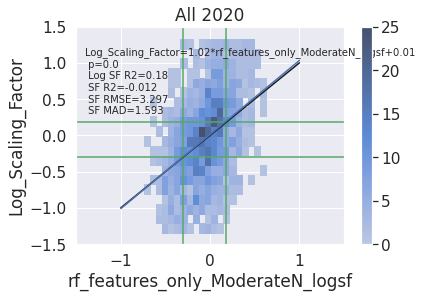

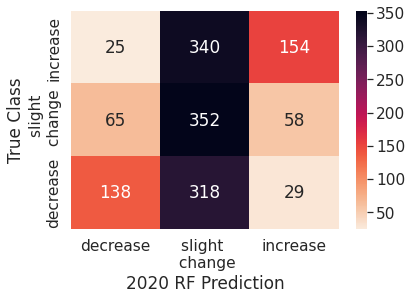

              precision    recall  f1-score   support

    decrease       0.61      0.28      0.39       485
    increase       0.64      0.30      0.41       519
   no_change       0.35      0.74      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.44      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44286680189317107


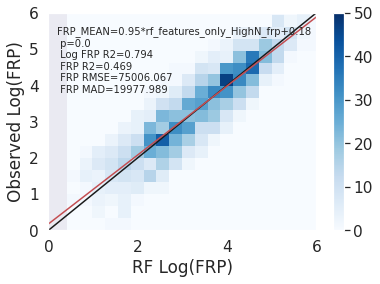

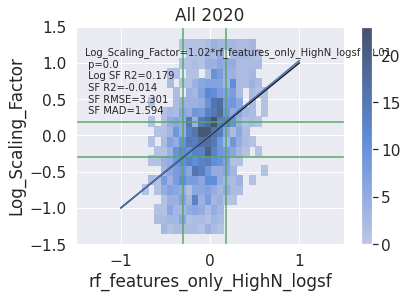

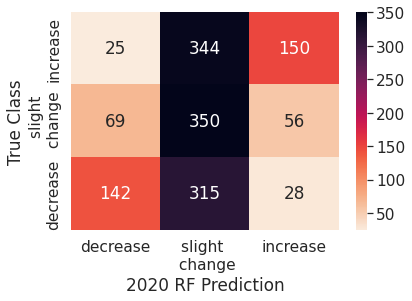

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.64      0.29      0.40       519
   no_change       0.35      0.74      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44286680189317107


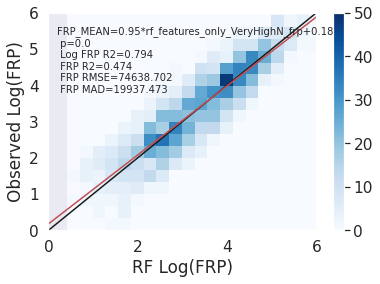

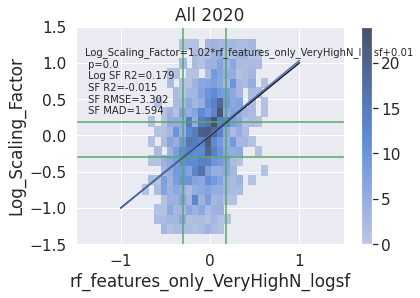

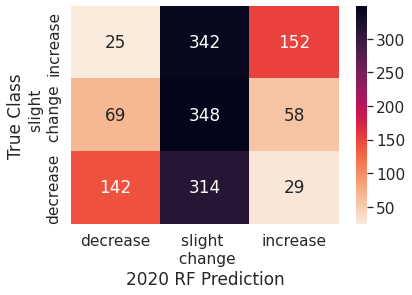

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.64      0.29      0.40       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4354293441514537


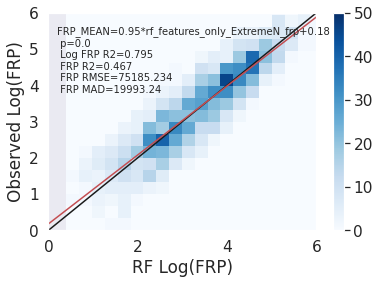

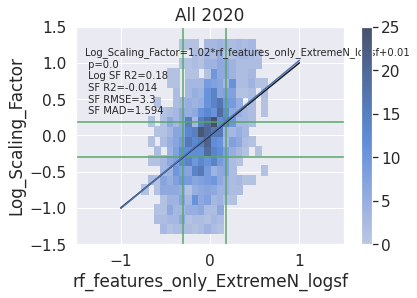

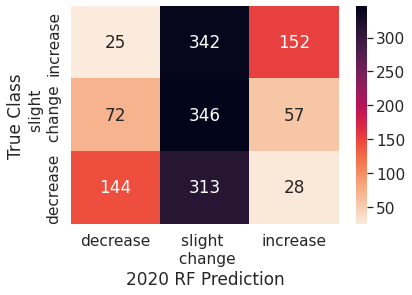

              precision    recall  f1-score   support

    decrease       0.60      0.30      0.40       485
    increase       0.64      0.29      0.40       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4388100067613252


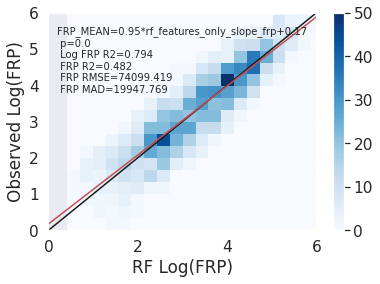

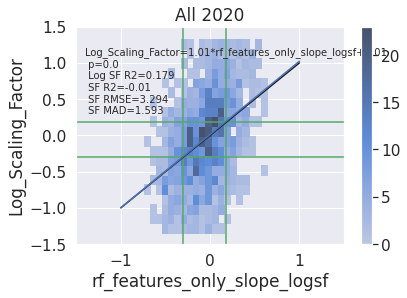

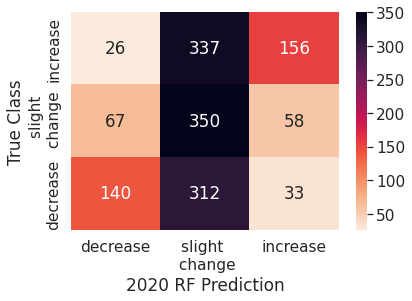

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.63      0.30      0.41       519
   no_change       0.35      0.74      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.44      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.444895199459094


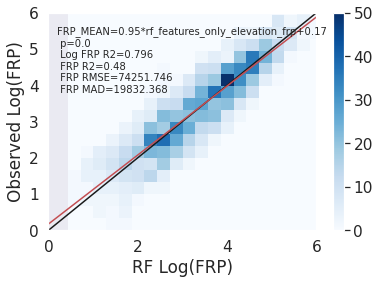

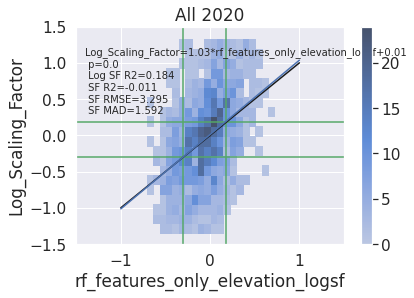

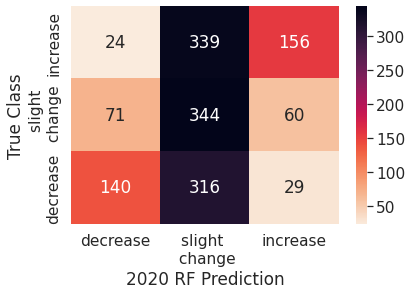

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.64      0.30      0.41       519
   no_change       0.34      0.72      0.47       475

    accuracy                           0.43      1479
   macro avg       0.53      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4462474645030426


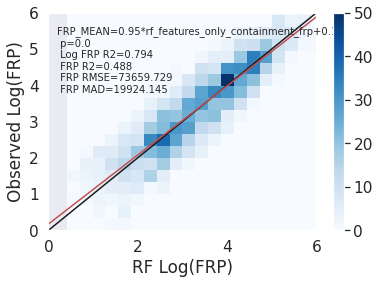

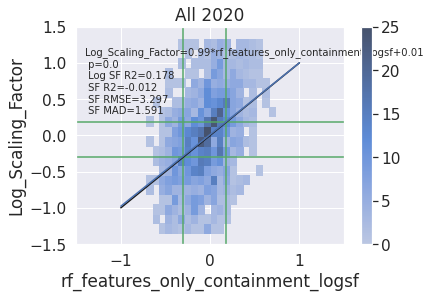

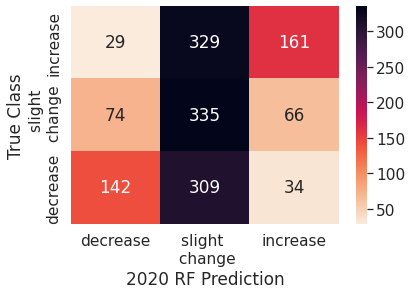

              precision    recall  f1-score   support

    decrease       0.58      0.29      0.39       485
    increase       0.62      0.31      0.41       519
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1479
   macro avg       0.51      0.44      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44759972954699123


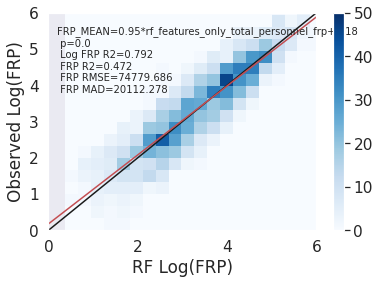

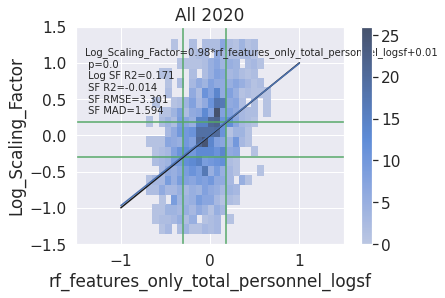

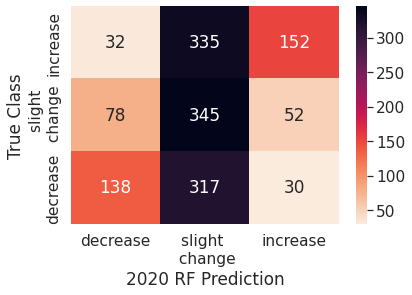

              precision    recall  f1-score   support

    decrease       0.56      0.28      0.38       485
    increase       0.65      0.29      0.40       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1479
   macro avg       0.52      0.43      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4388100067613252


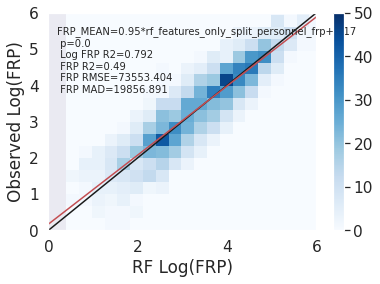

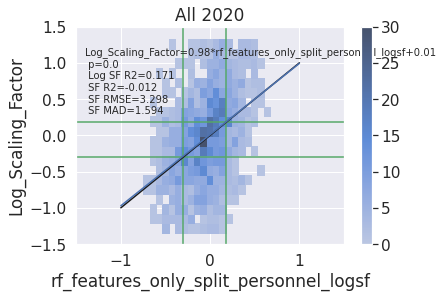

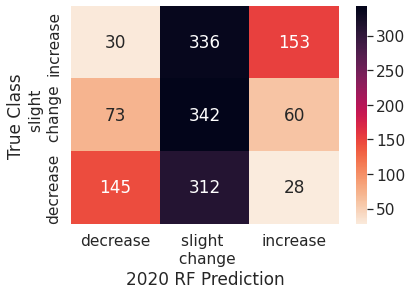

              precision    recall  f1-score   support

    decrease       0.58      0.30      0.40       485
    increase       0.63      0.29      0.40       519
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1479
   macro avg       0.52      0.44      0.42      1479
weighted avg       0.53      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44083840432724813


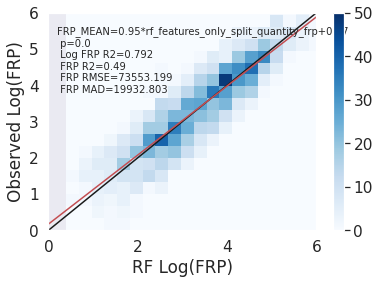

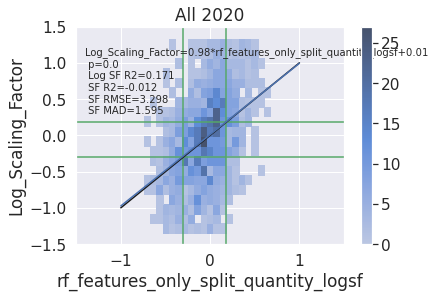

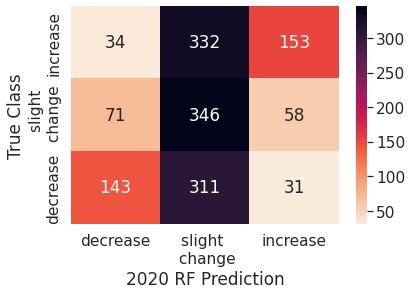

              precision    recall  f1-score   support

    decrease       0.58      0.29      0.39       485
    increase       0.63      0.29      0.40       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.43      1479
   macro avg       0.52      0.44      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44354293441514536


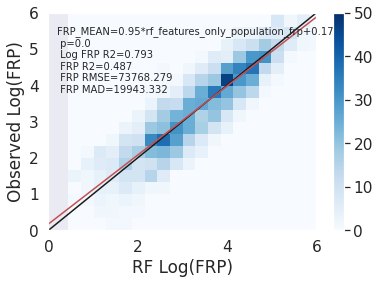

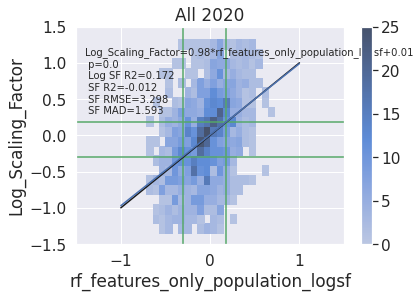

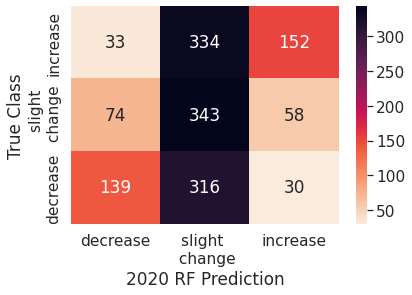

              precision    recall  f1-score   support

    decrease       0.57      0.29      0.38       485
    increase       0.63      0.29      0.40       519
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1479
   macro avg       0.51      0.43      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4496281271129141


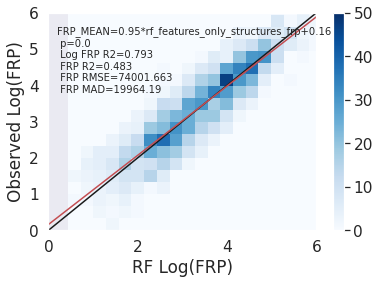

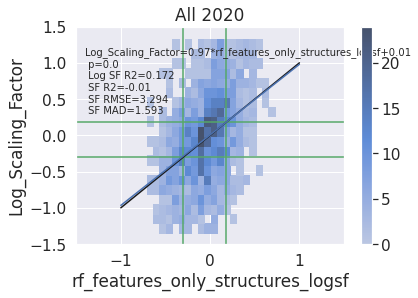

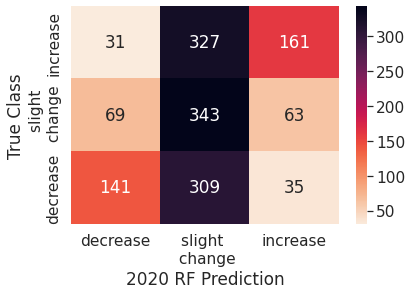

              precision    recall  f1-score   support

    decrease       0.59      0.29      0.39       485
    increase       0.62      0.31      0.41       519
   no_change       0.35      0.72      0.47       475

    accuracy                           0.44      1479
   macro avg       0.52      0.44      0.42      1479
weighted avg       0.52      0.44      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4462474645030426


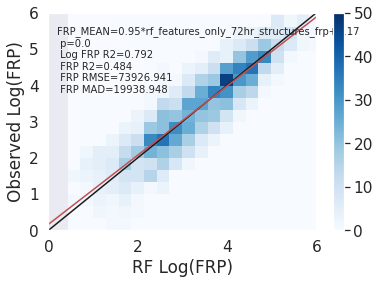

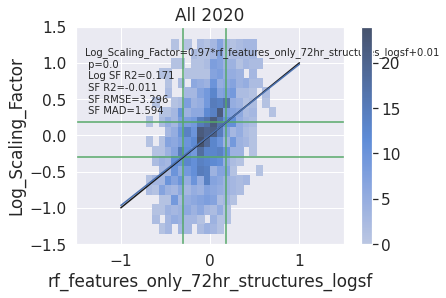

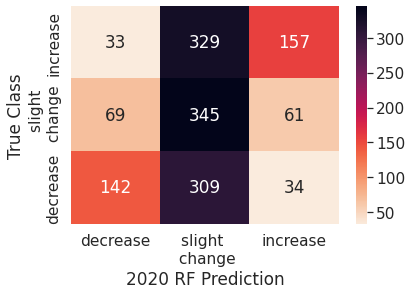

              precision    recall  f1-score   support

    decrease       0.58      0.29      0.39       485
    increase       0.62      0.30      0.41       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.44      1479
   macro avg       0.52      0.44      0.42      1479
weighted avg       0.52      0.44      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44354293441514536


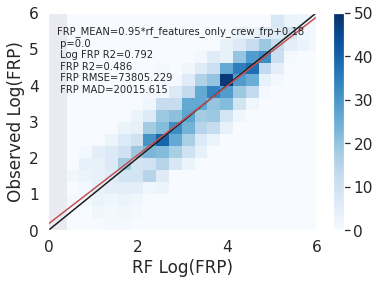

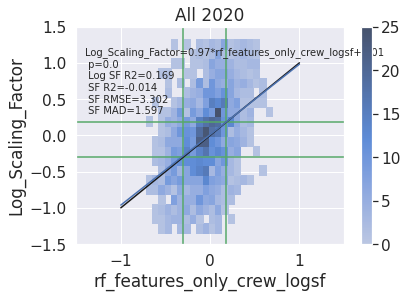

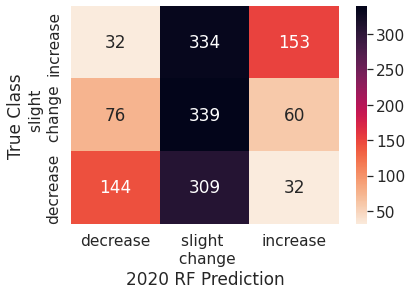

              precision    recall  f1-score   support

    decrease       0.57      0.30      0.39       485
    increase       0.62      0.29      0.40       519
   no_change       0.35      0.71      0.47       475

    accuracy                           0.43      1479
   macro avg       0.51      0.44      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4462474645030426


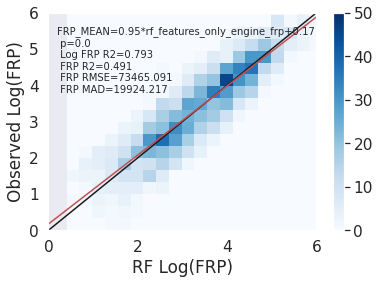

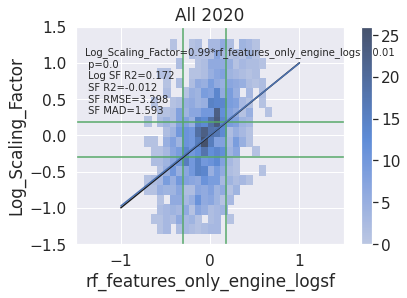

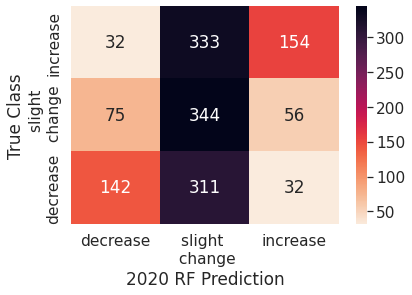

              precision    recall  f1-score   support

    decrease       0.57      0.29      0.39       485
    increase       0.64      0.30      0.40       519
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1479
   macro avg       0.52      0.44      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44421906693711966


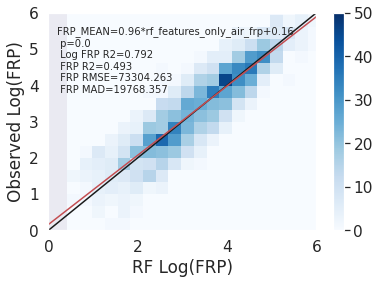

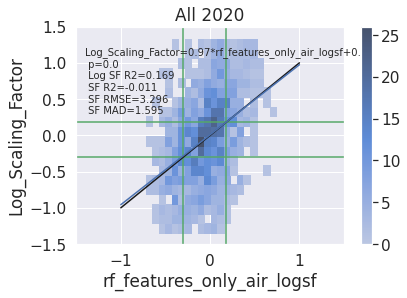

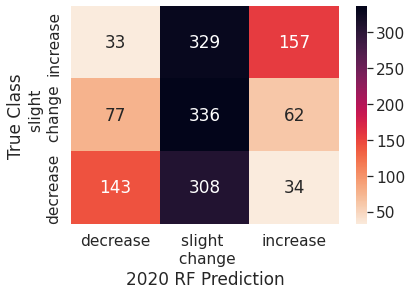

              precision    recall  f1-score   support

    decrease       0.57      0.29      0.39       485
    increase       0.62      0.30      0.41       519
   no_change       0.35      0.71      0.46       475

    accuracy                           0.43      1479
   macro avg       0.51      0.43      0.42      1479
weighted avg       0.51      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4455713319810683


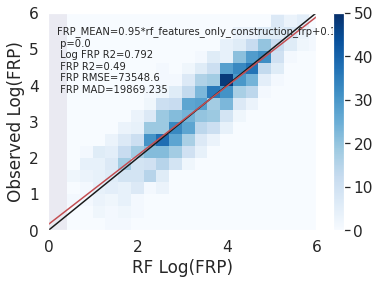

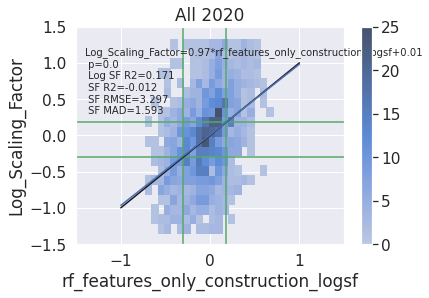

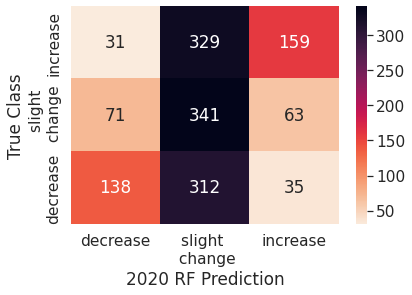

              precision    recall  f1-score   support

    decrease       0.57      0.28      0.38       485
    increase       0.62      0.31      0.41       519
   no_change       0.35      0.72      0.47       475

    accuracy                           0.43      1479
   macro avg       0.51      0.44      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4469235970250169


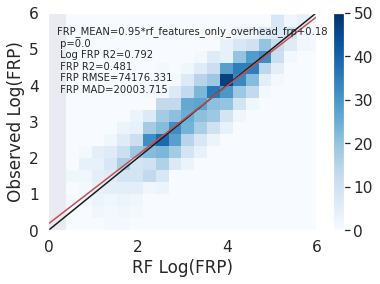

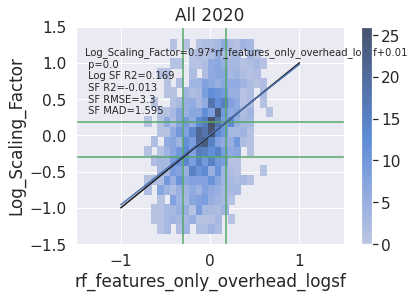

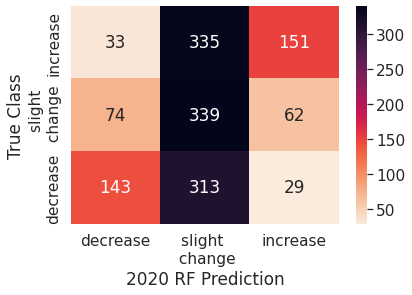

              precision    recall  f1-score   support

    decrease       0.57      0.29      0.39       485
    increase       0.62      0.29      0.40       519
   no_change       0.34      0.71      0.46       475

    accuracy                           0.43      1479
   macro avg       0.51      0.43      0.42      1479
weighted avg       0.52      0.43      0.42      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44286680189317107


In [50]:
# Plotting
for ii in range(1,len(feature_set_names)):

    frp_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_frp', 'FRP_MEAN','rf_'+feature_set_names[ii]+'_logfrp', 'log_FRP_MEAN', 'Blues', 0, 50,'RF Log(FRP)')
    plot_2dhist_withfit(data_test_2020, 'rf_'+feature_set_names[ii]+'_sf', 'Scaling_Factor','rf_'+feature_set_names[ii]+'_logsf', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+feature_set_names[ii]+'_cat', '2020 RF Prediction')  


    print('Fraction within a factor of two: ' + str(len(np.where((data_test_2020['FRP_MEAN_1']<=2*data_test_2020['FRP_MEAN'])&
              (data_test_2020['FRP_MEAN_1']>=0.5*data_test_2020['FRP_MEAN']))[0])/len(data_test_2020)))
    
    print('Fraction within a factor of two: ' + str(len(np.where((data_test_2020['rf_'+feature_set_names[ii]+'_frp']<=2*data_test_2020['FRP_MEAN'])&
              (data_test_2020['rf_'+feature_set_names[ii]+'_frp']>=0.5*data_test_2020['FRP_MEAN']))[0])/len(data_test_2020)))
    
    

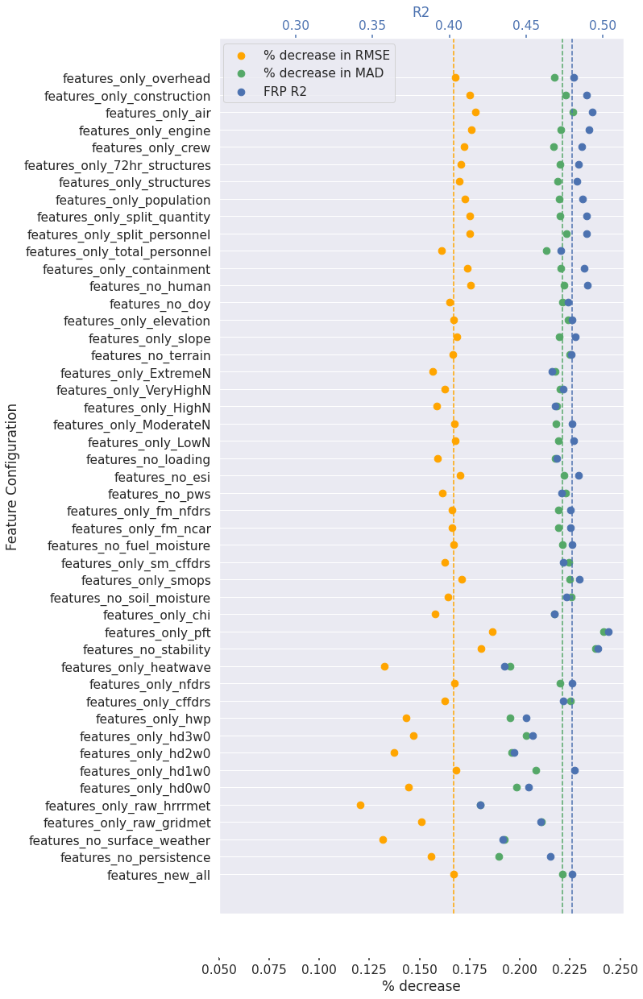

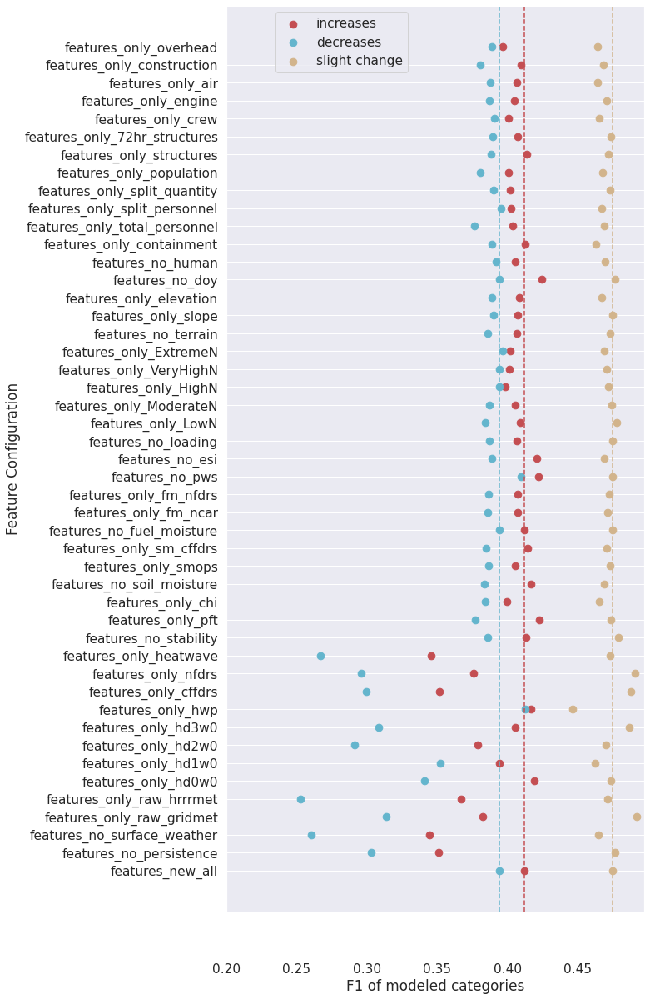

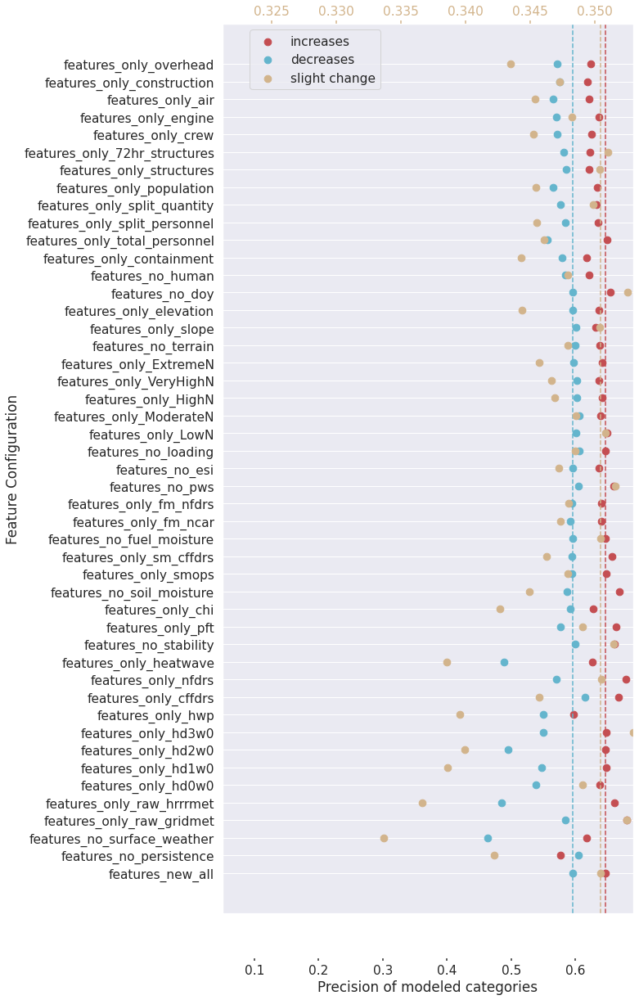

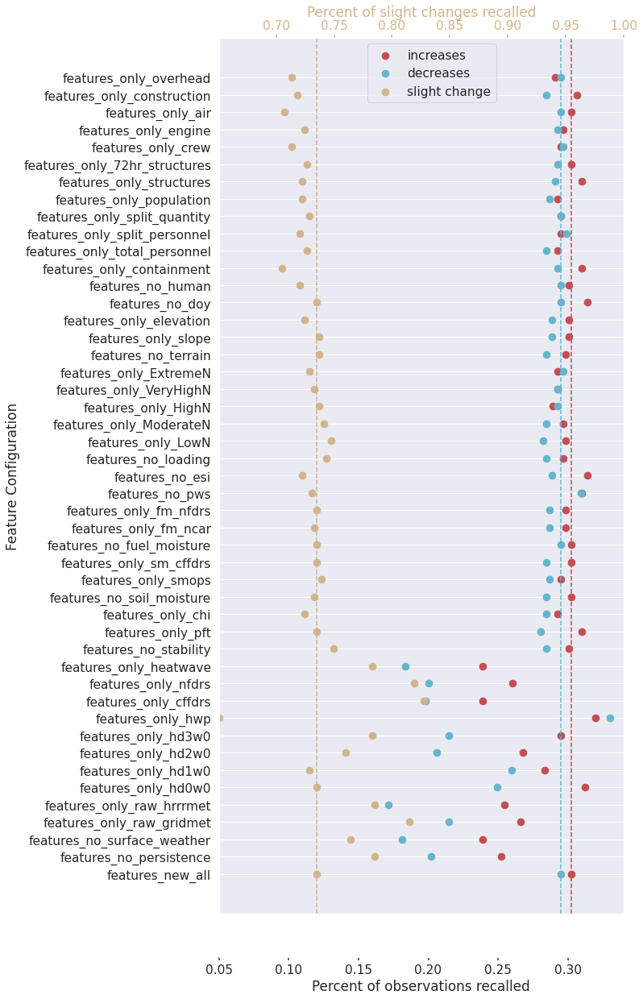

In [53]:
# everything in one figure, 8/11
all_sensitivity_tests = ['features_new_all', 'features_no_persistence', 
                         'features_no_surface_weather', #weather
                         'features_only_raw_gridmet', 'features_only_raw_hrrrmet', 
                         'features_only_hd0w0','features_only_hd1w0',
                         'features_only_hd2w0','features_only_hd3w0', 'features_only_hwp',
                         'features_only_cffdrs', 'features_only_nfdrs', 'features_only_heatwave',
                         'features_no_stability', #stability
                         'features_only_pft', 'features_only_chi',
                         'features_no_soil_moisture', #soil m
                         'features_only_smops','features_only_sm_cffdrs',
                         'features_no_fuel_moisture', #fuelm
                         'features_only_fm_ncar', 'features_only_fm_nfdrs',
                         'features_no_pws', #PWS
                         'features_no_esi', #ESI
                         'features_no_loading', #loading
                         'features_only_LowN','features_only_ModerateN','features_only_HighN',
                         'features_only_VeryHighN', 'features_only_ExtremeN',
                         'features_no_terrain', #terrain
                         'features_only_slope', 'features_only_elevation',
                         'features_no_doy', #DOY
                         'features_no_human', #human factors
                         'features_only_containment','features_only_total_personnel',
                         'features_only_split_personnel','features_only_split_quantity',
                         'features_only_population','features_only_structures',
                         'features_only_72hr_structures',
                         'features_only_crew', 'features_only_engine','features_only_air', 
                         'features_only_construction','features_only_overhead']

plot_frp_sensitivity_metrics(df_error_metrics, all_sensitivity_tests)

plot_f1_sensitivity_metrics(df_error_metrics, all_sensitivity_tests)
plot_precision_sensitivity_metrics(df_error_metrics, all_sensitivity_tests)
plot_recall_sensitivity_metrics(df_error_metrics, all_sensitivity_tests)

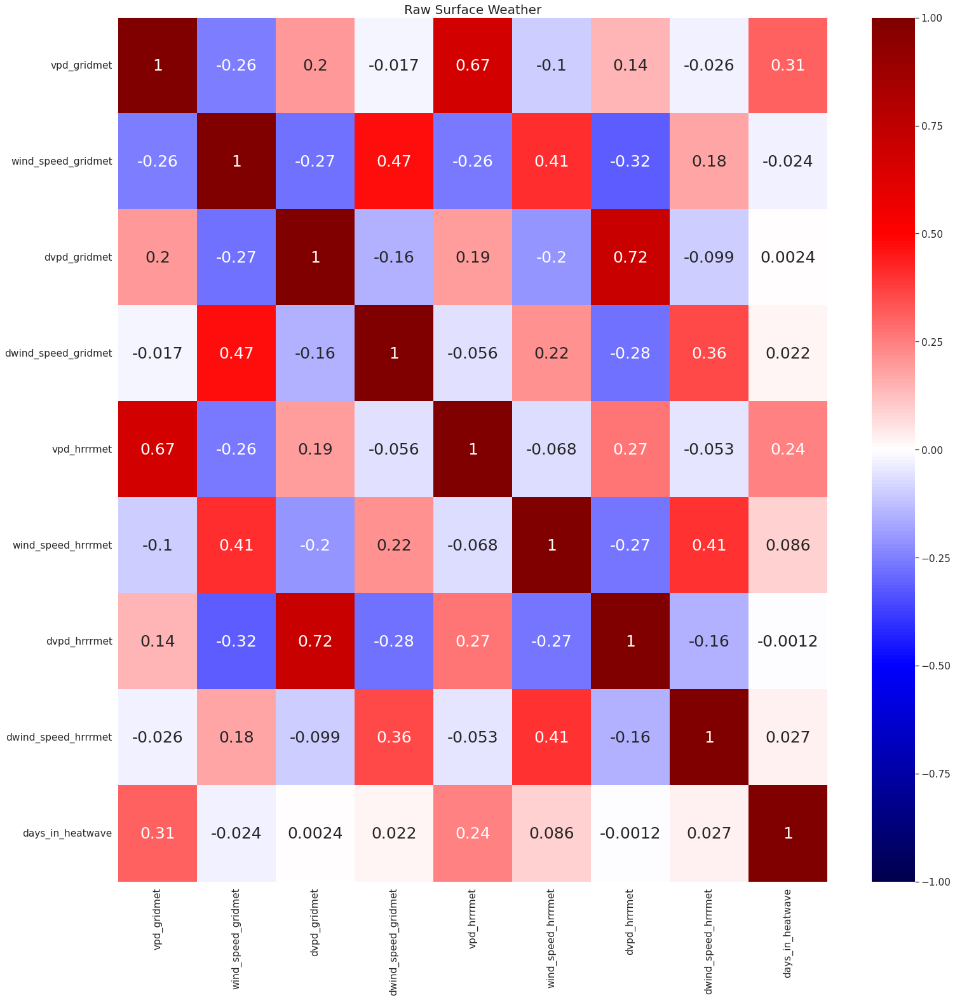

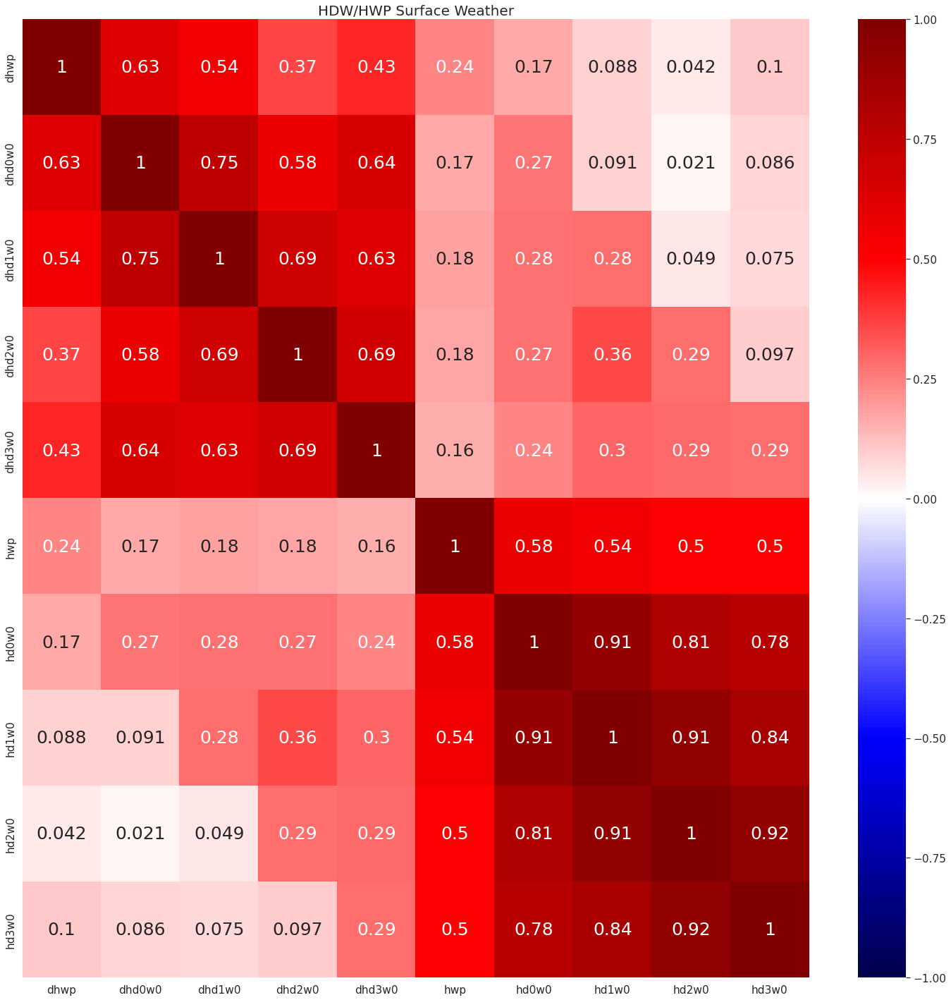

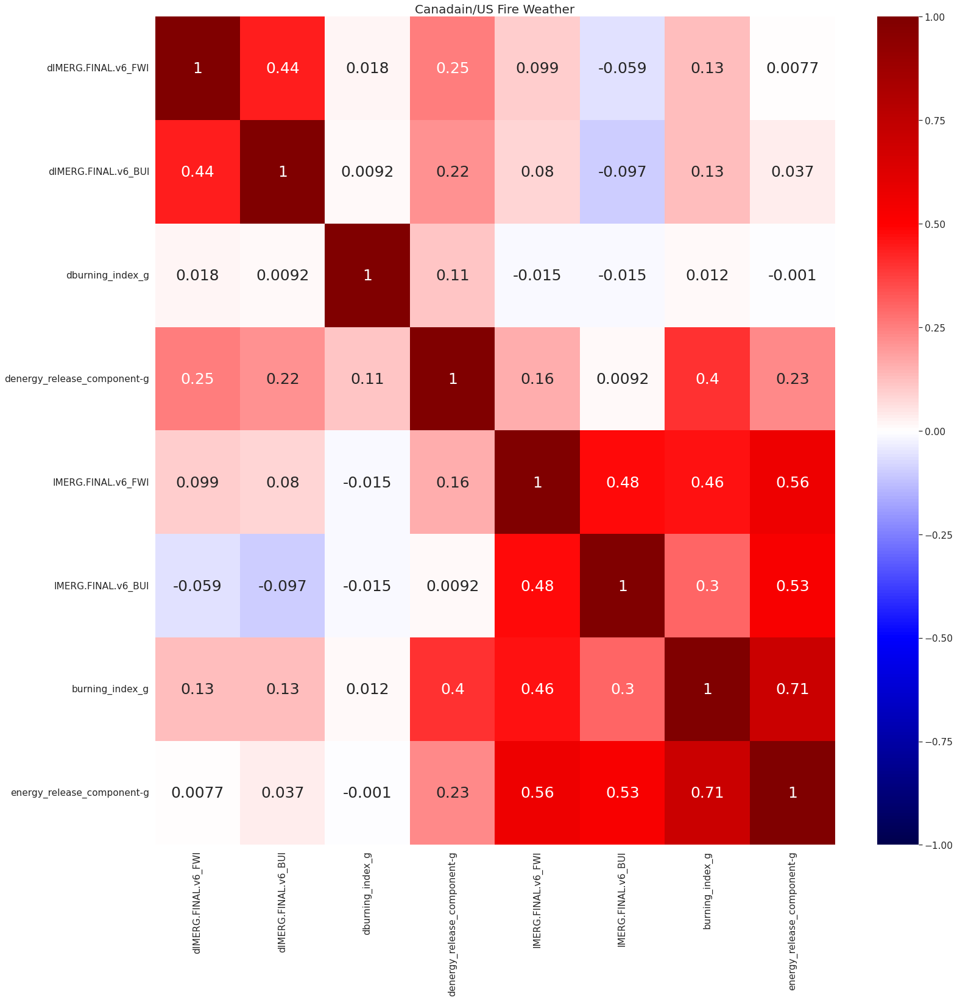

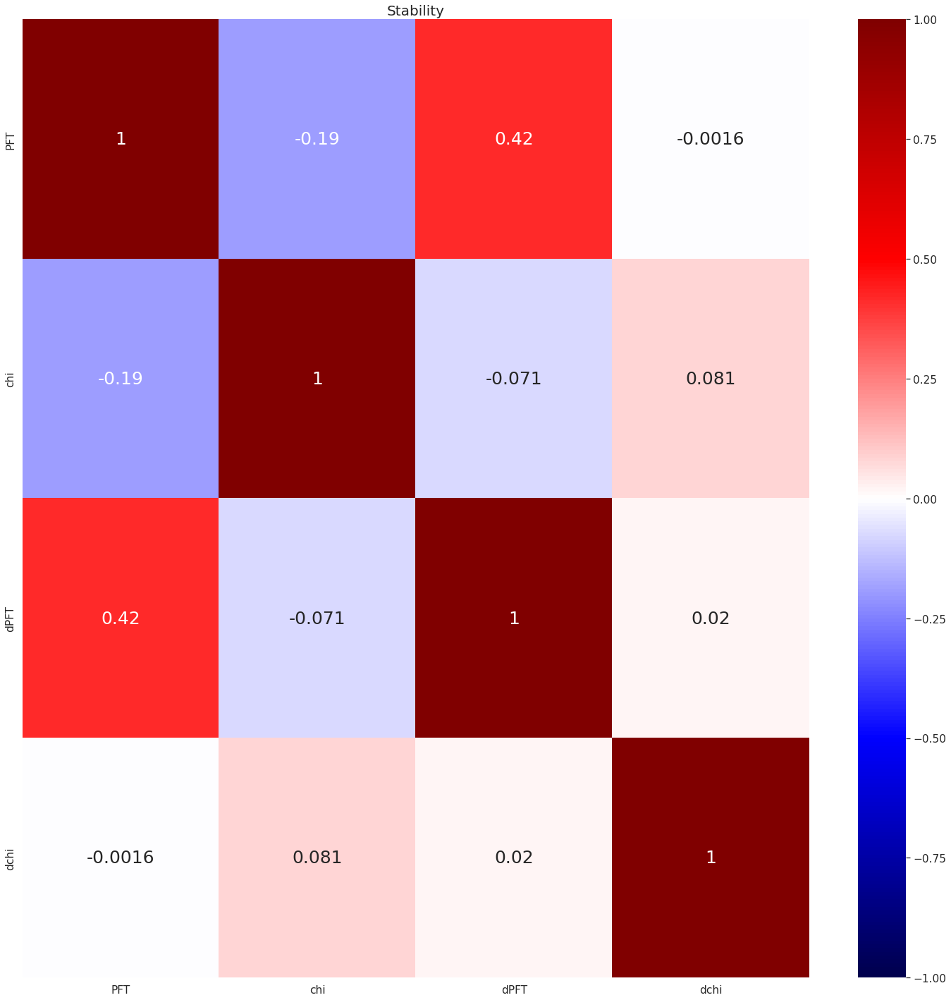

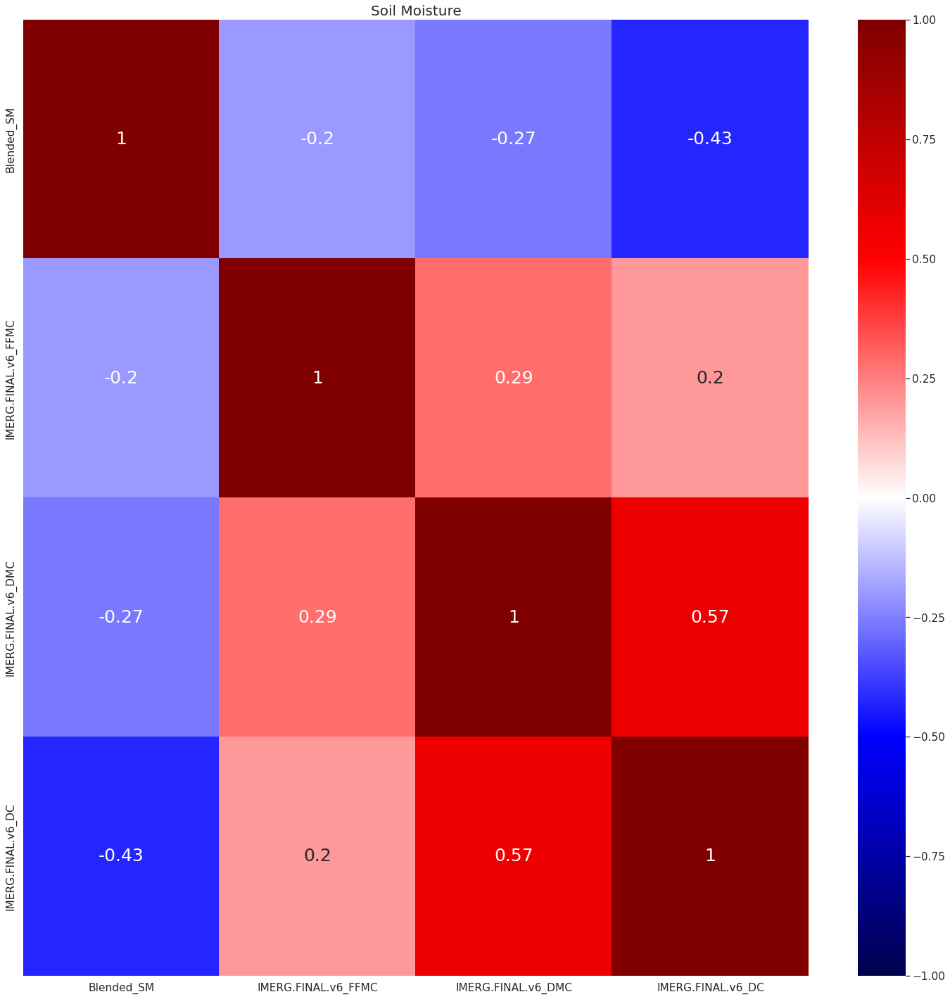

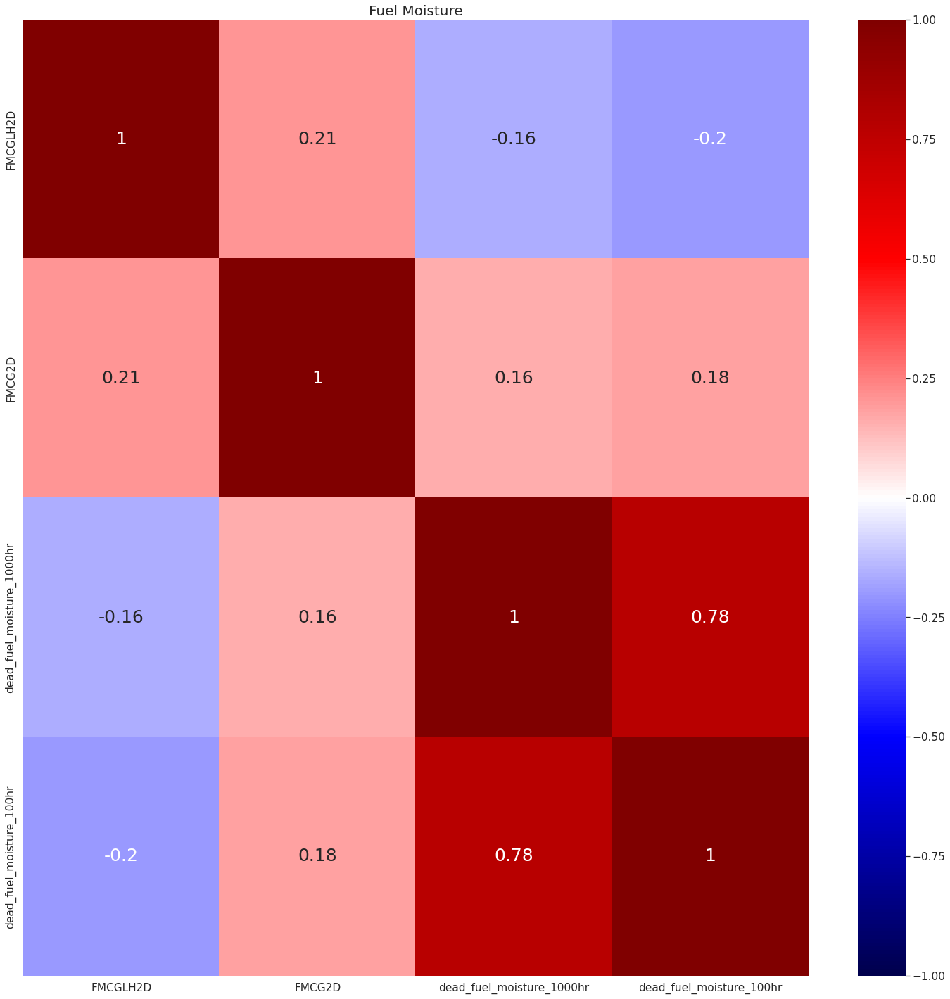

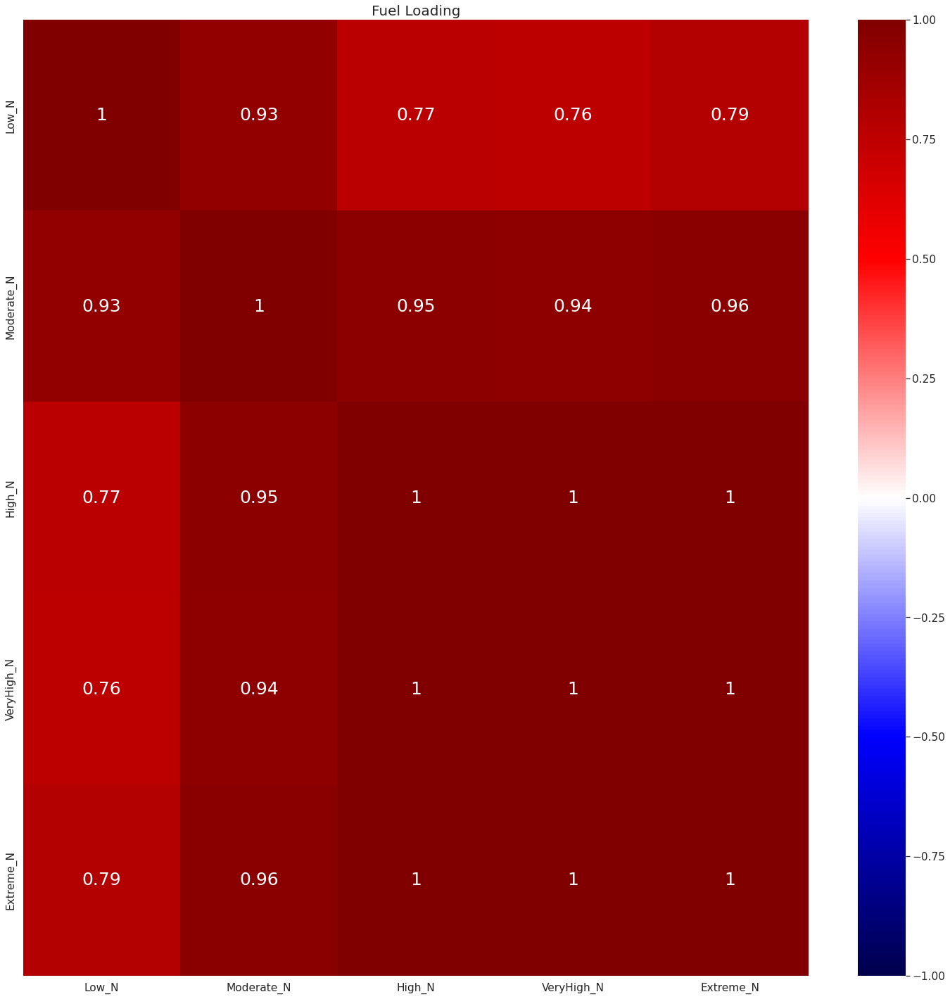

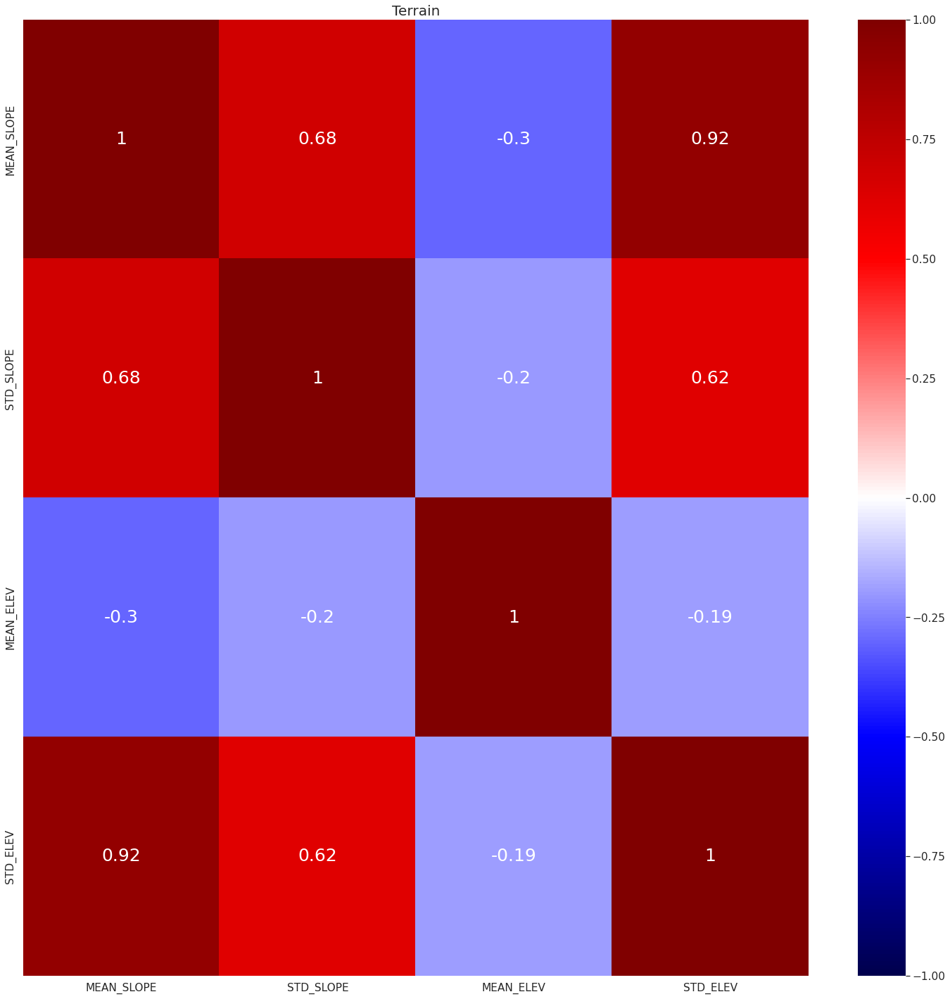

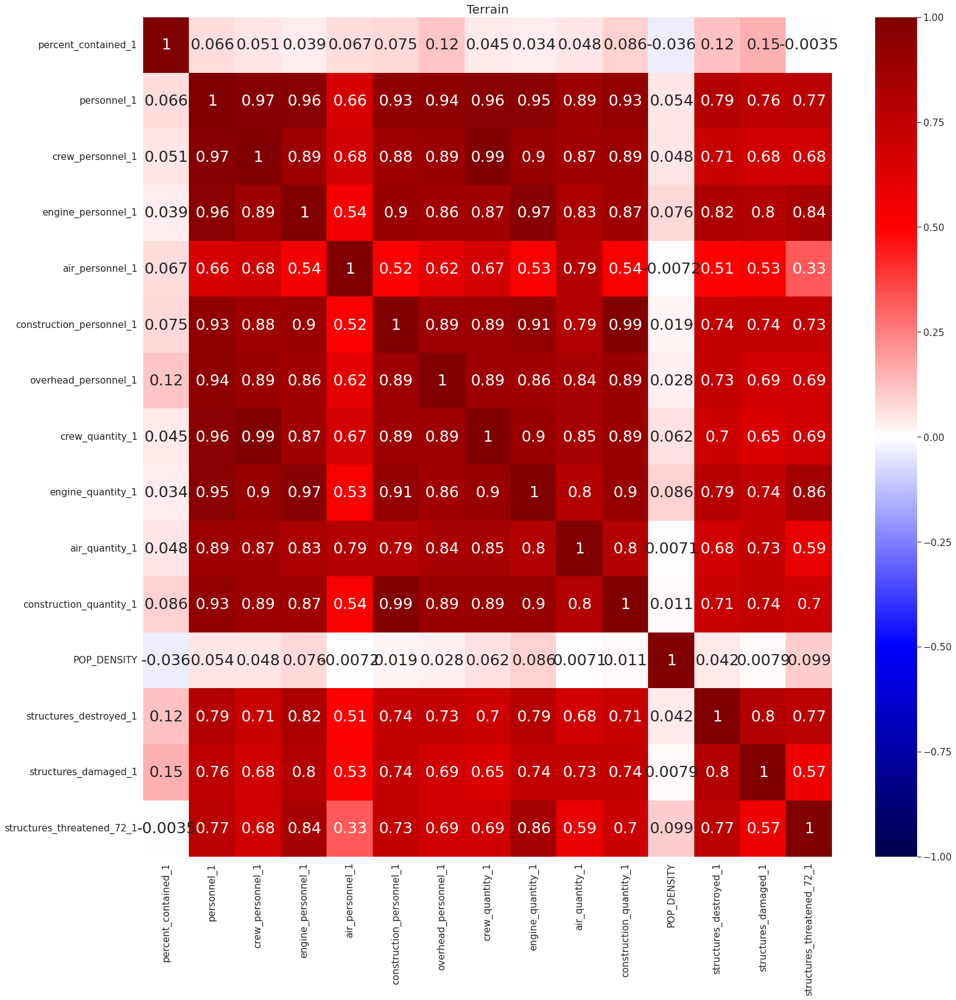

In [74]:
plot_correlations(data_train_1921[["vpd_gridmet","wind_speed_gridmet","dvpd_gridmet","dwind_speed_gridmet",
 "vpd_hrrrmet","wind_speed_hrrrmet","dvpd_hrrrmet","dwind_speed_hrrrmet",
 "days_in_heatwave"]],'Raw Surface Weather','pearson', 25)


plot_correlations(data_train_1921[["dhwp",
 "dhd0w0","dhd1w0", "dhd2w0", "dhd3w0","hwp","hd0w0", "hd1w0", "hd2w0", "hd3w0"]],
                  'HDW/HWP Surface Weather','pearson', 25)

plot_correlations(data_train_1921[[
"dIMERG.FINAL.v6_FWI","dIMERG.FINAL.v6_BUI", "dburning_index_g","denergy_release_component-g",
    "IMERG.FINAL.v6_FWI","IMERG.FINAL.v6_BUI","burning_index_g","energy_release_component-g"]],
                  'Canadain/US Fire Weather','pearson', 25)

plot_correlations(data_train_1921[["PFT", "chi", 'dPFT', 'dchi']],
                  'Stability','pearson', 25)

plot_correlations(data_train_1921[["Blended_SM", "IMERG.FINAL.v6_FFMC", "IMERG.FINAL.v6_DMC", "IMERG.FINAL.v6_DC"]],
                  'Soil Moisture','pearson', 25)

plot_correlations(data_train_1921[features_by_category['fuel_mositure']],
                  'Fuel Moisture','pearson', 25)

plot_correlations(data_train_1921[features_by_category['loading']],
                  'Fuel Loading','pearson', 25)

plot_correlations(data_train_1921[features_by_category['terrain_slope']+features_by_category['terrain_elevation']],
                  'Terrain','pearson', 25)

plot_correlations(data_train_1921[features_by_category['containment']+\
                                  features_by_category['total_personnel']+\
                                  features_by_category['split_personnel']+\
                                  features_by_category['split_quantity']+\
                                  features_by_category['pop']+\
                                  features_by_category['structures']],
                  'Terrain','pearson', 25)

# First Try at optimal subsets
We were maximizing R2, which is sensitive to large values

In [30]:
feature_subsets = {}

#all features
not_allowed = []
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_hdw'] = ['hd1w0', 'dhd1w0', 'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRP_MEAN_1' ]
feature_subsets['features_hwp'] = ['hwp', 'dhwp', 'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRP_MEAN_1' ]

feature_subsets['features_can'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                   'PFT', 'dPFT', 
                                    'IMERG.FINAL.v6_FFMC','IMERG.FINAL.v6_DMC', 'IMERG.FINAL.v6_DC',
                                   'PWS', 'Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRP_MEAN_1' ]

feature_subsets['features_us'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                   'PFT', 'dPFT', 
                                'Blended_SM','dead_fuel_moisture_100hr', 'dead_fuel_moisture_1000hr',
                                   'PWS', 'Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRP_MEAN_1' ]

In [55]:
def summarize_error(df, truth_name, method_name, train_vars):
    r2 =r2_score(df[truth_name], df[method_name])
    rmse =RMSE(df[truth_name], df[method_name])
    mad =MAD(df[truth_name], df[method_name])
    
    n = len(df[truth_name].values)
    k = len(train_vars)
    
    adjusted_r2 = 1-(((1-r2)*(n-1))/(n-k-1))
    
    return(r2,adjusted_r2, rmse, mad)

In [61]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all', 'features_hwp', 'features_hdw','features_can','features_us']



df_error_metrics = pd.DataFrame(index=feature_set_names, 
                                columns=['FRP_R2','FRP_R2_adj', 'FRP_RMSE', 'FRP_MAD',
                                         'log_FRP_R2','log_FRP_R2_adj', 'log_FRP_RMSE', 'log_FRP_MAD',
                                        'SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD',
                                        'log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD',

                                        'decrease_precision', 'decrease_recall', 
                                         'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])

#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_frp'] = data_test_2020['FRP_MEAN_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfrp'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_frp'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors_frp = summarize_error(data_test_2020,'FRP_MEAN', 'FRP_MEAN_1', ['persistence'])
        errors_logfrp = summarize_error(data_test_2020, 'log_FRP_MEAN', 'log_FRP_MEAN_1',['persistence'])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'persistence',['persistence'])
        errors_logsf = summarize_error(data_test_2020,'Scaling_Factor', 'log_persistence',['persistence'])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors_frp = summarize_error(data_test_2020,'FRP_MEAN', 'rf_'+feature_set_names[ii]+'_frp',feature_subsets[feature_set_names[ii]])
        errors_logfrp = summarize_error(data_test_2020, 'log_FRP_MEAN', 'rf_'+feature_set_names[ii]+'_logfrp',feature_subsets[feature_set_names[ii]])
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf',feature_subsets[feature_set_names[ii]])
        errors_logsf = summarize_error(data_test_2020, 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_logsf',feature_subsets[feature_set_names[ii]])
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics.loc[feature_set_names[ii],['FRP_R2','FRP_R2_adj', 'FRP_RMSE', 'FRP_MAD']] = errors_frp
    df_error_metrics.loc[feature_set_names[ii],['log_FRP_R2','log_FRP_R2_adj', 'log_FRP_RMSE', 'log_FRP_MAD']] = errors_logfrp
    df_error_metrics.loc[feature_set_names[ii],['SF_R2', 'SF_R2_adj', 'SF_RMSE', 'SF_MAD']] = errors_sf
    df_error_metrics.loc[feature_set_names[ii],['log_SF_R2', 'log_SF_R2_adj', 'log_SF_RMSE', 'log_SF_MAD']] = errors_logsf
    
    df_error_metrics.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']

#persistence

df_error_metrics['percent_change_FRP_RMSE'] = (df_error_metrics.loc['persistence','FRP_RMSE']-df_error_metrics['FRP_RMSE'])/df_error_metrics.loc['persistence','FRP_RMSE']
df_error_metrics['percent_change_FRP_MAD'] = (df_error_metrics.loc['persistence','FRP_MAD']-df_error_metrics['FRP_MAD'])/df_error_metrics.loc['persistence','FRP_MAD']

df_error_metrics['percent_change_logFRP_RMSE'] = (df_error_metrics.loc['persistence','log_FRP_RMSE']-df_error_metrics['log_FRP_RMSE'])/df_error_metrics.loc['persistence','log_FRP_RMSE']
df_error_metrics['percent_change_logFRP_MAD'] = (df_error_metrics.loc['persistence','log_FRP_MAD']-df_error_metrics['log_FRP_MAD'])/df_error_metrics.loc['persistence','log_FRP_MAD']

df_error_metrics['percent_change_SF_RMSE'] = (df_error_metrics.loc['persistence','SF_RMSE']-df_error_metrics['SF_RMSE'])/df_error_metrics.loc['persistence','SF_RMSE']
df_error_metrics['percent_change_SF_MAD'] = (df_error_metrics.loc['persistence','SF_MAD']-df_error_metrics['SF_MAD'])/df_error_metrics.loc['persistence','SF_MAD']

df_error_metrics['percent_change_logSF_RMSE'] = (df_error_metrics.loc['persistence','log_SF_RMSE']-df_error_metrics['log_SF_RMSE'])/df_error_metrics.loc['persistence','log_SF_RMSE']
df_error_metrics['percent_change_logSF_MAD'] = (df_error_metrics.loc['persistence','log_SF_MAD']-df_error_metrics['log_SF_MAD'])/df_error_metrics.loc['persistence','log_SF_MAD']


print(df_error_metrics)    

features_new_all OOB R2 score is: 0.2324856729233259
features_hwp OOB R2 score is: 0.15820886537188994
features_hdw OOB R2 score is: 0.13087907540986043
features_can OOB R2 score is: 0.10597225155416112
features_us OOB R2 score is: 0.14196913340167427
DOING PERSISTENCE
                    FRP_R2 FRP_R2_adj      FRP_RMSE       FRP_MAD log_FRP_R2  \
persistence       0.250207   0.249699  89141.375756  25560.608118   0.748579   
features_new_all  0.479947   0.455253  74239.057108  19907.852057   0.794927   
features_hwp      0.347614   0.341375  83149.757034  21131.387613   0.788246   
features_hdw      0.474092   0.469063  74655.776267  20537.514466   0.778018   
features_can       0.47346   0.466968  74700.639281  19808.249593   0.782705   
features_us       0.448847   0.442052  76426.640183  20523.454361   0.778367   

                 log_FRP_R2_adj log_FRP_RMSE log_FRP_MAD     SF_R2 SF_R2_adj  \
persistence            0.748409     0.571232    0.461311 -0.115631 -0.116387   
features_

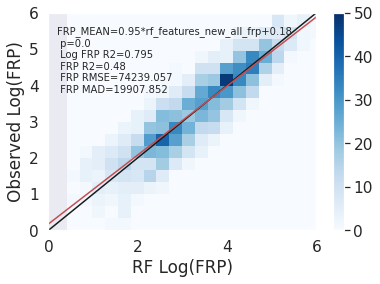

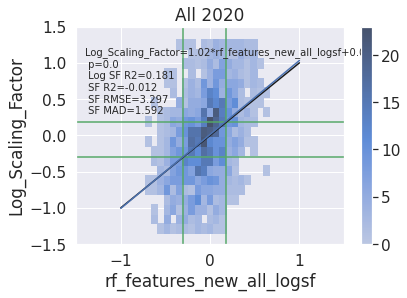

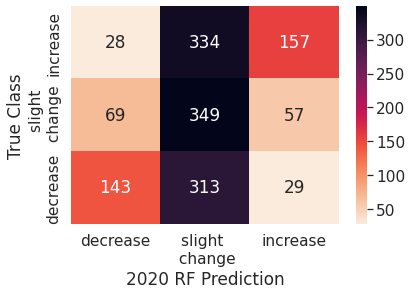

              precision    recall  f1-score   support

    decrease       0.60      0.29      0.39       485
    increase       0.65      0.30      0.41       519
   no_change       0.35      0.73      0.47       475

    accuracy                           0.44      1479
   macro avg       0.53      0.44      0.43      1479
weighted avg       0.53      0.44      0.43      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4388100067613252


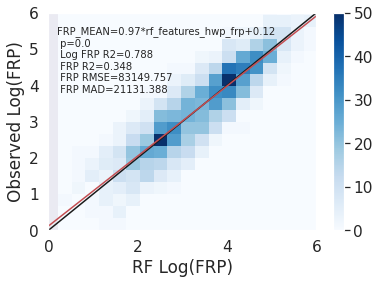

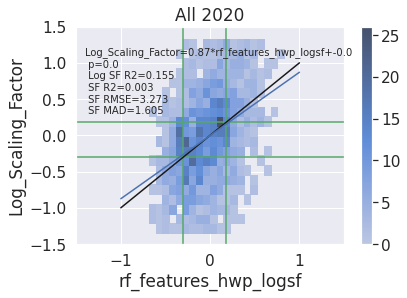

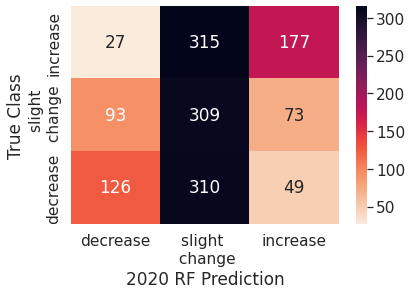

              precision    recall  f1-score   support

    decrease       0.51      0.26      0.34       485
    increase       0.59      0.34      0.43       519
   no_change       0.33      0.65      0.44       475

    accuracy                           0.41      1479
   macro avg       0.48      0.42      0.41      1479
weighted avg       0.48      0.41      0.41      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.43340094658553074


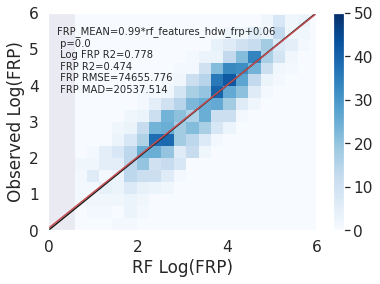

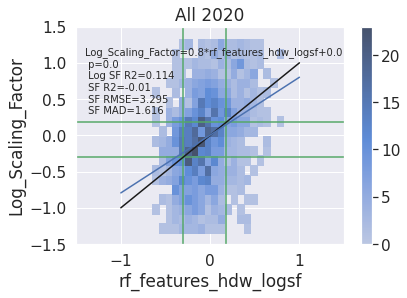

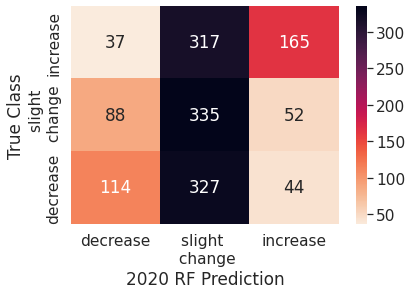

              precision    recall  f1-score   support

    decrease       0.48      0.24      0.31       485
    increase       0.63      0.32      0.42       519
   no_change       0.34      0.71      0.46       475

    accuracy                           0.42      1479
   macro avg       0.48      0.42      0.40      1479
weighted avg       0.49      0.42      0.40      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4347532116294794


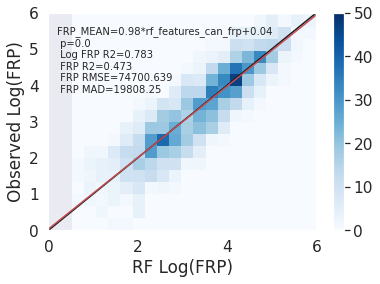

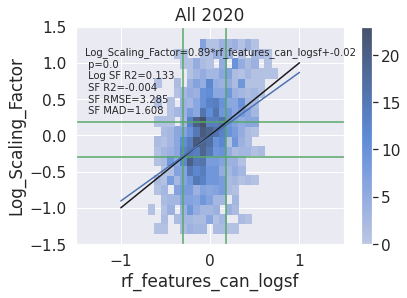

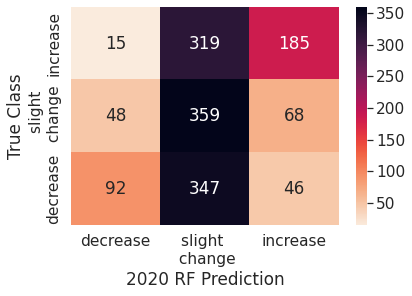

              precision    recall  f1-score   support

    decrease       0.59      0.19      0.29       485
    increase       0.62      0.36      0.45       519
   no_change       0.35      0.76      0.48       475

    accuracy                           0.43      1479
   macro avg       0.52      0.43      0.41      1479
weighted avg       0.52      0.43      0.41      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.44421906693711966


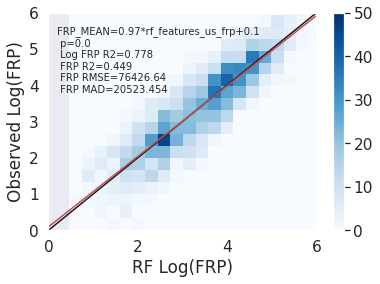

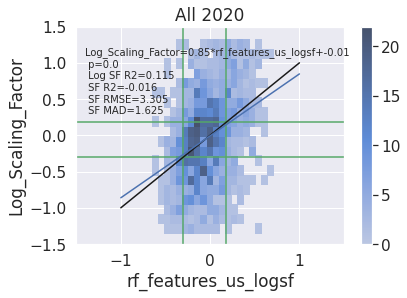

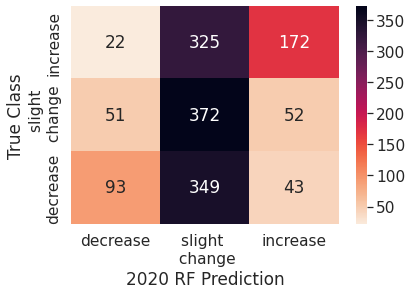

              precision    recall  f1-score   support

    decrease       0.56      0.19      0.29       485
    increase       0.64      0.33      0.44       519
   no_change       0.36      0.78      0.49       475

    accuracy                           0.43      1479
   macro avg       0.52      0.44      0.40      1479
weighted avg       0.52      0.43      0.40      1479

Fraction within a factor of two: 0.39418526031102097
Fraction within a factor of two: 0.4367816091954023


In [115]:
# Plotting
for ii in range(1,len(feature_set_names)):

    frp_hist2d(data_test_2020, 'rf_'+feature_set_names[ii]+'_frp', 'FRP_MEAN','rf_'+feature_set_names[ii]+'_logfrp', 'log_FRP_MEAN', 'Blues', 0, 50,'RF Log(FRP)')
    plot_2dhist_withfit(data_test_2020, 'rf_'+feature_set_names[ii]+'_sf', 'Scaling_Factor','rf_'+feature_set_names[ii]+'_logsf', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+feature_set_names[ii]+'_cat', '2020 RF Prediction')  


    print('Fraction within a factor of two: ' + str(len(np.where((data_test_2020['FRP_MEAN_1']<=2*data_test_2020['FRP_MEAN'])&
              (data_test_2020['FRP_MEAN_1']>=0.5*data_test_2020['FRP_MEAN']))[0])/len(data_test_2020)))
    
    print('Fraction within a factor of two: ' + str(len(np.where((data_test_2020['rf_'+feature_set_names[ii]+'_frp']<=2*data_test_2020['FRP_MEAN'])&
              (data_test_2020['rf_'+feature_set_names[ii]+'_frp']>=0.5*data_test_2020['FRP_MEAN']))[0])/len(data_test_2020)))
    

In [48]:
def plot_frp_sensitivity_metrics(df_metrics, vars_plot):
    
    df_error_metrics_plot = df_metrics.loc[vars_plot]
    fig, ax = plt.subplots(figsize=(9,20))

    twin1 = ax.twiny()


    # Offset the top spine of twin2.  The ticks and label have already been
    # placed above by twinx above.
    ax.spines['bottom'].set_position(("axes", -0.05))


    p1=ax.scatter(df_error_metrics_plot['percent_change_FRP_RMSE'],df_error_metrics_plot.index,c='orange',s=75, label='% decrease in RMSE')
    p2=ax.scatter(df_error_metrics_plot['percent_change_FRP_MAD'],df_error_metrics_plot.index,c='g',s=75,label='% decrease in MAD')
    p3=twin1.scatter(df_error_metrics_plot['FRP_R2'],df_error_metrics_plot.index, c='b',s=75,label='FRP R2')
    p4=twin1.scatter(df_error_metrics_plot['FRP_R2_adj'],df_error_metrics_plot.index, c='r',s=75,label='FRP Adj. R2')

    #plot the vertical lines
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'percent_change_FRP_RMSE'],c='orange', linestyle='--')
    ax.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'percent_change_FRP_MAD'],c='g', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'FRP_R2'],c='b', linestyle='--')
    twin1.axvline(x=df_error_metrics_plot.loc[vars_plot[0], 'FRP_R2_adj'],c='r', linestyle='--')

    #set properties of the x labels
    twin1.set_xlim([df_error_metrics['FRP_R2'].min(),df_error_metrics['FRP_R2'].max()+.01])
    ax.set_xlim([0.05, #np.min(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].min().values),
                 np.max(df_error_metrics[['percent_change_FRP_RMSE', 'percent_change_FRP_MAD']].max().values)+.01])
    ax.set_xlabel("% decrease")
    ax.set_ylabel("Feature Configuration")
    twin1.set_xlabel("R2")


    twin1.xaxis.label.set_color('b')

    tkw = dict(size=4, width=1.5, grid_alpha=0)
    ax.tick_params(axis='x', **tkw)
    twin1.tick_params(axis='x', colors='b', **tkw)

    ax.legend(handles=[p1, p2, p3,p4], bbox_to_anchor=(0.45,1) )

    plt.show()

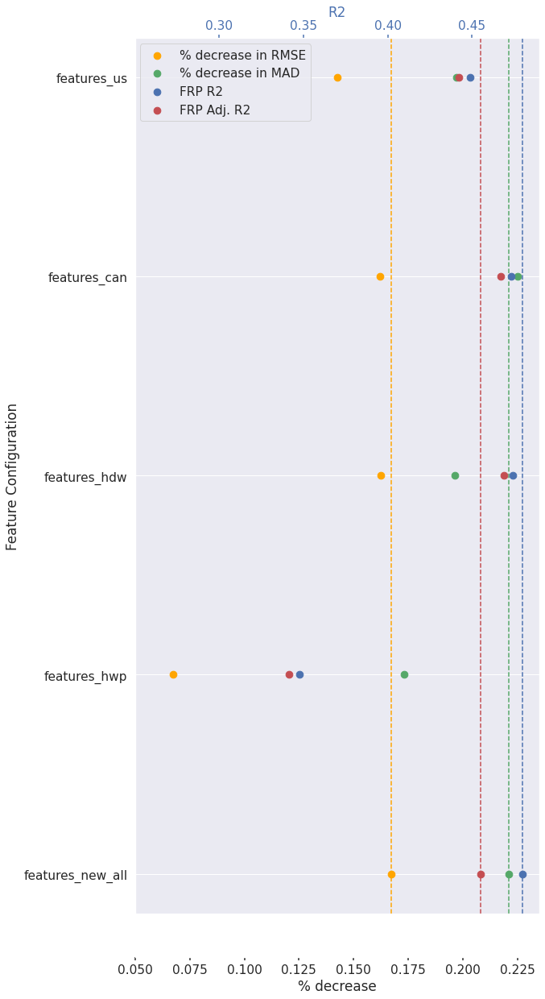

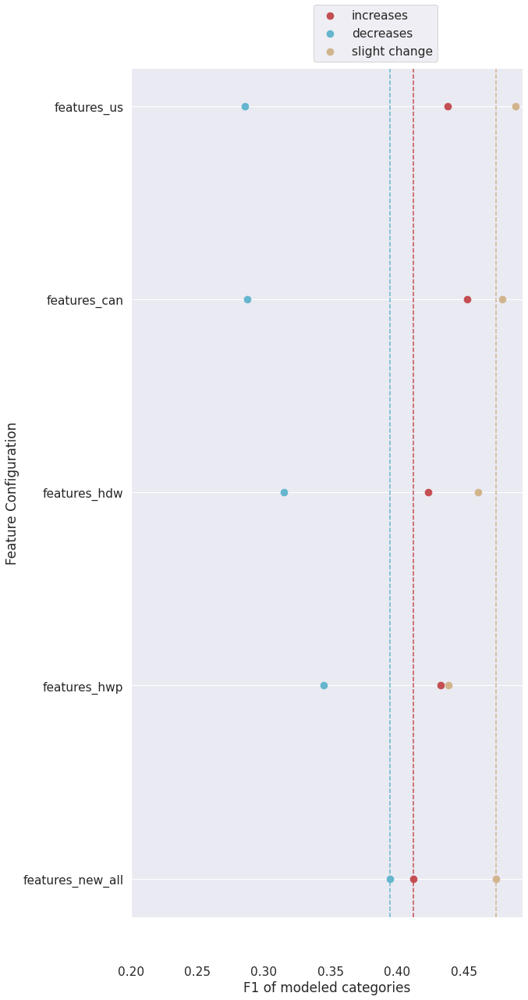

In [50]:
opt_subsets = ['features_new_all','features_hwp','features_hdw','features_can','features_us']

plot_frp_sensitivity_metrics(df_error_metrics, opt_subsets)
plot_f1_sensitivity_metrics(df_error_metrics, opt_subsets)
#plot_recall_sensitivity_metrics(df_error_metrics, opt_subsets)
#plot_precision_sensitivity_metrics(df_error_metrics, opt_subsets)

## Try #2 at optimal subsets

In [117]:
feature_subsets = {}

#all features
not_allowed = []
feature_subsets['features_new_all'] = generate_sensitivity_list(features_by_category, [var for var in category_list if var not in not_allowed], [])

feature_subsets['features_hdw'] = ['hd1w0', 'dhd1w0', 'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Low_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRP_MEAN_1' ]
feature_subsets['features_hwp'] = ['hwp', 'dhwp', 'PFT', 'dPFT', 
                                    'Blended_SM', 'PWS','Extreme_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRP_MEAN_1' ]

feature_subsets['features_can'] = ['IMERG.FINAL.v6_FWI', 'dIMERG.FINAL.v6_FWI',
                                   'IMERG.FINAL.v6_BUI', 'dIMERG.FINAL.v6_BUI',
                                   'PFT', 'dPFT', 
                                    'IMERG.FINAL.v6_FFMC','IMERG.FINAL.v6_DMC', 'IMERG.FINAL.v6_DC',
                                   'PWS', 'Extreme_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRP_MEAN_1' ]

feature_subsets['features_us'] = ['burning_index_g', 'dburning_index_g',
                                   'energy_release_component-g', 'denergy_release_component-g',
                                   'PFT', 'dPFT', 
                                'Blended_SM','dead_fuel_moisture_100hr', 'dead_fuel_moisture_1000hr',
                                   'PWS', 'Extreme_N',
                                   "MEAN_ELEV", "STD_ELEV",'POP_DENSITY', 'percent_contained_1', 
                                    'air_personnel_1','air_quantity_1','FRP_MEAN_1' ]

In [118]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_new_all', 'features_hwp', 'features_hdw','features_can','features_us']



df_error_metrics = pd.DataFrame(index=feature_set_names, 
                                columns=['LOG_FRP_R2', 'FRP_R2', 'FRP_RMSE', 'FRP_MAD',
                                         'LOG_SF_R2', 'SF_R2', 'SF_RMSE', 'SF_MAD',
                                        'decrease_precision', 'decrease_recall', 'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])

#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_frp'] = data_test_2020['FRP_MEAN_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfrp'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_frp'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors = summarize_error(data_test_2020,'FRP_MEAN', 'log_FRP_MEAN', 'FRP_MEAN_1', 'log_FRP_MEAN_1')
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'Log_Scaling_Factor', 'persistence', 'log_persistence')
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors = summarize_error(data_test_2020,'FRP_MEAN', 'log_FRP_MEAN', 'rf_'+feature_set_names[ii]+'_frp', 'rf_'+feature_set_names[ii]+'_logfrp')
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf', 'rf_'+feature_set_names[ii]+'_logsf')
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics.loc[feature_set_names[ii], 'LOG_FRP_R2'] = errors[0]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_R2'] = errors[1]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_RMSE'] = errors[2]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_MAD'] = errors[3]
    
    df_error_metrics.loc[feature_set_names[ii], 'LOG_SF_R2'] = errors_sf[0]
    df_error_metrics.loc[feature_set_names[ii], 'SF_R2'] = errors_sf[1]
    df_error_metrics.loc[feature_set_names[ii], 'SF_RMSE'] = errors_sf[2]
    df_error_metrics.loc[feature_set_names[ii], 'SF_MAD'] = errors_sf[3]
    
    df_error_metrics.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'decrease_f1'] = cr.loc['f1-score', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'increase_f1'] = cr.loc['f1-score', 'increase']

    df_error_metrics.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_f1'] = cr.loc['f1-score', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']

#persistence

df_error_metrics['percent_change_FRP_RMSE'] = (df_error_metrics.loc['persistence','FRP_RMSE']-df_error_metrics['FRP_RMSE'])/df_error_metrics.loc['persistence','FRP_RMSE']
df_error_metrics['percent_change_FRP_MAD'] = (df_error_metrics.loc['persistence','FRP_MAD']-df_error_metrics['FRP_MAD'])/df_error_metrics.loc['persistence','FRP_MAD']


df_error_metrics['percent_change_SF_RMSE'] = (df_error_metrics.loc['persistence','SF_RMSE']-df_error_metrics['SF_RMSE'])/df_error_metrics.loc['persistence','SF_RMSE']
df_error_metrics['percent_change_SF_MAD'] = (df_error_metrics.loc['persistence','SF_MAD']-df_error_metrics['SF_MAD'])/df_error_metrics.loc['persistence','SF_MAD']

    

features_new_all OOB R2 score is: 0.2324856729233259
features_hwp OOB R2 score is: 0.16632631106147233
features_hdw OOB R2 score is: 0.13087907540986043
features_can OOB R2 score is: 0.11586891442863823
features_us OOB R2 score is: 0.14878878539158447
DOING PERSISTENCE


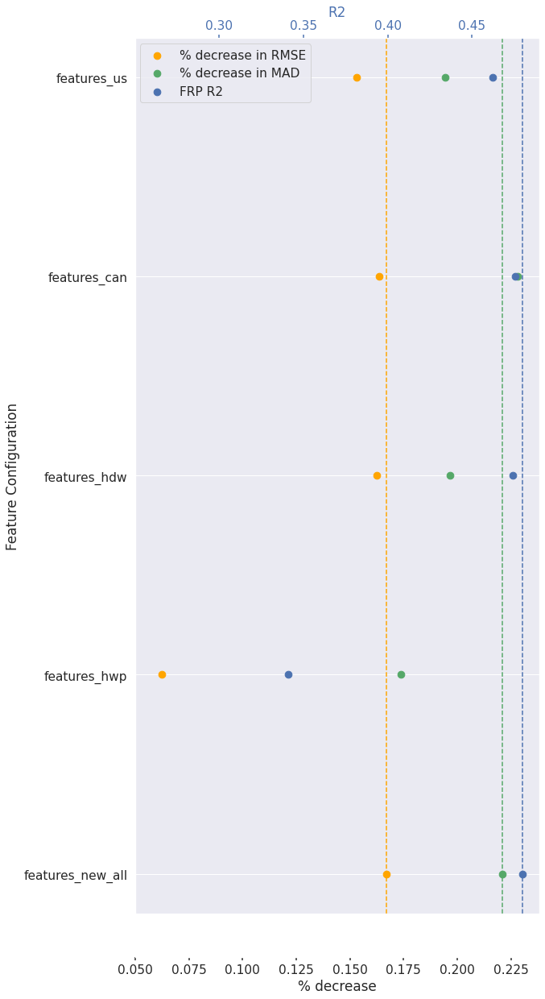

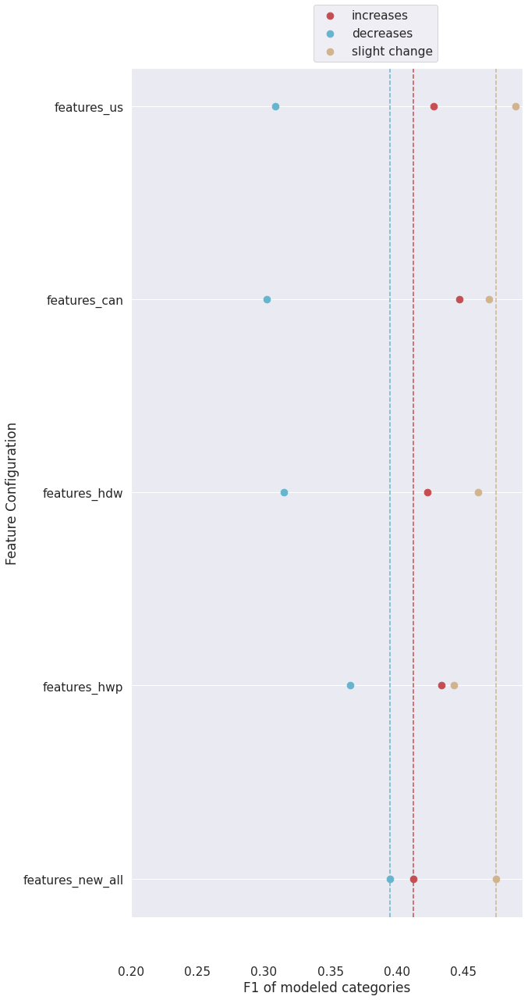

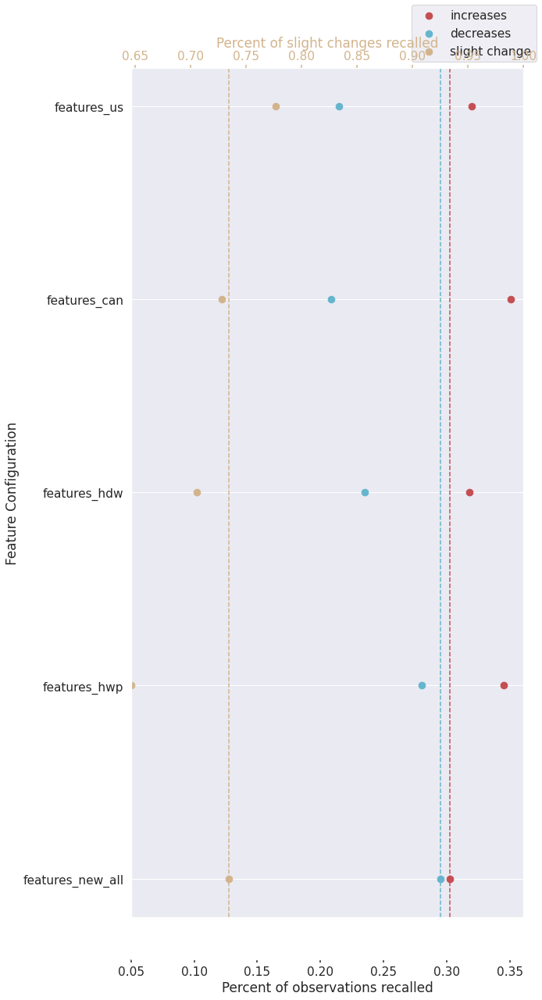

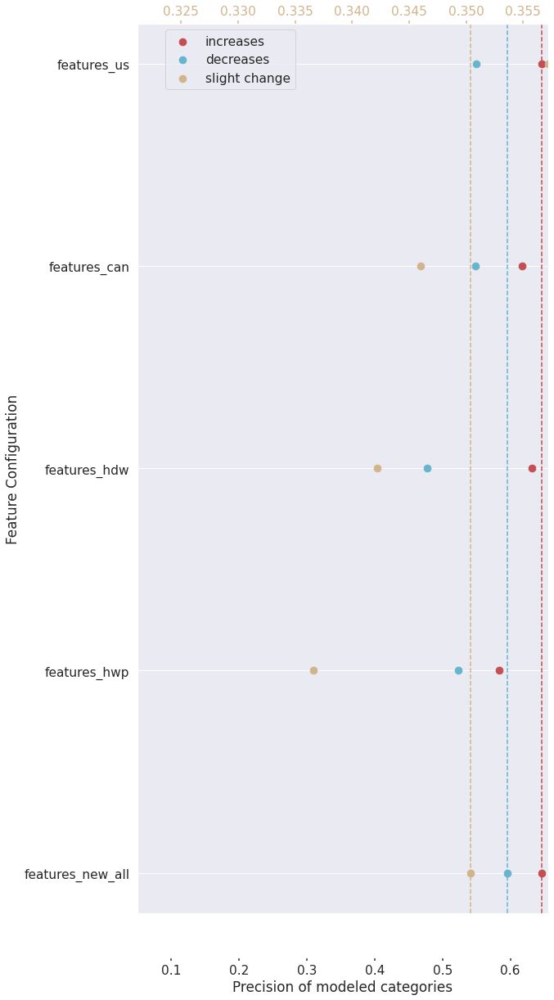

In [119]:
opt_subsets = ['features_new_all','features_hwp','features_hdw','features_can','features_us']

plot_frp_sensitivity_metrics(df_error_metrics, opt_subsets)
plot_f1_sensitivity_metrics(df_error_metrics, opt_subsets)
plot_recall_sensitivity_metrics(df_error_metrics, opt_subsets)
plot_precision_sensitivity_metrics(df_error_metrics, opt_subsets)

# Old version (shown at Irvine)

In [ ]:
#get the irwinids of the test set
incidents_all = pd.read_csv('unique_fires_with_area_and_irwin_192021.csv')
ac = incidents_all[incidents_all['Fire Name']=='AUGUST COMPLEX']
wf = incidents_all[incidents_all['Fire Name']=='Williams Flats']
dix = incidents_all[incidents_all['Fire Name']=='DIXIE']

test_irwin_ids = [ac['irwinID'].values[0][2:38], wf['irwinID'].values[0][2:38], dix['irwinID'].values[0][2:38]]
print(test_irwin_ids)

#do the train-test split
#test fires
data_test = features_no_outliers_weighted.iloc[np.where(features_no_outliers_weighted.irwinID.str.contains('|'.join(test_irwin_ids)))]
print(len(data_test), np.unique(data_test['year']))

#2020 all fires, including August Complex
data_test_2020 = features_no_outliers_weighted[(features_no_outliers_weighted['datetime']>=np.datetime64('2020-01-01 00:00:00'))&
                                              (features_no_outliers_weighted['datetime']<=np.datetime64('2020-12-31 23:00:00'))] #time range
print(len(data_test_2020), np.unique(data_test_2020['year'])) #includes august complex

#2019/2021 Training Set
data_train_1921 = features_no_outliers_weighted[(features_no_outliers_weighted['datetime']<np.datetime64('2020-01-01 00:00:00'))|
                                              (features_no_outliers_weighted['datetime']>np.datetime64('2020-12-31 23:00:00'))]
print(len(data_train_1921), np.unique(data_train_1921['year']))
data_train_1921 = data_train_1921.iloc[np.where(~data_train_1921.irwinID.str.contains('|'.join(test_irwin_ids)))] #drop WF and Dixie
print(len(data_train_1921), np.unique(data_train_1921['year']))

In [ ]:
#PERSISTENCE AND SCALED METHODS

scaled_methods = ['dwind_speed_gridmet','dvpd_gridmet','dwind_speed_hrrrmet','dvpd_hrrrmet',
                  'dhwp','dhd0w0','dhd1w0', 'dhd2w0', 'dhd3w0', 'dIMERG.FINAL.v6_FWI','dburning_index_g'] 

scaled_methods_plot =['dvpd_gridmet', 'dvpd_hrrrmet','dhwp','dhd1w0','dIMERG.FINAL.v6_FWI','dburning_index_g']
thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 0.5

data_test_2020['obs_cat'] = pd.cut(data_test_2020['Log_Scaling_Factor'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
data_test_2020['persistence_cat'] = 'no_change'



#do the calculations
for ii in range(len(scaled_methods)):
    print(scaled_methods[ii])
    #make predictions for all of the holdout year (2020)
    data_test_2020[scaled_methods[ii]+'_logsf'] = np.log10(data_test_2020[scaled_methods[ii]])
    data_test_2020[scaled_methods[ii]+'_sf'] = data_test_2020[scaled_methods[ii]]
    data_test_2020[scaled_methods[ii]+'_frp'] = data_test_2020['FRP_MEAN_1']*data_test_2020[scaled_methods[ii]]
    data_test_2020[scaled_methods[ii]+'_logfrp'] = np.log10(data_test_2020[scaled_methods[ii]+'_frp'])
    data_test_2020[scaled_methods[ii]+'_cat'] = pd.cut(data_test_2020[scaled_methods[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
print(data_test_2020.columns.values)    
#do the plottint
#drop the nans, these will show up in the scaled methods
data_test_2020.replace([np.inf, -np.inf], np.nan, inplace=True)
print(len(data_test_2020))
data_test_2020=data_test_2020.dropna(how='any')
print(len(data_test_2020))

#persistence
frp_hist2d(data_test_2020, 'FRP_MEAN_1', 'FRP_MEAN','log_FRP_MEAN_1', 'log_FRP_MEAN', 'Blues', 0, 50,'Persistence Log(FRP)')
plot_2dhist_withfit(data_test_2020, 'Scaling_Factor_Persistence', 'Scaling_Factor',
                    'Log_Scaling_Factor_Persistence', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
plot_category_heatmap(data_test_2020, 'obs_cat', 'persistence_cat', '2020 RF Prediction') 



for ii in range(len(scaled_methods_plot)):

    #all of 2020, trained on all features 19/21
    frp_hist2d(data_test_2020, scaled_methods_plot[ii]+'_frp', 'FRP_MEAN',scaled_methods_plot[ii]+'_logfrp', 'log_FRP_MEAN', 'Blues', 0, 50,scaled_methods_plot[ii]+' Log(FRP)')
    plot_2dhist_withfit(data_test_2020, scaled_methods_plot[ii]+'_sf', 'Scaling_Factor',scaled_methods_plot[ii]+'_logsf', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
    plot_category_heatmap(data_test_2020, 'obs_cat', scaled_methods_plot[ii]+'_cat', '2020 RF Prediction')  


In [ ]:
with open('features_drop.txt') as f:
    data = f.read()

print("Data type before reconstruction : ", type(data))
# reconstructing the data as a dictionary
feature_subsets = json.loads(data)
  
print("Data type after reconstruction : ", type(feature_subsets))


In [ ]:
# RANDOM FOREST METHOD
# we shouldn't have to drop nans for the RF, as long as we run it AFTER the scaled method cells

thresh_inc = 0.18#0.1#, scaling factor of 1.5
thresh_dec = -0.3#-0.1# scaling factor of 1.5

feature_set_names = ['persistence','features_no_pop', 'features_no_stability', 'features_pft','features_chi']



df_error_metrics = pd.DataFrame(index=feature_set_names, 
                                columns=['LOG_FRP_R2', 'FRP_R2', 'FRP_RMSE', 'FRP_MAD',
                                         'LOG_SF_R2', 'SF_R2', 'SF_RMSE', 'SF_MAD',
                                        'decrease_precision', 'decrease_recall', 'increase_precision', 'increase_recall',
                                        'no_change_precision', 'no_change_recall', 'accuracy'])

#train the random forest
for ii in range(1,len(feature_set_names)):
    training_variables = feature_subsets[feature_set_names[ii]]

    gsearch = RandomForestRegressor(oob_score=True, random_state=42, min_samples_leaf=5) 
    gsearch.fit(data_train_1921.loc[:, training_variables], data_train_1921.loc[:, ['Log_Scaling_Factor']])

    print(feature_set_names[ii] + ' OOB R2 score is: '+ str(gsearch.oob_score_))
    #plot_importances(gsearch, training_variables,feature_set_names[ii])
    
    #make predictions for all of the holdout year (2020)
    data_test_2020['rf_'+feature_set_names[ii]+'_logsf'] = gsearch.predict(data_test_2020.loc[:,training_variables])
    data_test_2020['rf_'+feature_set_names[ii]+'_sf'] = 10**(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'])
    data_test_2020['rf_'+feature_set_names[ii]+'_frp'] = data_test_2020['FRP_MEAN_1']*data_test_2020['rf_'+feature_set_names[ii]+'_sf']
    data_test_2020['rf_'+feature_set_names[ii]+'_logfrp'] = np.log10(data_test_2020['rf_'+feature_set_names[ii]+'_frp'])
    data_test_2020['rf_'+feature_set_names[ii]+'_cat'] = pd.cut(data_test_2020['rf_'+feature_set_names[ii]+'_logsf'].values, 
                                            bins=[-10, thresh_dec, thresh_inc, 10],
                                            labels=['decrease','no_change','increase'])#transform RF SF into categories
    
#get the error metrics
for ii in range(len(feature_set_names)):
    if feature_set_names[ii] =='persistence':
        print('DOING PERSISTENCE')
        errors = summarize_error(data_test_2020,'FRP_MEAN', 'log_FRP_MEAN', 'FRP_MEAN_1', 'log_FRP_MEAN_1')
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'Log_Scaling_Factor', 'persistence', 'log_persistence')
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['persistence_cat'], output_dict=True))
    else:
        errors = summarize_error(data_test_2020,'FRP_MEAN', 'log_FRP_MEAN', 'rf_'+feature_set_names[ii]+'_frp', 'rf_'+feature_set_names[ii]+'_logfrp')
        errors_sf = summarize_error(data_test_2020,'Scaling_Factor', 'Log_Scaling_Factor', 'rf_'+feature_set_names[ii]+'_sf', 'rf_'+feature_set_names[ii]+'_logsf')
        cr=pd.DataFrame(classification_report(data_test_2020['obs_cat'], data_test_2020['rf_'+feature_set_names[ii]+'_cat'], output_dict=True))
    
    df_error_metrics.loc[feature_set_names[ii], 'LOG_FRP_R2'] = errors[0]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_R2'] = errors[1]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_RMSE'] = errors[2]
    df_error_metrics.loc[feature_set_names[ii], 'FRP_MAD'] = errors[3]
    
    df_error_metrics.loc[feature_set_names[ii], 'LOG_SF_R2'] = errors_sf[0]
    df_error_metrics.loc[feature_set_names[ii], 'SF_R2'] = errors_sf[1]
    df_error_metrics.loc[feature_set_names[ii], 'SF_RMSE'] = errors_sf[2]
    df_error_metrics.loc[feature_set_names[ii], 'SF_MAD'] = errors_sf[3]
    
    df_error_metrics.loc[feature_set_names[ii], 'decrease_precision'] = cr.loc['precision', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'decrease_recall'] = cr.loc['recall', 'decrease']
    df_error_metrics.loc[feature_set_names[ii], 'increase_precision'] = cr.loc['precision', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'increase_recall'] = cr.loc['recall', 'increase']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_precision'] = cr.loc['precision', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'no_change_recall'] = cr.loc['recall', 'no_change']
    df_error_metrics.loc[feature_set_names[ii], 'accuracy'] = cr.loc['precision', 'accuracy']

#persistence

df_error_metrics['percent_change_FRP_RMSE'] = (df_error_metrics.loc['persistence','FRP_RMSE']-df_error_metrics['FRP_RMSE'])/df_error_metrics.loc['persistence','FRP_RMSE']
df_error_metrics['percent_change_FRP_MAD'] = (df_error_metrics.loc['persistence','FRP_MAD']-df_error_metrics['FRP_MAD'])/df_error_metrics.loc['persistence','FRP_MAD']


df_error_metrics['percent_change_SF_RMSE'] = (df_error_metrics.loc['persistence','SF_RMSE']-df_error_metrics['SF_RMSE'])/df_error_metrics.loc['persistence','SF_RMSE']
df_error_metrics['percent_change_SF_MAD'] = (df_error_metrics.loc['persistence','SF_MAD']-df_error_metrics['SF_MAD'])/df_error_metrics.loc['persistence','SF_MAD']

    

In [ ]:
stability_sensitivity = ['features_no_pop','features_no_stability','features_pft', 'features_chi']

plot_frp_sensitivity_metrics(df_error_metrics, stability_sensitivity)

In [ ]:
# Plotting
for ii in range(len(stability_sensitivity)):

    frp_hist2d(data_test_2020, 'rf_'+stability_sensitivity[ii]+'_frp', 'FRP_MEAN','rf_'+stability_sensitivity[ii]+'_logfrp', 'log_FRP_MEAN', 'Blues', 0, 50,'RF Log(FRP)')
    plot_2dhist_withfit(data_test_2020, 'rf_'+stability_sensitivity[ii]+'_sf', 'Scaling_Factor','rf_'+stability_sensitivity[ii]+'_logsf', 'Log_Scaling_Factor',-.3, .18,   'All 2020')
    plot_category_heatmap(data_test_2020, 'obs_cat', 'rf_'+stability_sensitivity[ii]+'_cat', '2020 RF Prediction')  


    print('Fraction within a factor of two: ' + str(len(np.where((data_test_2020['FRP_MEAN_1']<=2*data_test_2020['FRP_MEAN'])&
              (data_test_2020['FRP_MEAN_1']>=0.5*data_test_2020['FRP_MEAN']))[0])/len(data_test_2020)))
    
    print('Fraction within a factor of two: ' + str(len(np.where((data_test_2020['rf_'+stability_sensitivity[ii]+'_frp']<=2*data_test_2020['FRP_MEAN'])&
              (data_test_2020['rf_'+stability_sensitivity[ii]+'_frp']>=0.5*data_test_2020['FRP_MEAN']))[0])/len(data_test_2020)))
    
    